In [1]:
import numpy as np
import h5py
import os
import glob
from utilityFunctions import load_csv_to_matrix, load_csv_to_matrix_batch, compute_color_preference_raw_batch, compute_color_preference_distance_batch, show_heatmaps, compute_color_similarity_distance_batch, compute_correlations, RSA, split_and_average_matrices, perform_mds_and_plot
from utilityFunctions_GWOT import GWD_and_find_best, GWD_and_plot
import itertools
from scipy.stats import ttest_ind, mannwhitneyu 

In [7]:
unique_colours = np.array(['#d2b700', '#db8b08', '#c7512c', '#c13547', '#a03663', '#753a7a', '#4b488e', '#005692', '#006a8b', '#007b75', '#008a52', '#9aa400'])
colour_index = {colour: idx for idx, colour in enumerate(unique_colours)}
matrix_size = len(unique_colours)
folder_path = 'raw_data/202411_data'

In [3]:
def load_clusters_from_mat_v73(file_path):
    with h5py.File(file_path, 'r') as f:
        print("Keys:", list(f.keys()))  # Inspect available variables

        clusters = f['clusters']
        # Assume it's a 2x1 cell array, and each cell points to a dataset
        cluster1_ref = clusters[0][0]
        cluster2_ref = clusters[1][0]

        cluster1 = np.array(f[cluster1_ref]).astype(int).flatten()
        cluster2 = np.array(f[cluster2_ref]).astype(int).flatten()

        return cluster1, cluster2

In [12]:
def reorder_matrices_by_row_average_with_indices(matrices):
    reordered_matrices = []
    sorting_indices_list = []

    for matrix in matrices:
        row_averages = np.mean(matrix, axis=1)
        sorted_indices = np.argsort(-row_averages)

        # Reorder both rows and columns using the same indices
        reordered_matrix = matrix[sorted_indices, :][:, sorted_indices]

        reordered_matrices.append(reordered_matrix)
        sorting_indices_list.append(sorted_indices)
    
    return reordered_matrices, sorting_indices_list

In [4]:
cluster1, cluster2 = load_clusters_from_mat_v73('raw_data/clusters_preference_raw.mat')
print(cluster1)
print(cluster2)

Keys: ['#refs#', 'clusters', 'participants', 'process_type', 'rating_type']
[ 1 15 12  7 11  5  8 10  4 13 18]
[ 2 19  6  3 16  9 14 17]


In [26]:
cluster_1_matrices_preference = []
cluster_1_matrices_similarity = []

for subject_id in cluster1:
    # Construct glob pattern
    subject_pattern = f"subject_{subject_id:02d}_*.csv"
    search_path = os.path.join(folder_path, subject_pattern)

    matched_files = glob.glob(search_path)

    if not matched_files:
        print(f"No file found for subject {subject_id}")
        continue  # Skip if no match

    file_path = matched_files[0]  # Use the first match
    matrix_preference = load_csv_to_matrix(file_path, 'preference', colour_index, matrix_size)
    matrix_similarity = load_csv_to_matrix(file_path, 'similarity', colour_index, matrix_size)
    cluster_1_matrices_preference.append(matrix_preference)
    cluster_1_matrices_similarity.append(matrix_similarity)

cluster_1_matrices_raw_preference = compute_color_preference_raw_batch(cluster_1_matrices_preference, value_range_max = 3.5)
cluster_1_matrices_similarity_distance = compute_color_similarity_distance_batch(cluster_1_matrices_similarity)

cluster_2_matrices_preference = []
cluster_2_matrices_similarity = []
for subject_id in cluster2:
    # Construct glob pattern
    subject_pattern = f"subject_{subject_id:02d}_*.csv"
    search_path = os.path.join(folder_path, subject_pattern)

    matched_files = glob.glob(search_path)

    if not matched_files:
        print(f"No file found for subject {subject_id}")
        continue  # Skip if no match

    file_path = matched_files[0]  # Use the first match
    matrix_preference = load_csv_to_matrix(file_path, 'preference', colour_index, matrix_size)
    matrix_similarity = load_csv_to_matrix(file_path, 'similarity', colour_index, matrix_size)
    cluster_2_matrices_preference.append(matrix_preference)
    cluster_2_matrices_similarity.append(matrix_similarity)

cluster_2_matrices_raw_preference = compute_color_preference_raw_batch(cluster_2_matrices_preference)
cluster_2_matrices_similarity_distance = compute_color_similarity_distance_batch(cluster_2_matrices_similarity)

In [27]:
cluster_1_matrices_raw_preference_reordered, row_sorting_indices = reorder_matrices_by_row_average_with_indices(cluster_1_matrices_raw_preference)
cluster_1_matrices_similarity_distance_reordered = [
    matrix[indices] for matrix, indices in zip(cluster_1_matrices_similarity_distance, row_sorting_indices)
]

In [28]:
cluster_2_matrices_raw_preference_reordered, row_sorting_indices = reorder_matrices_by_row_average_with_indices(cluster_2_matrices_raw_preference)
cluster_2_matrices_similarity_distance_reordered = [
    matrix[indices] for matrix, indices in zip(cluster_2_matrices_similarity_distance, row_sorting_indices)
]

In [29]:
len(cluster_1_matrices_similarity_distance_reordered)

11

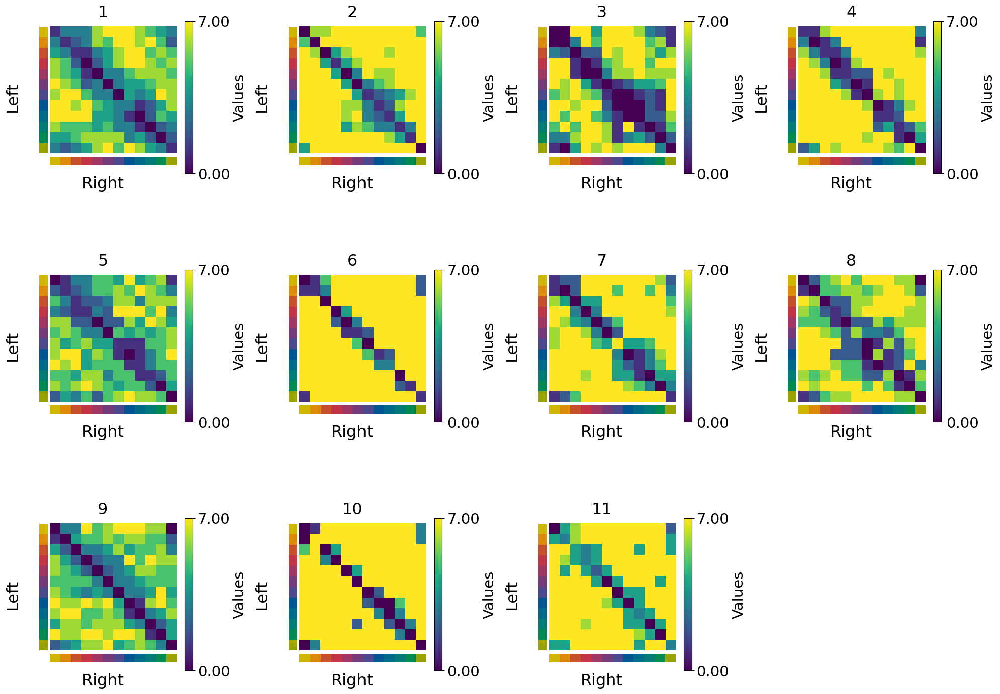

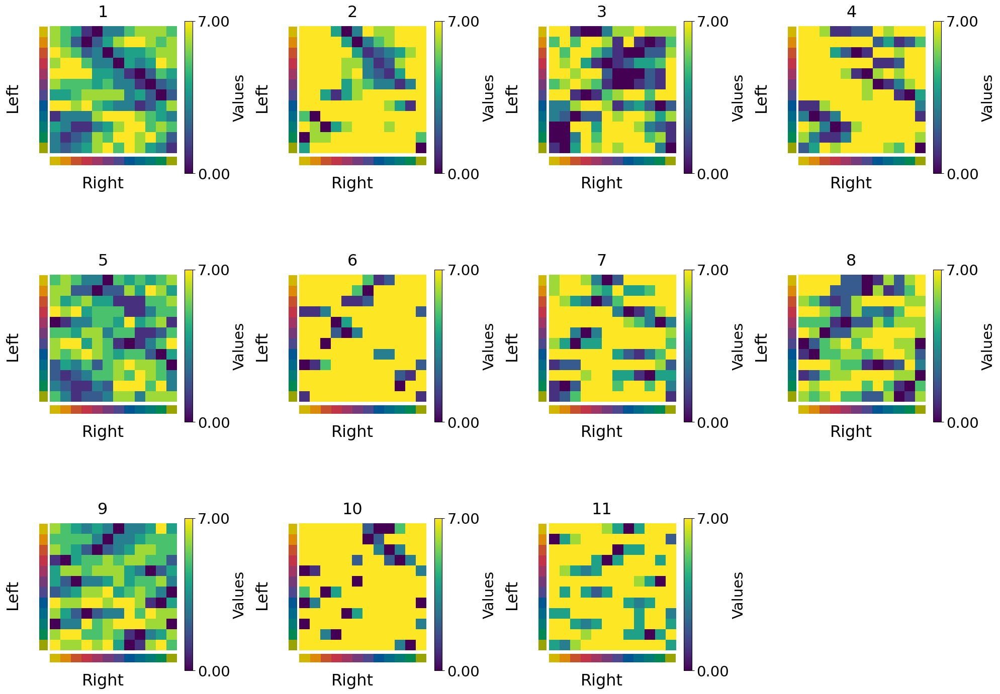

In [31]:
show_heatmaps(vmin_val=0, vmax_val=7, matrices=cluster_1_matrices_similarity_distance, titles=list(range(1, 12)), nrows=3, ncols=4, cmap_name="viridis", cbar_label="Values", color_labels=unique_colours)
show_heatmaps(vmin_val=0, vmax_val=7, matrices=cluster_1_matrices_similarity_distance_reordered, titles=list(range(1, 12)), nrows=3, ncols=4, cmap_name="viridis", cbar_label="Values", color_labels=unique_colours)

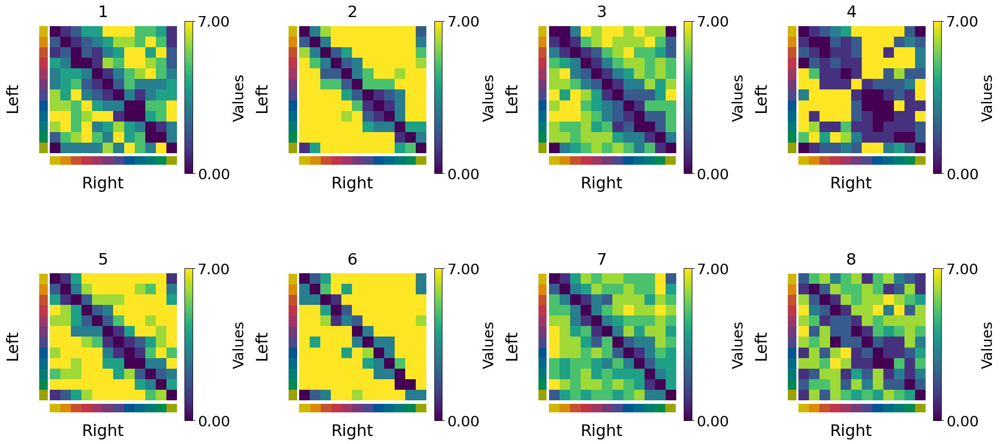

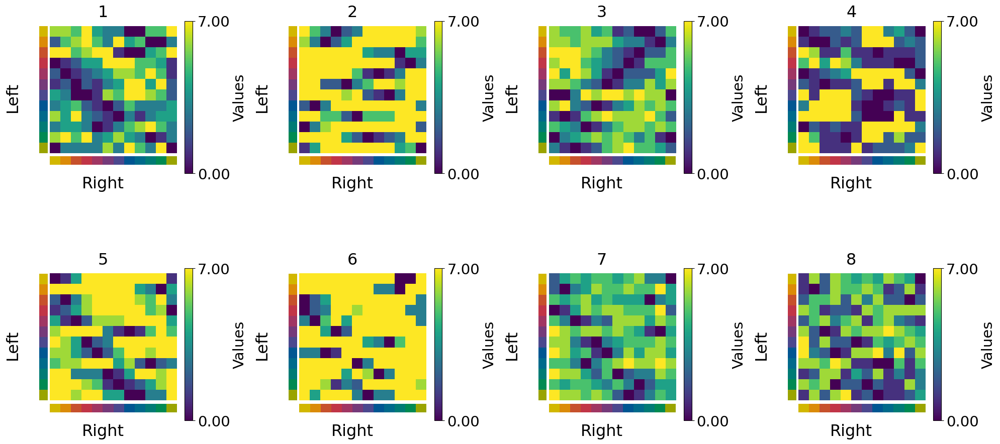

In [24]:
show_heatmaps(vmin_val=0, vmax_val=7, matrices=cluster_2_matrices_similarity_distance, titles=list(range(1, 9)), nrows=2, ncols=4, cmap_name="viridis", cbar_label="Values", color_labels=unique_colours)
show_heatmaps(vmin_val=0, vmax_val=7, matrices=cluster_2_matrices_similarity_distance_reordered, titles=list(range(1, 9)), nrows=2, ncols=4, cmap_name="viridis", cbar_label="Values", color_labels=unique_colours)

In [34]:
### GWOT configuration
n_eps = 15 # number of epsilon values tried
eps_range = [0.04, 5] # the range of epsilon searched
epsilons = np.logspace(np.log10(eps_range[0]), np.log10(eps_range[1]), n_eps) # epsilon values

Best epsilon: 1.2584989506418272, Minimum GWD: 6.261


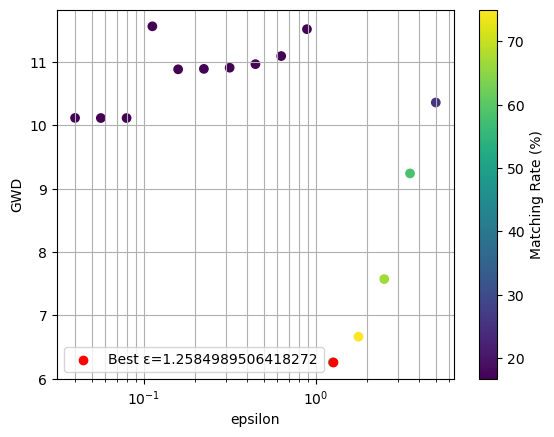

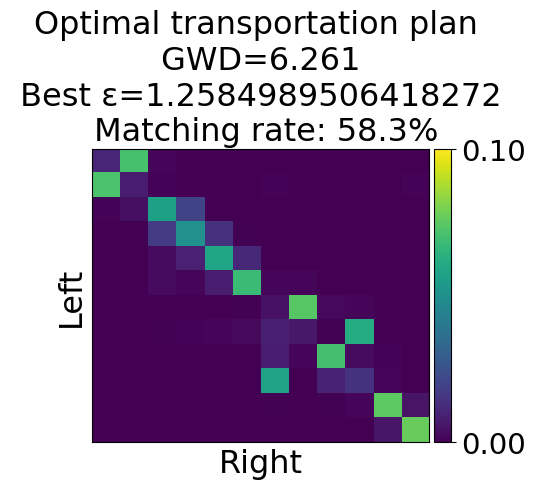

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.194


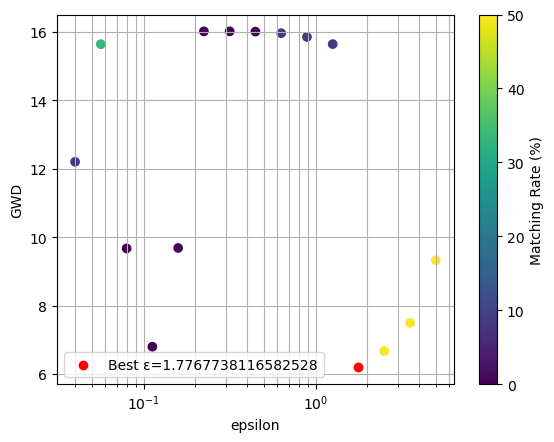

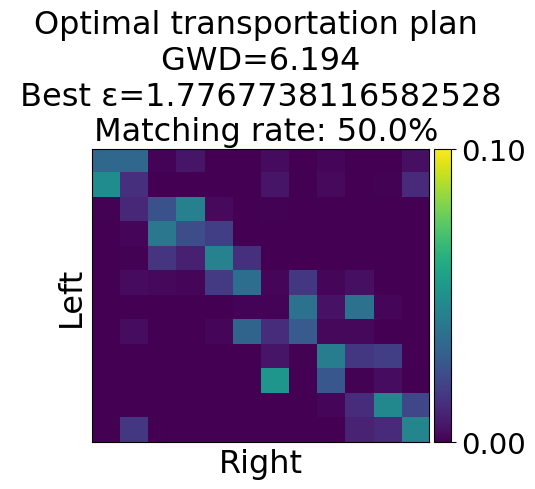

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.584


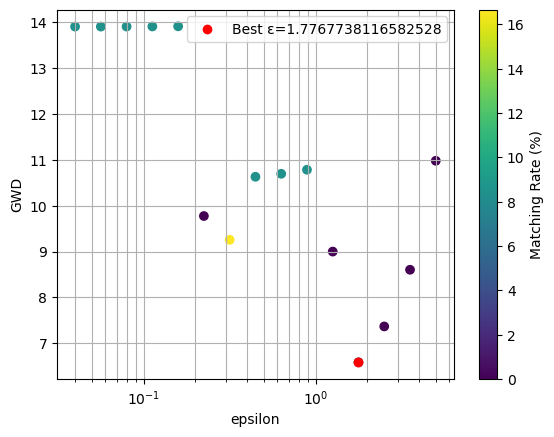

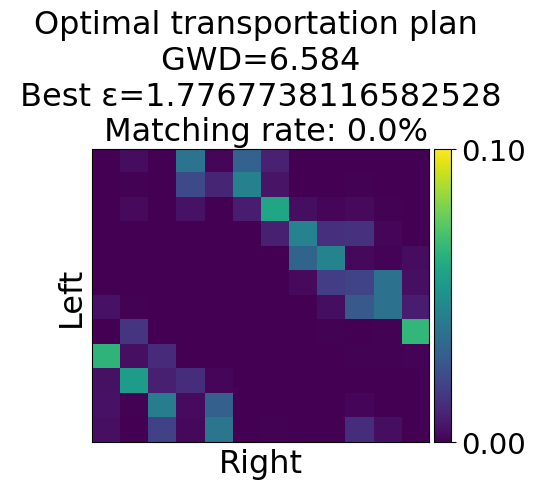

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.1125635681298911, Minimum GWD: 3.436


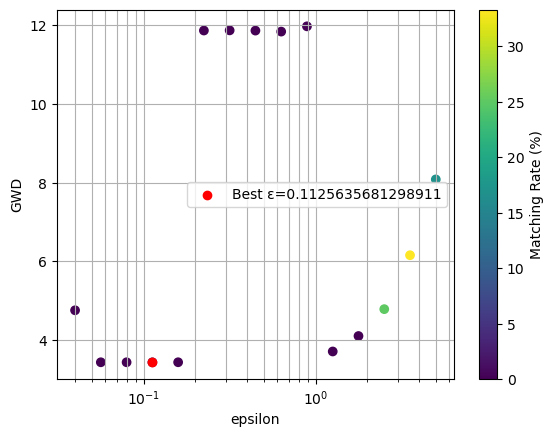

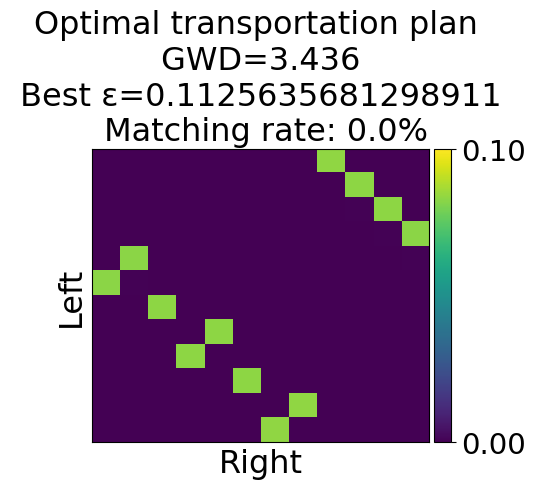

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 8.269


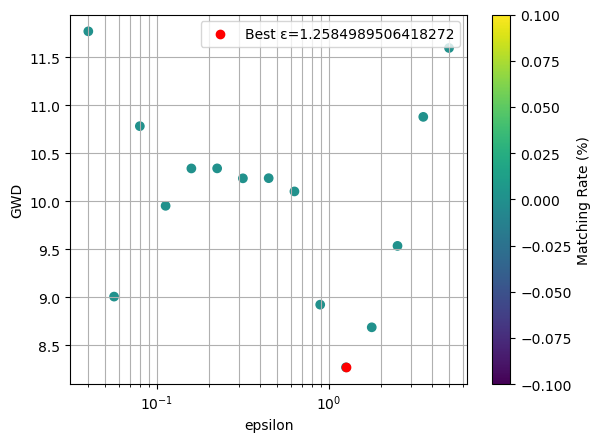

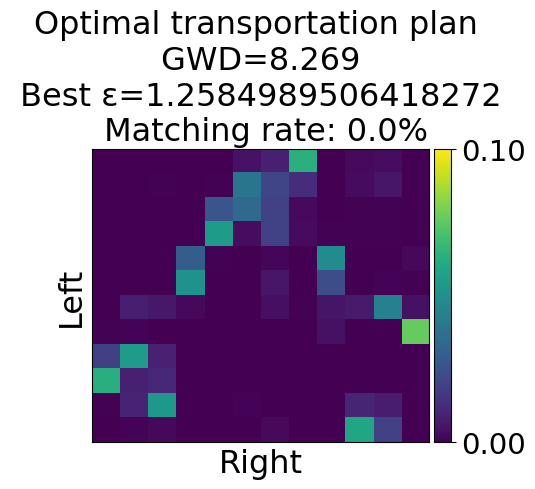

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 6.804


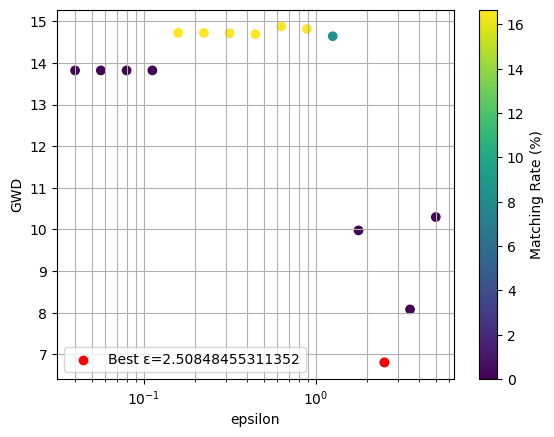

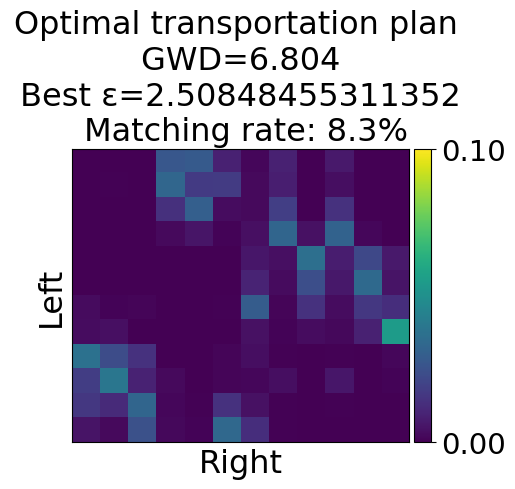

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 7.901


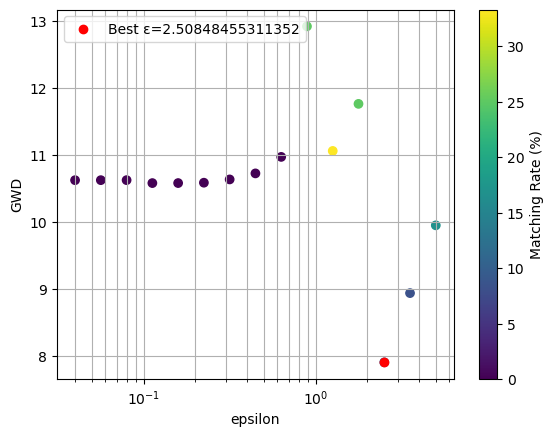

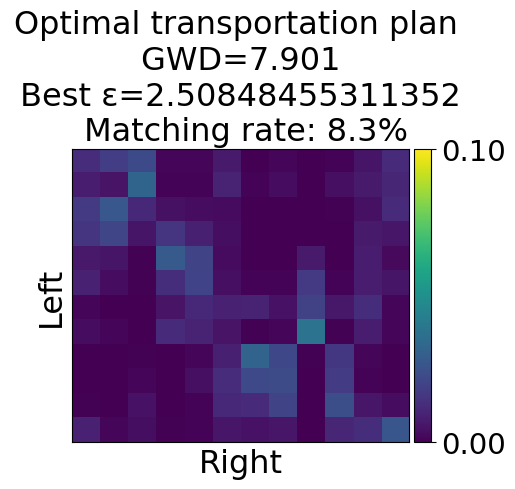

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.22436567925080053, Minimum GWD: 4.613


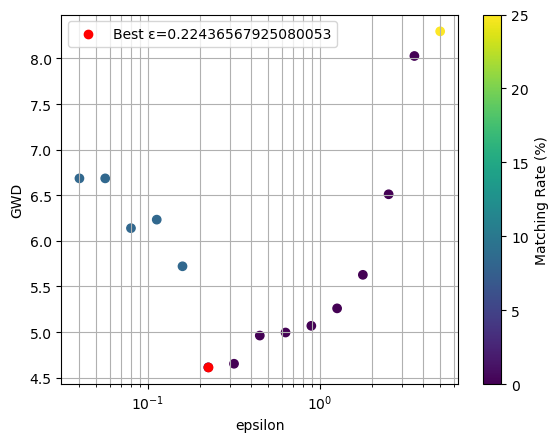

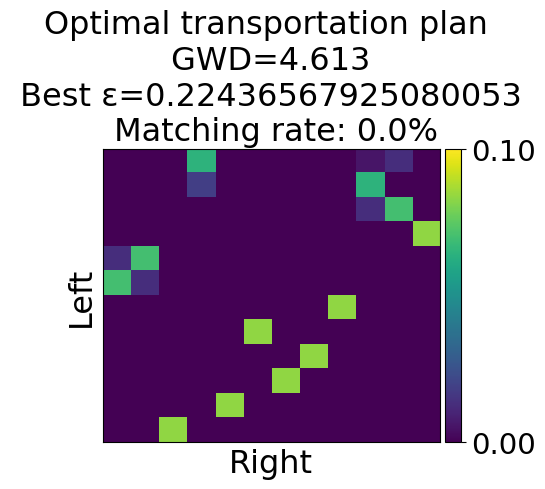

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 8.337


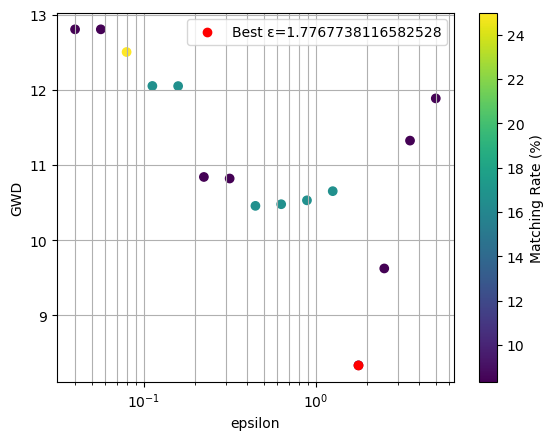

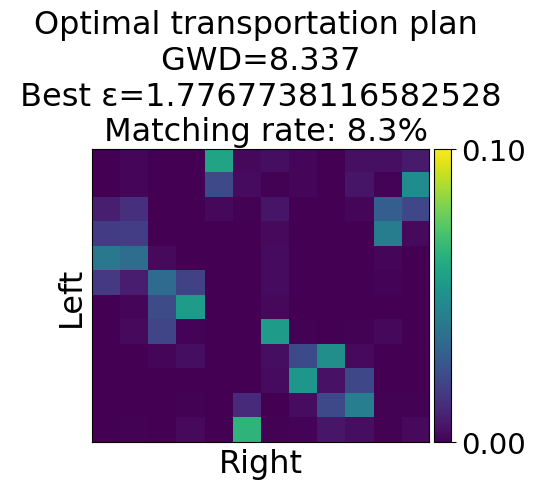

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 6.866


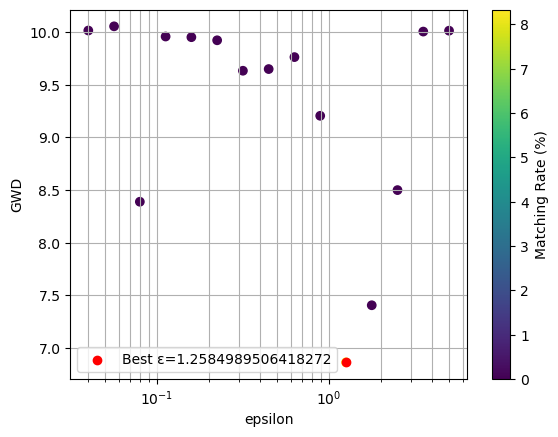

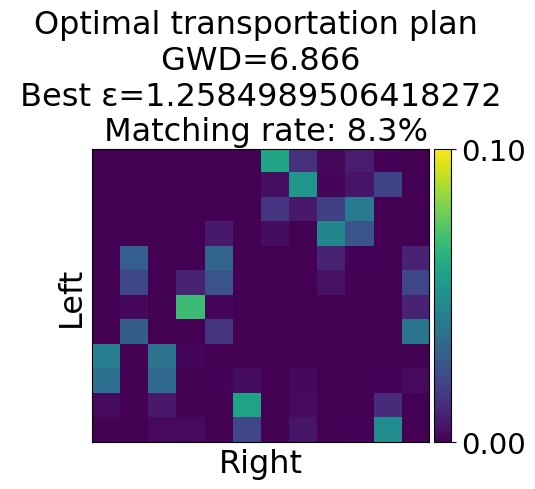

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.22436567925080053, Minimum GWD: 7.318


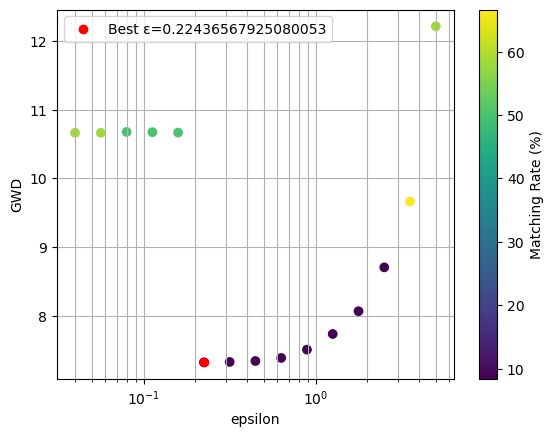

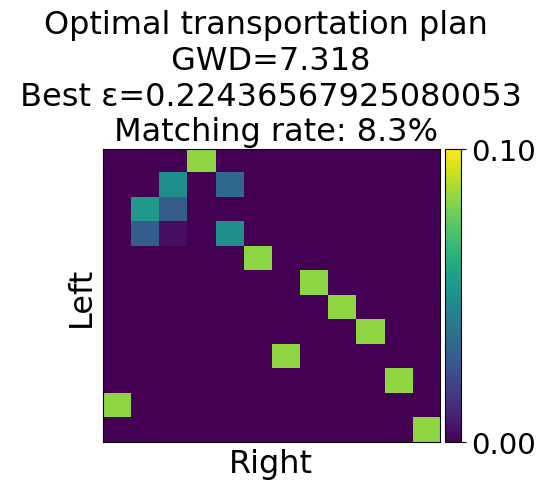

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 3.445


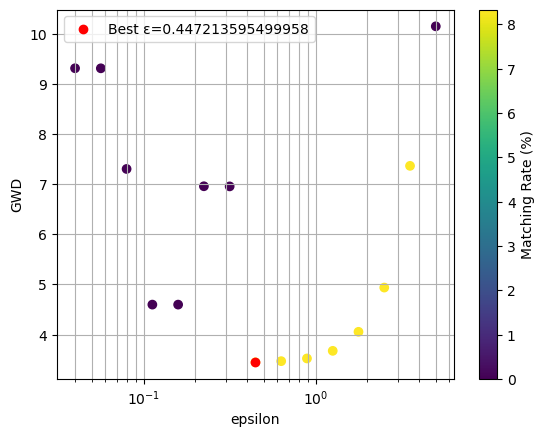

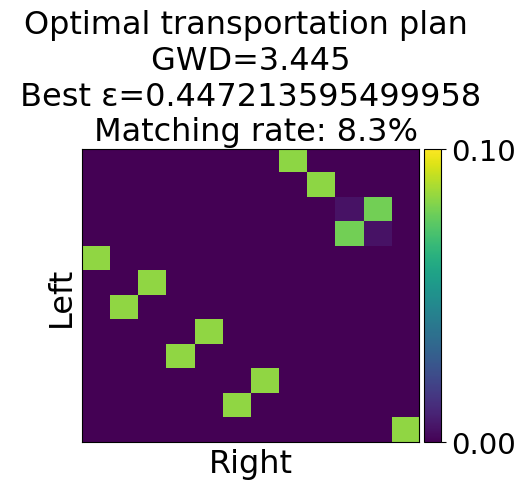

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 5.465


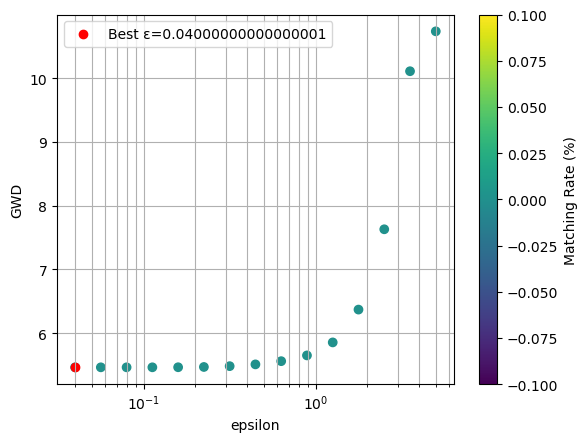

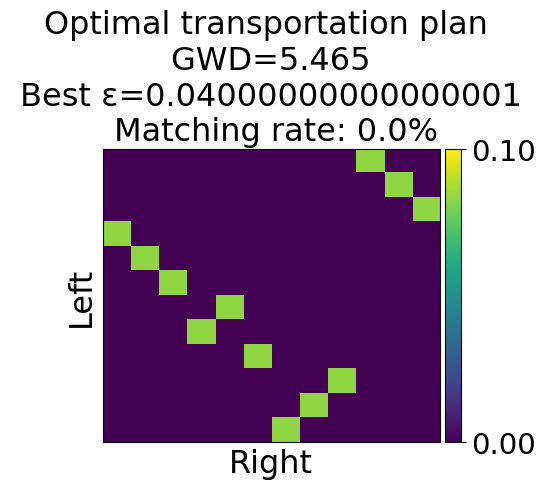

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.295


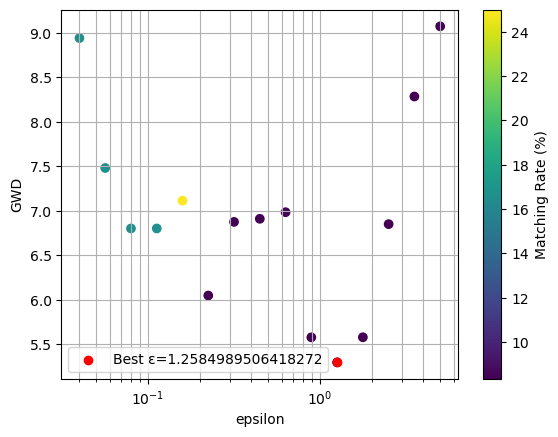

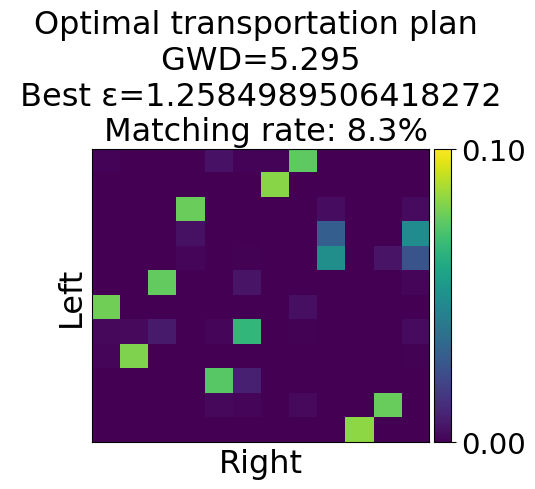

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 5.885


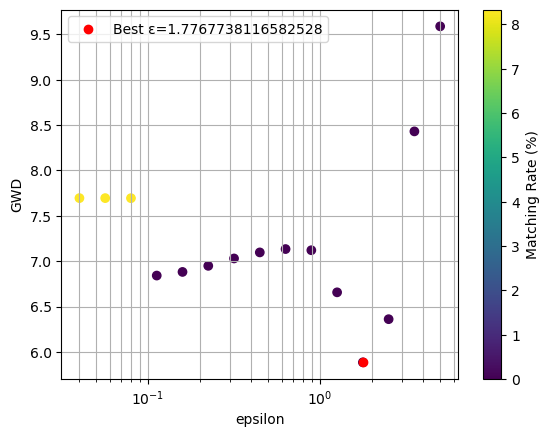

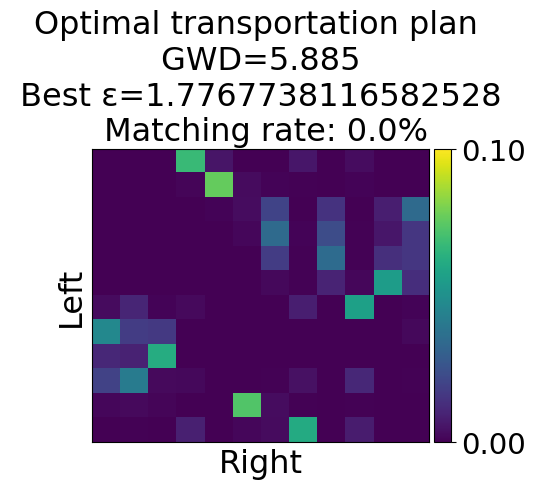

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 5.350


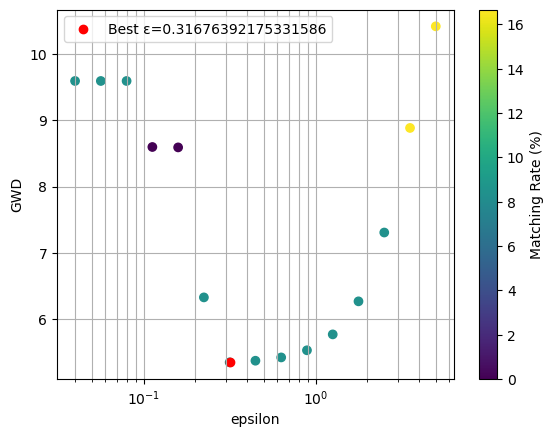

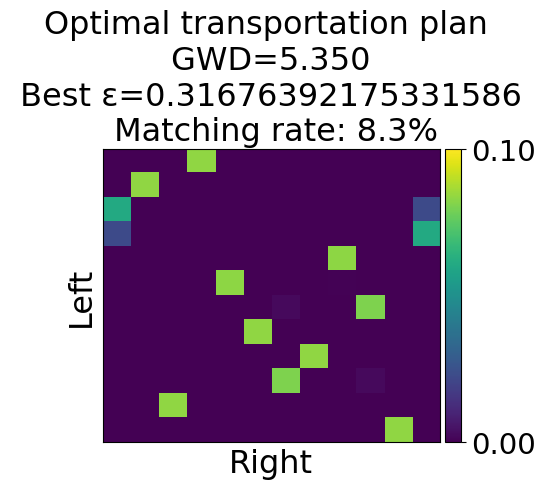

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.640


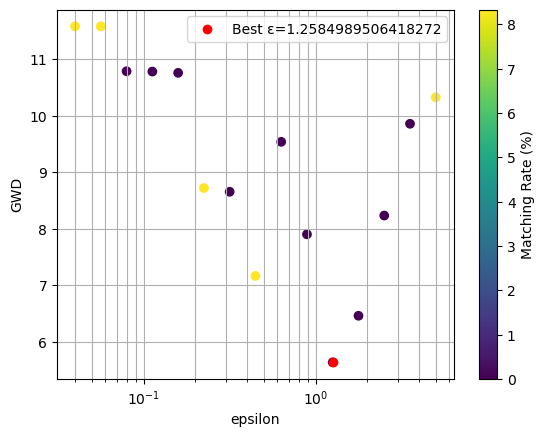

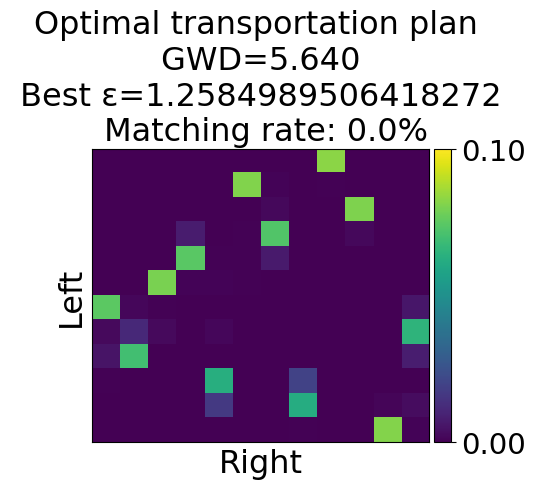

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 3.869


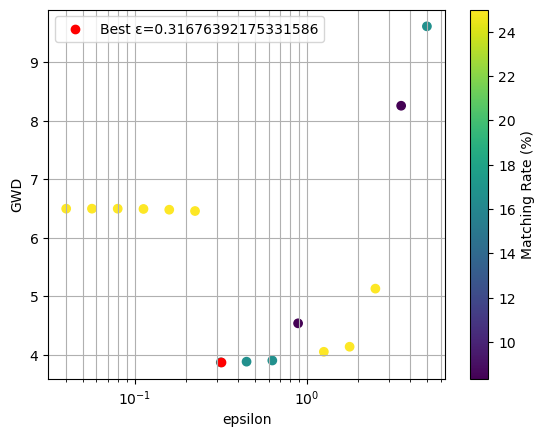

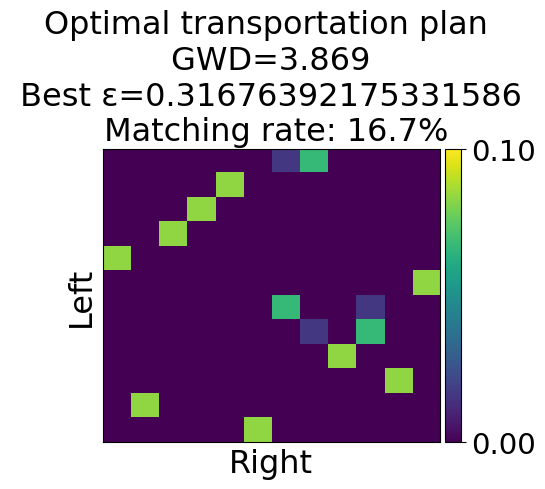

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.757


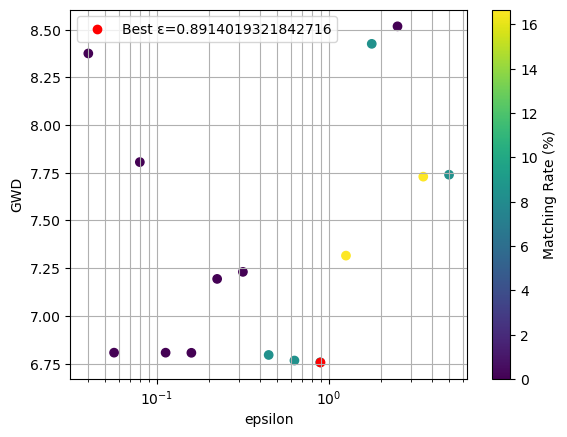

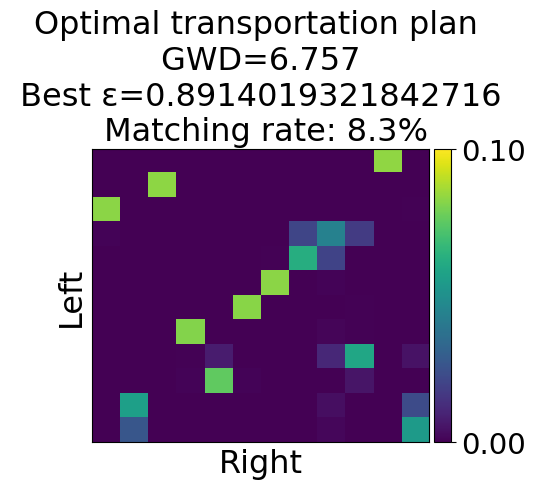

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 2
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 5.862


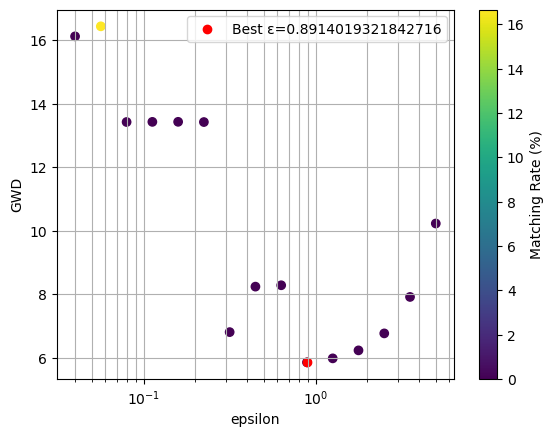

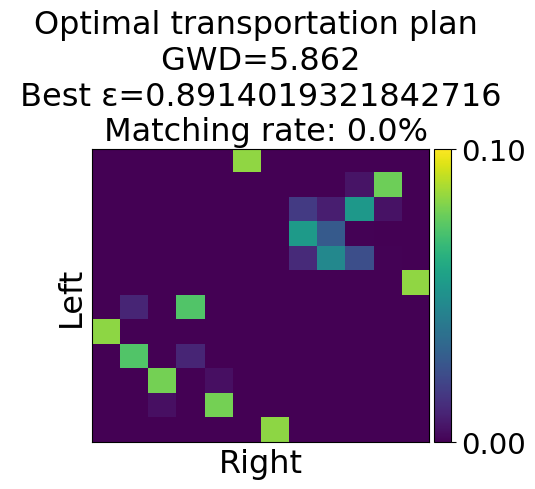

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.15891948094037048, Minimum GWD: 5.260


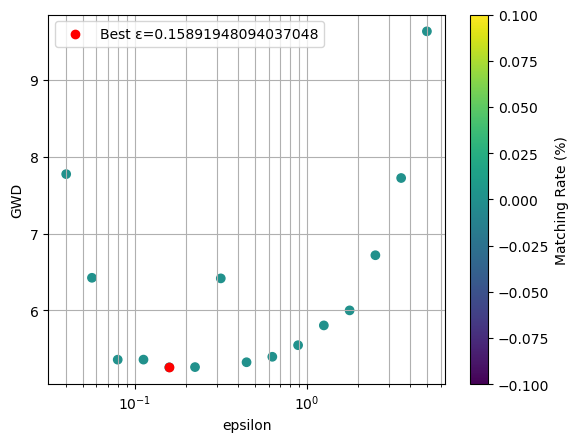

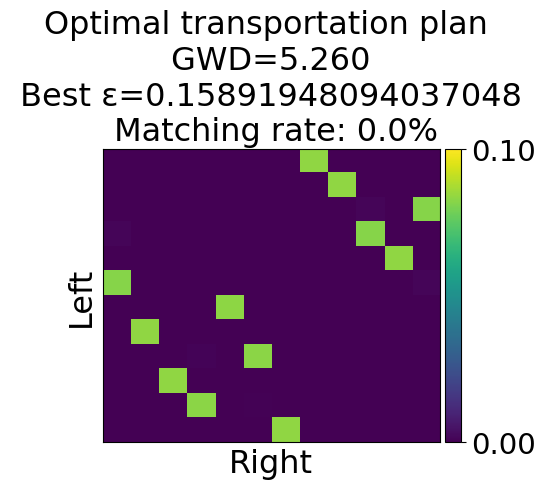

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.6313850355589193, Minimum GWD: 10.606


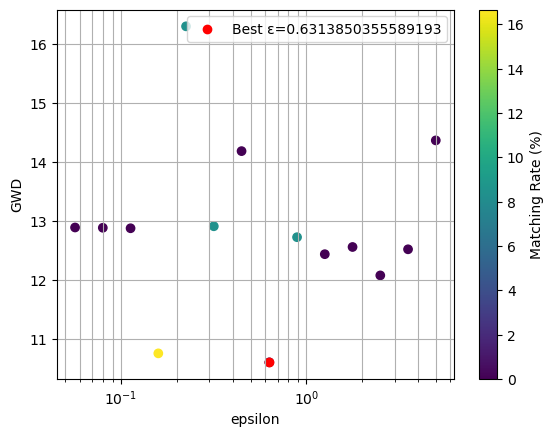

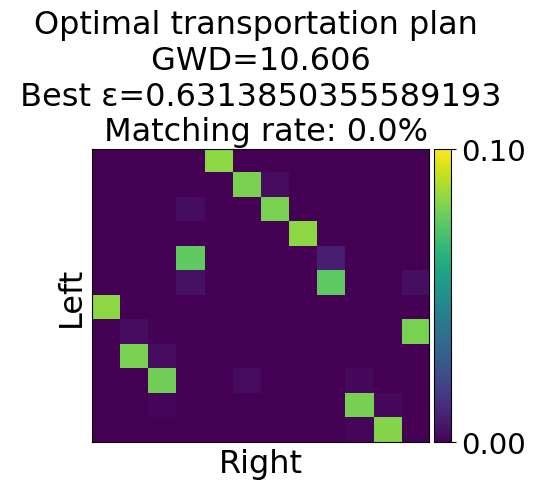

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 8.598


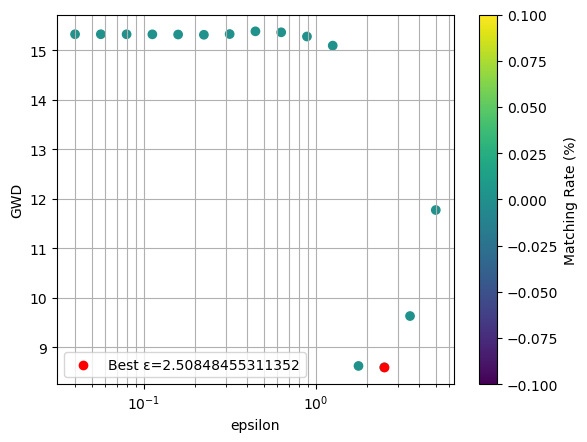

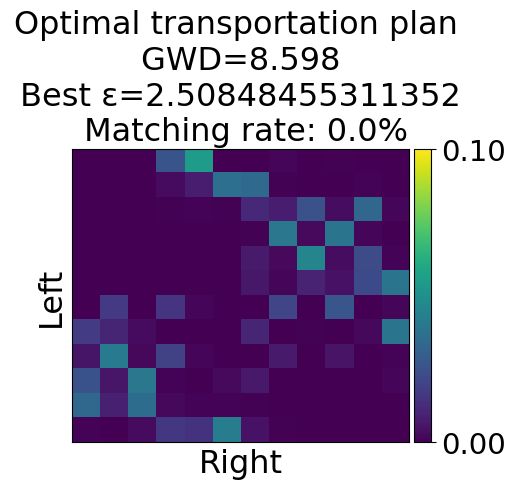

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 6.085


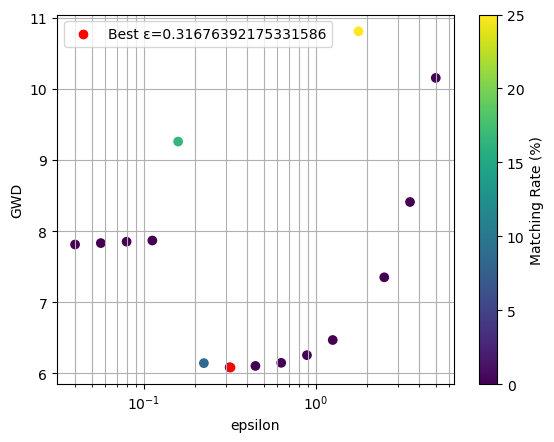

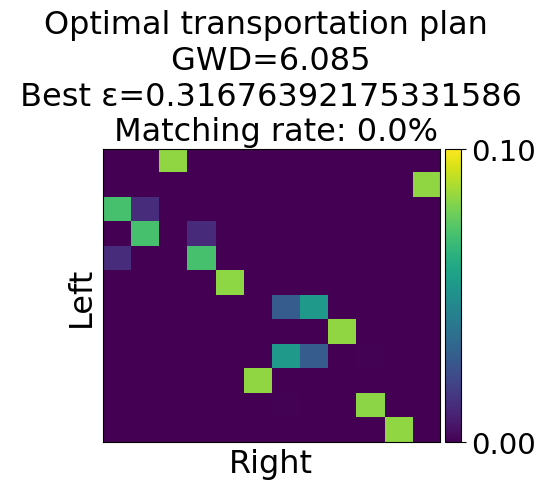

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.082


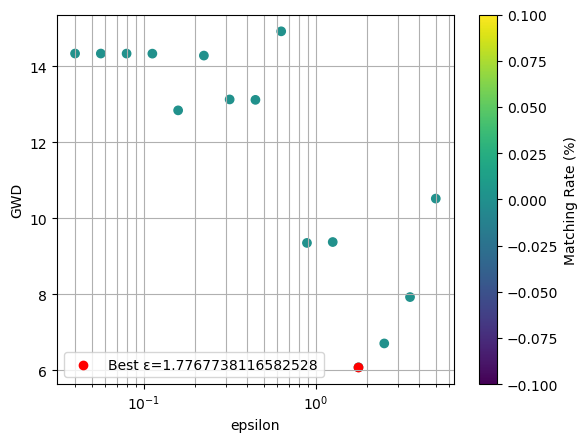

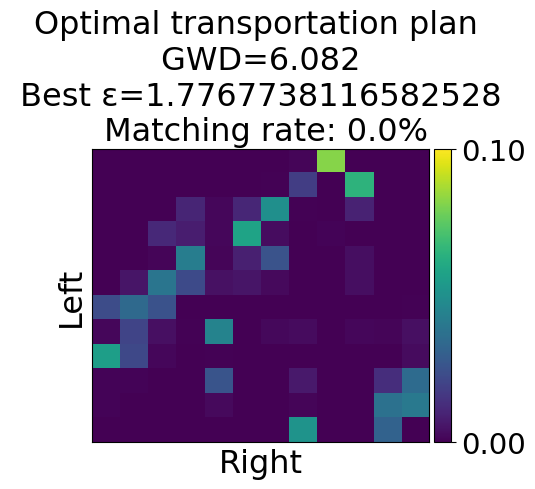

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 3.5415283092991934, Minimum GWD: 10.860


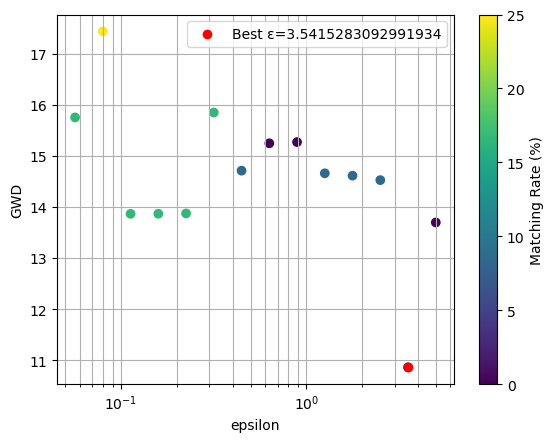

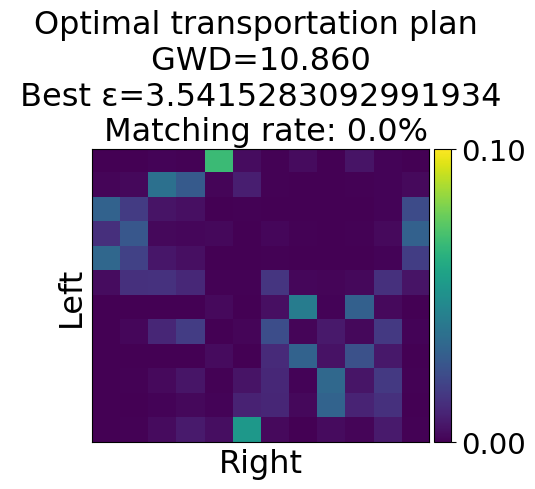

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 10.511


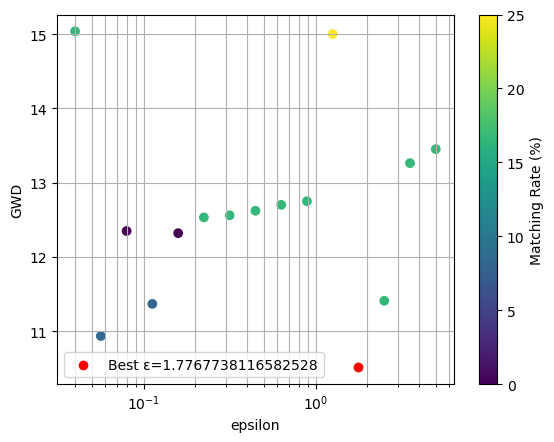

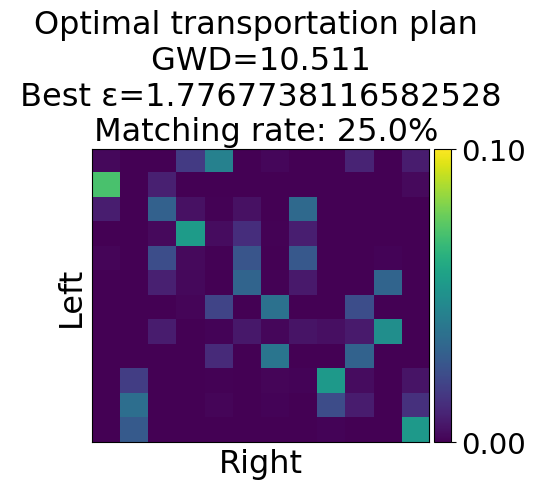

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 6.438


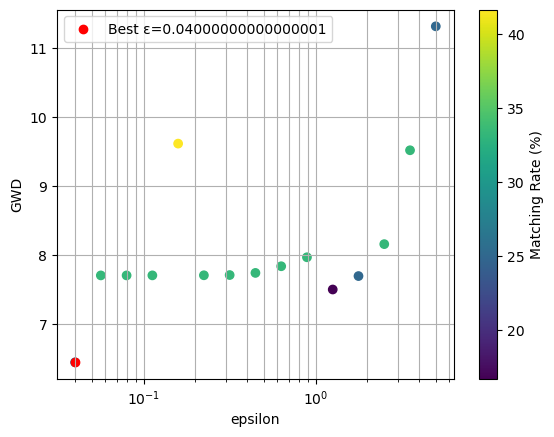

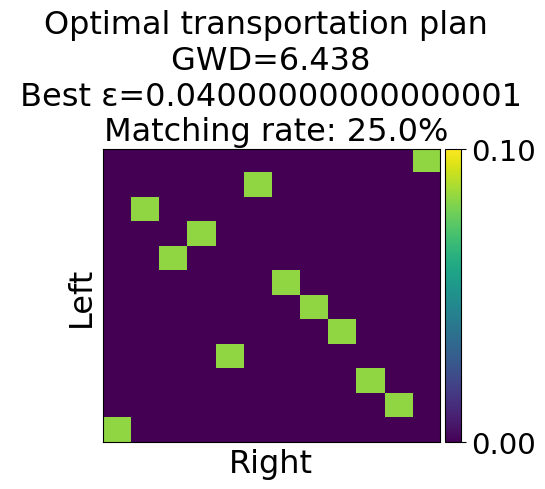

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 7.036


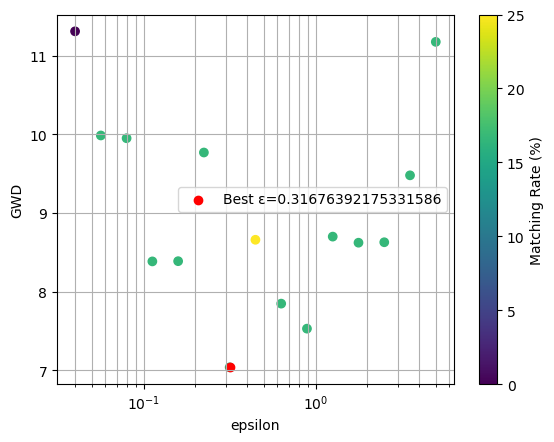

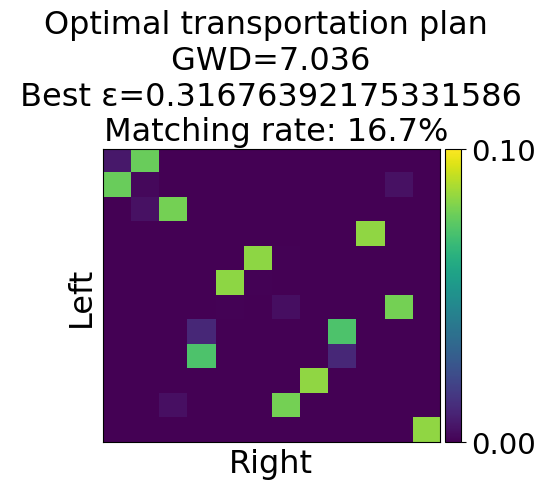

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 4.826


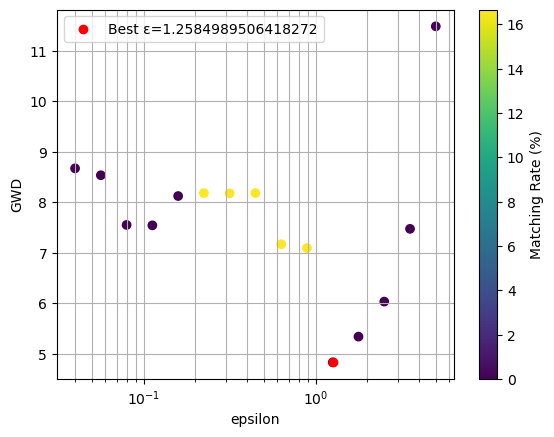

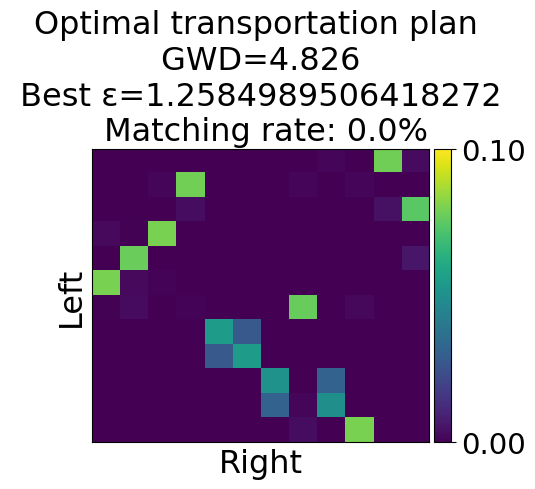

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 5.562


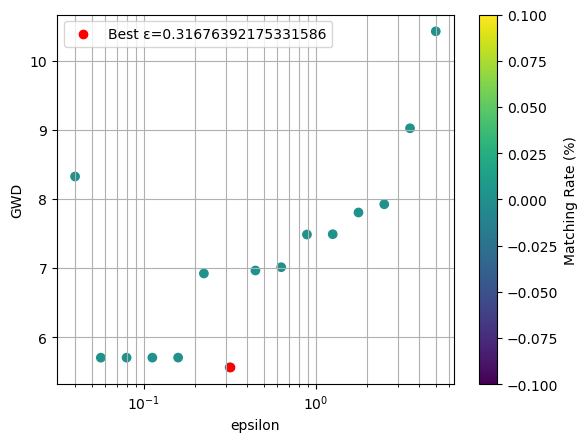

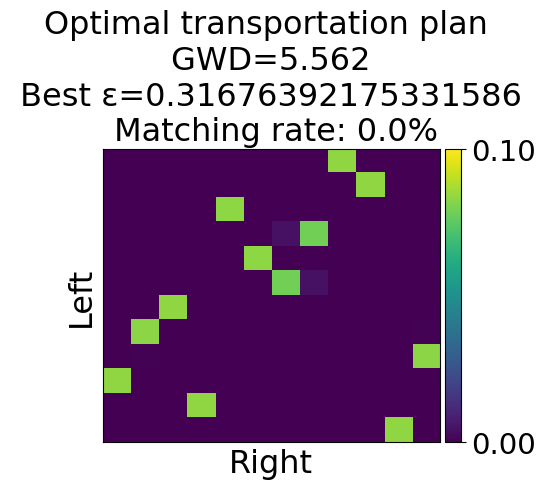

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.557


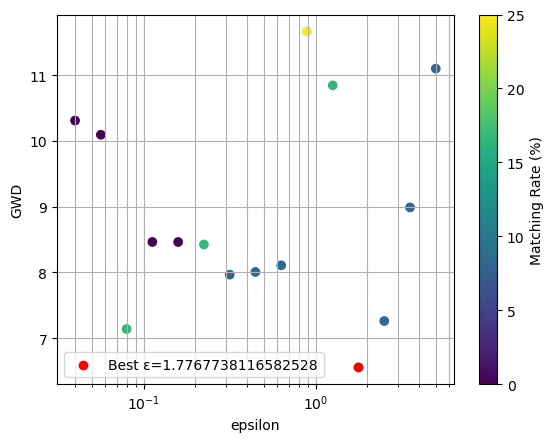

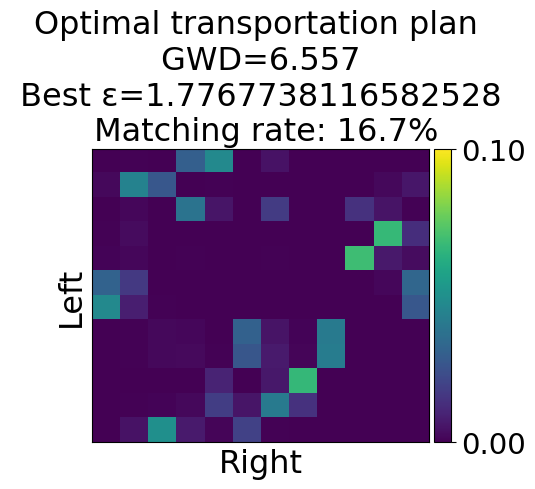

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 7.652


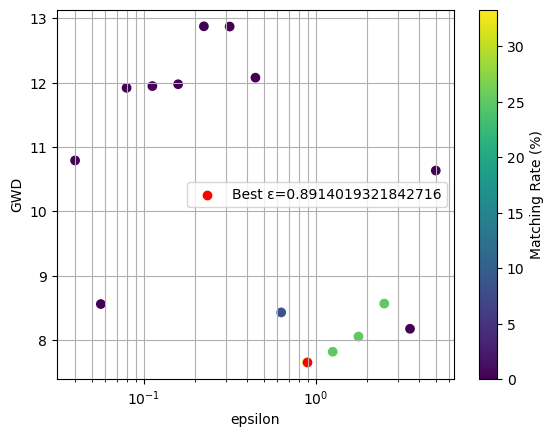

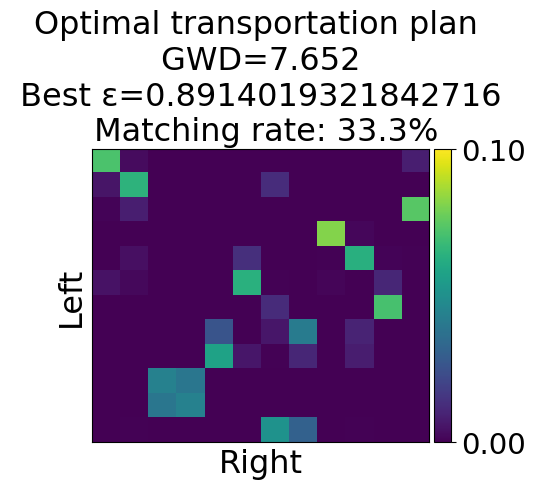

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 9.263


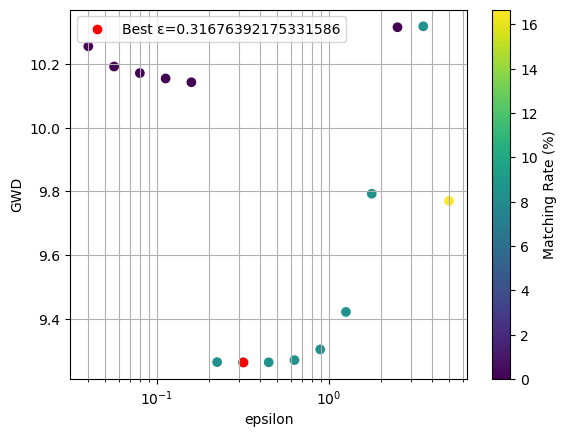

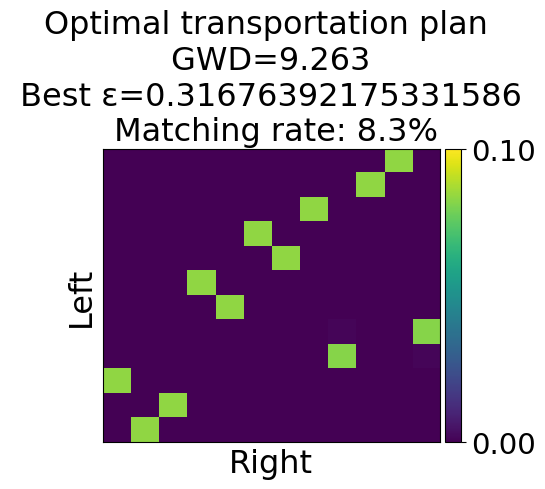

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 9.015


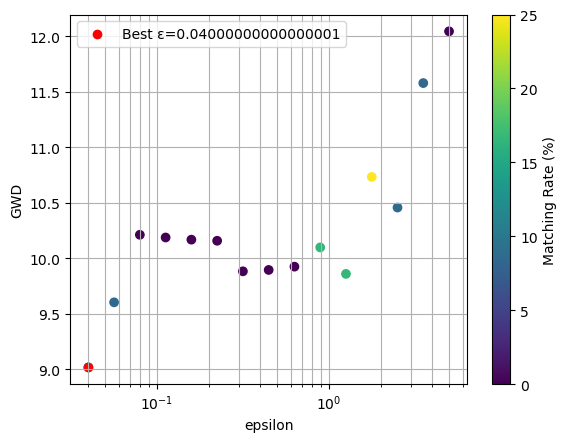

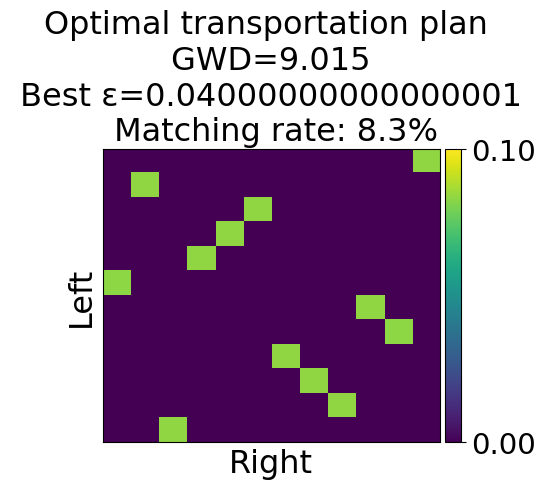

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 6.688


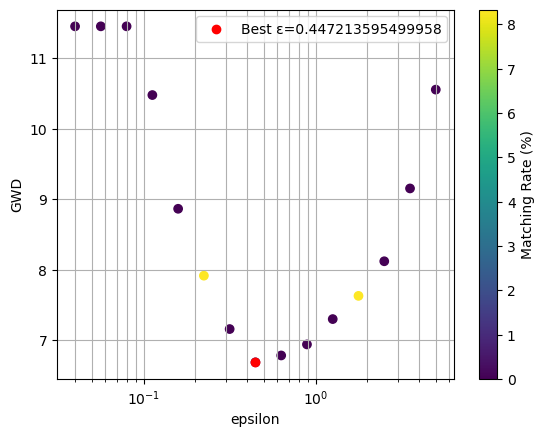

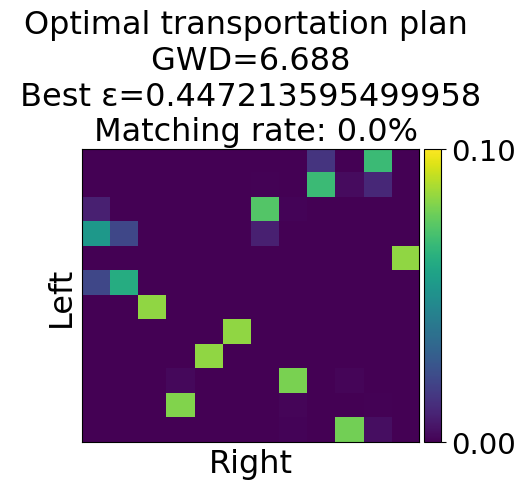

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 7.004


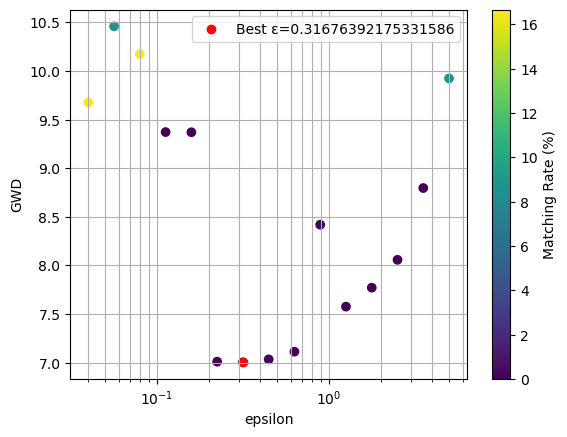

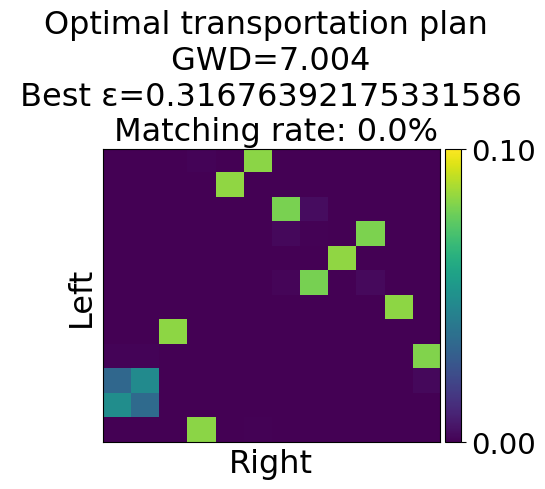

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 4.087


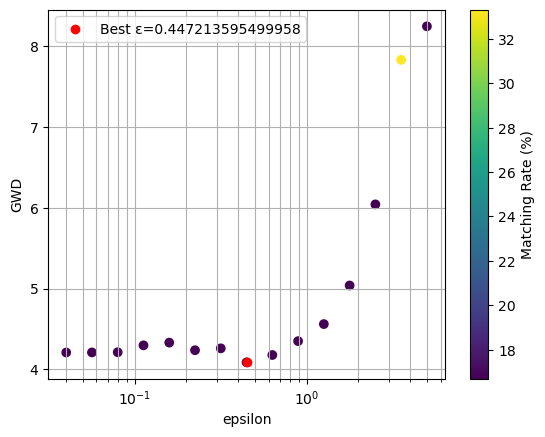

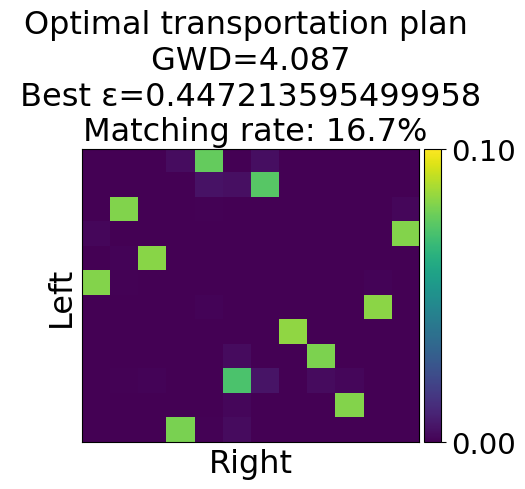

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 8.089


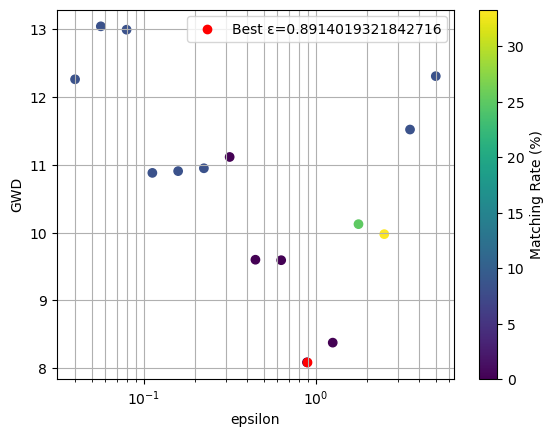

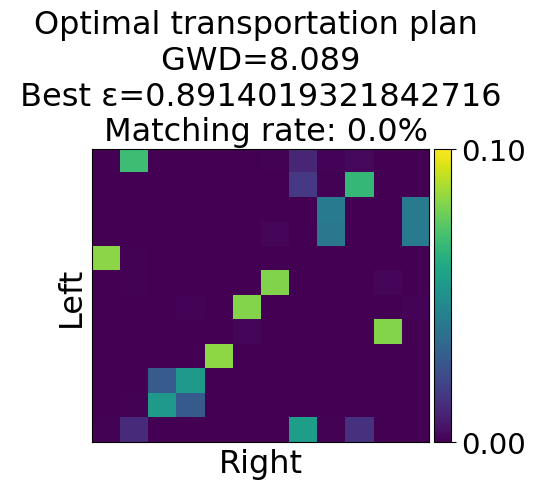

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 8.137


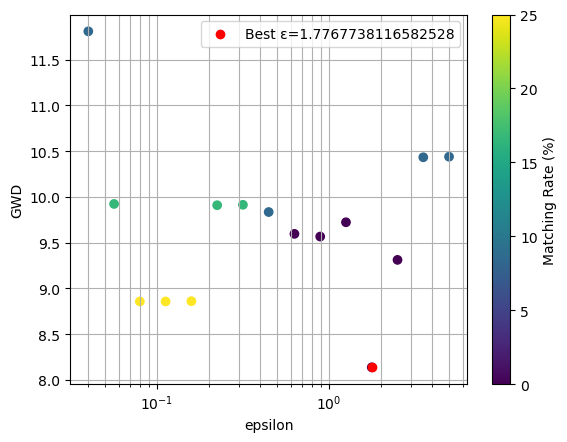

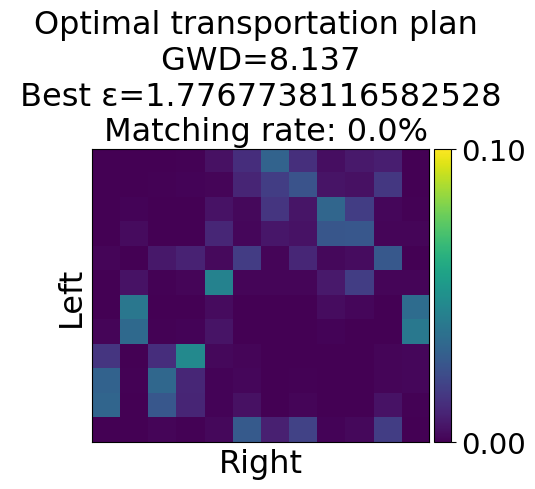

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 4.356


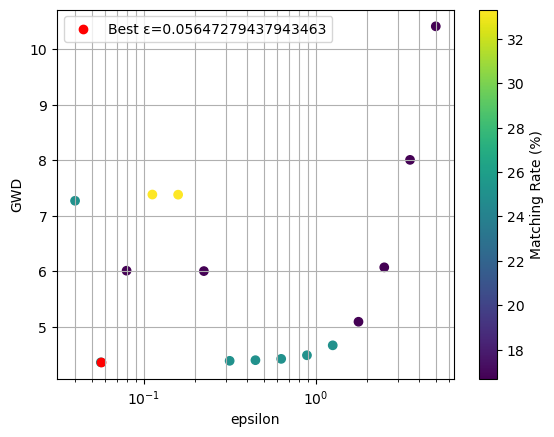

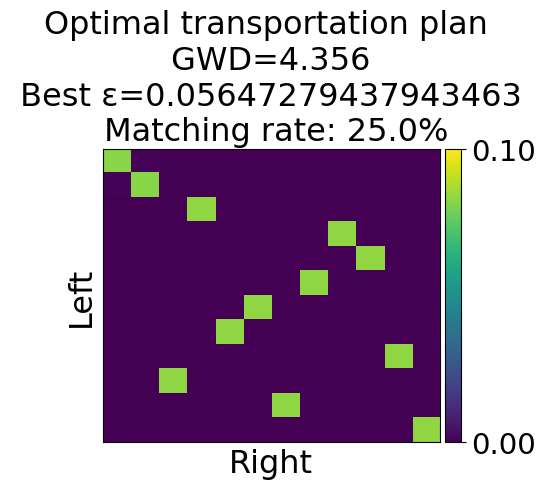

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.963


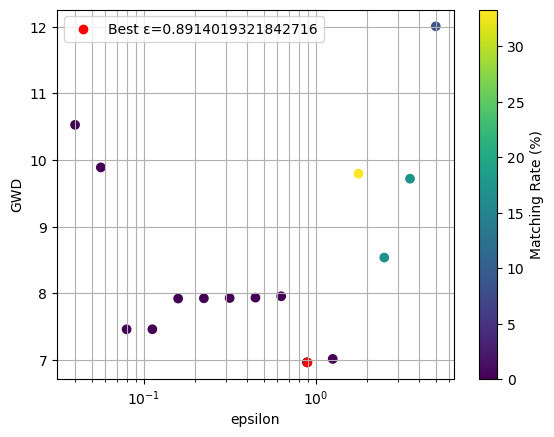

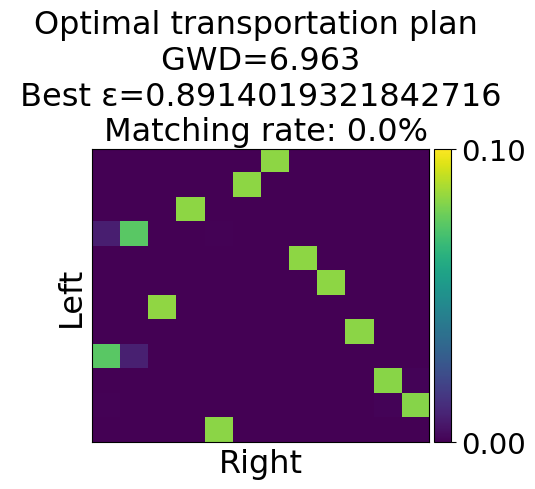

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 10.726


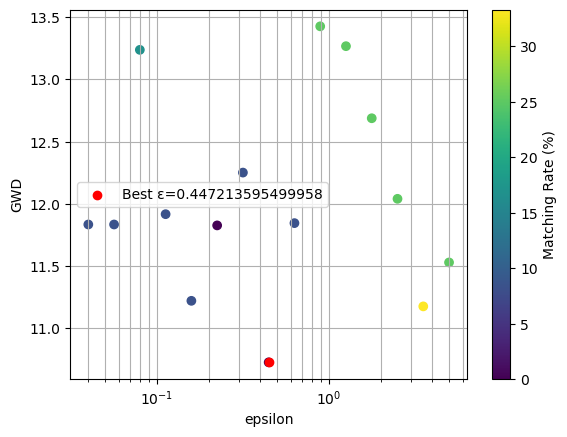

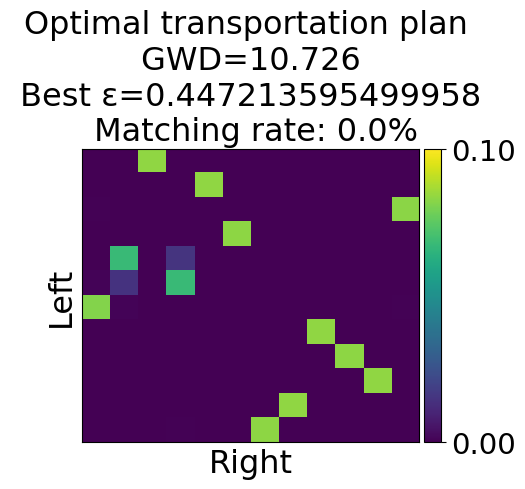

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 8.844


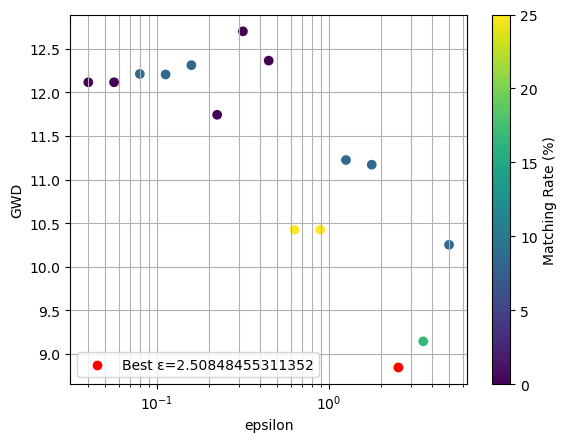

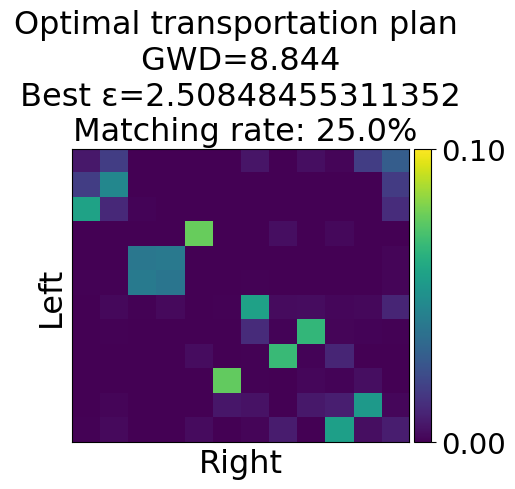

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 3.994


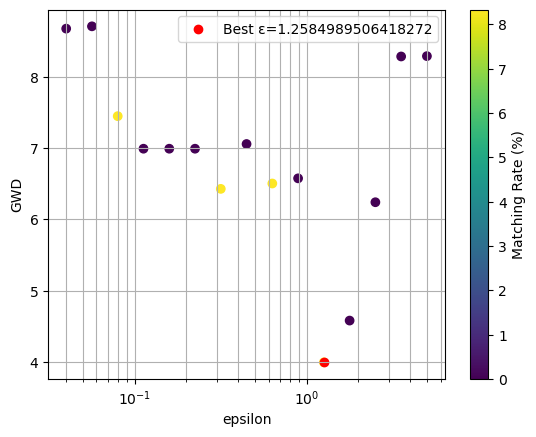

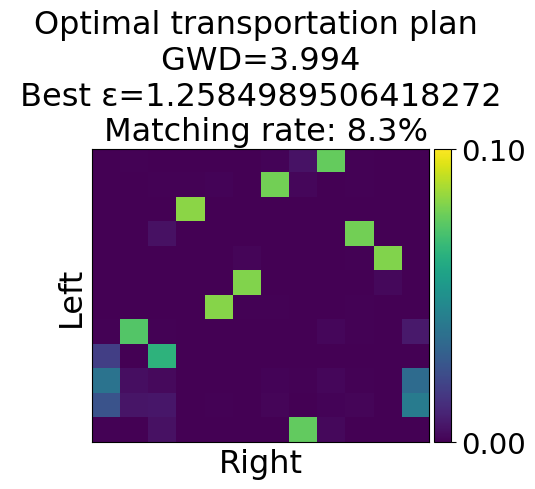

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 5.686


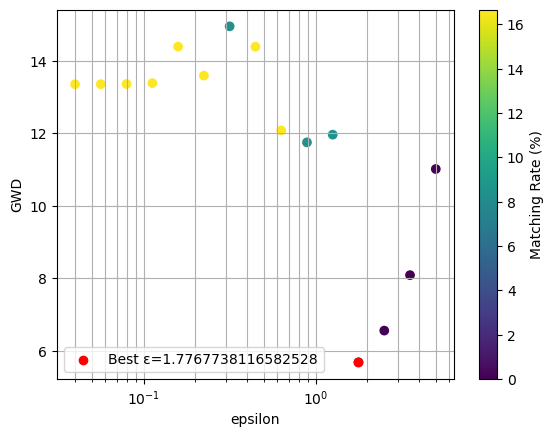

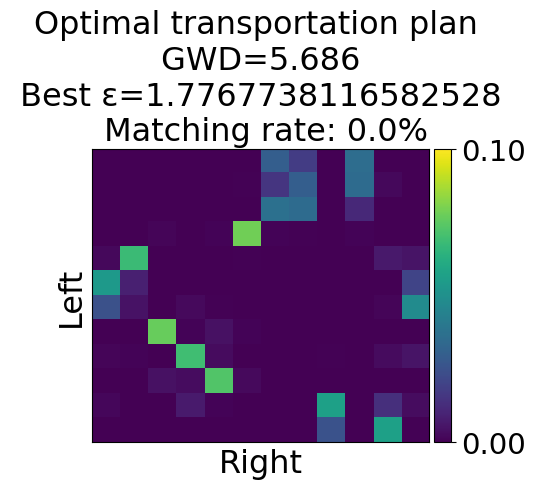

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07972941262554757, Minimum GWD: 5.396


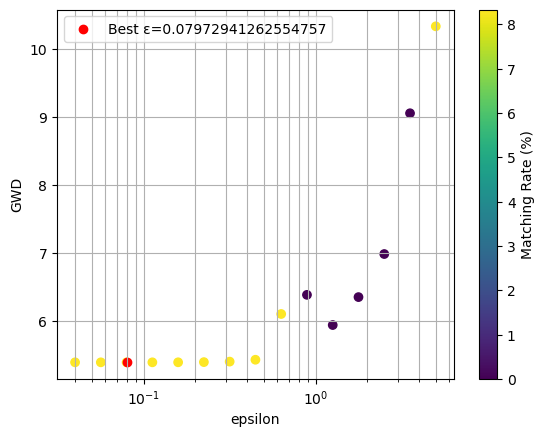

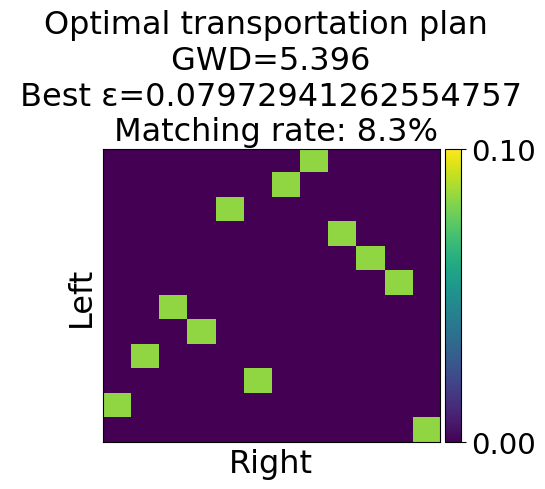

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 6.729


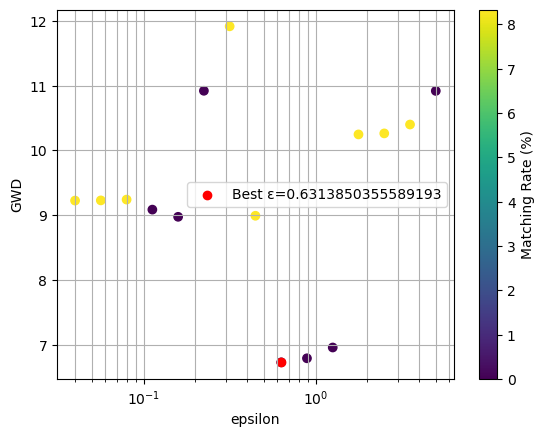

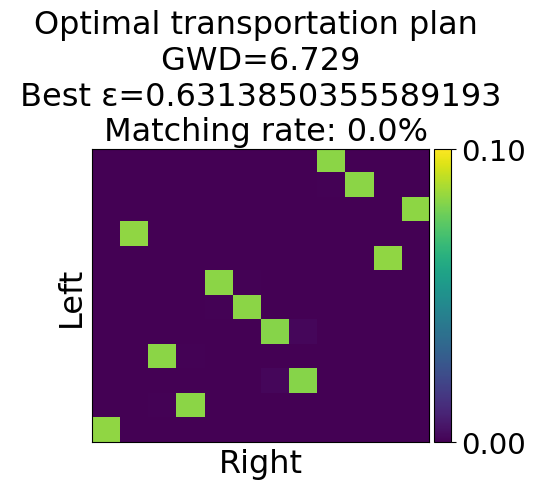

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 4.528


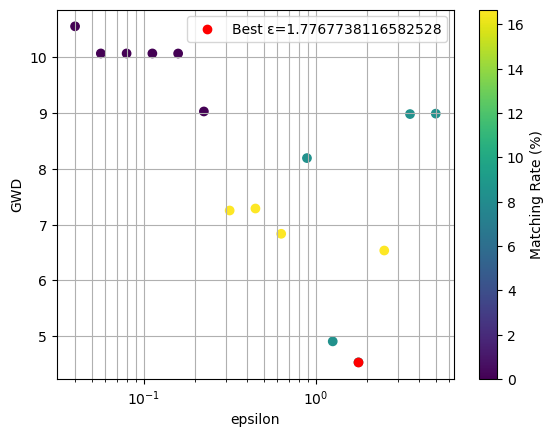

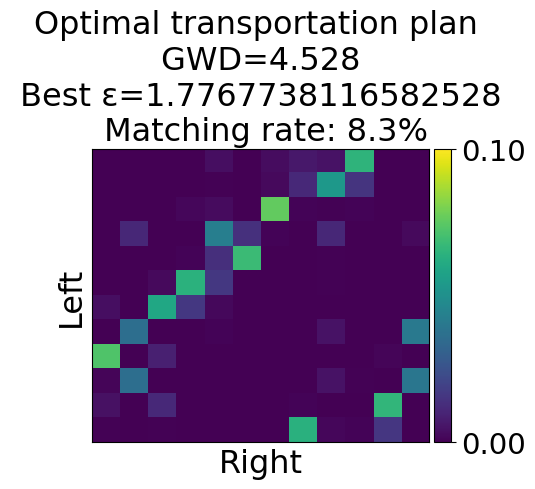

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 3.5415283092991934, Minimum GWD: 8.446


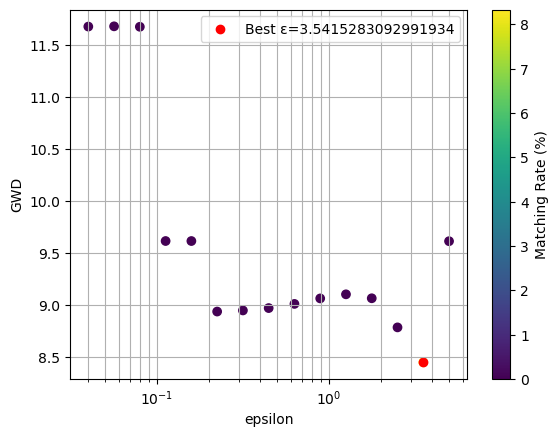

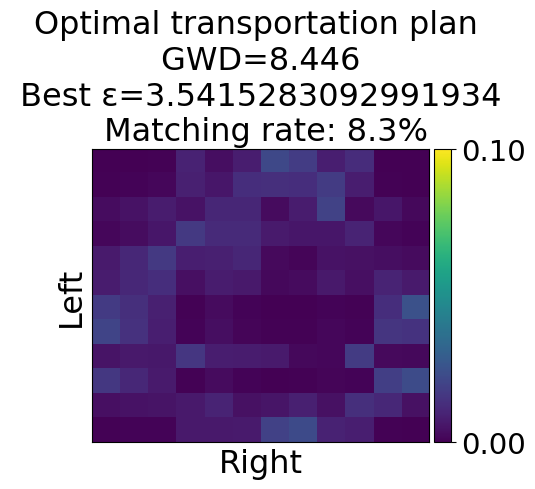

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 9.078


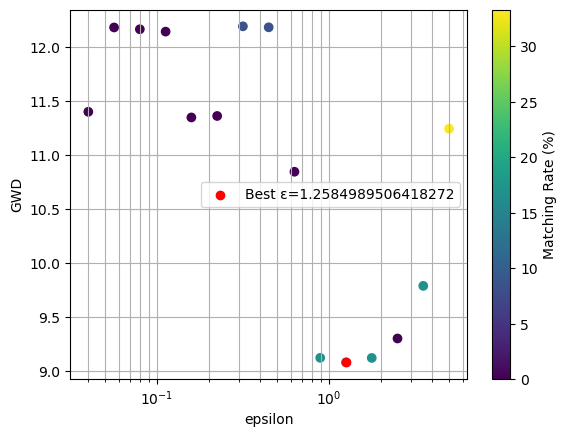

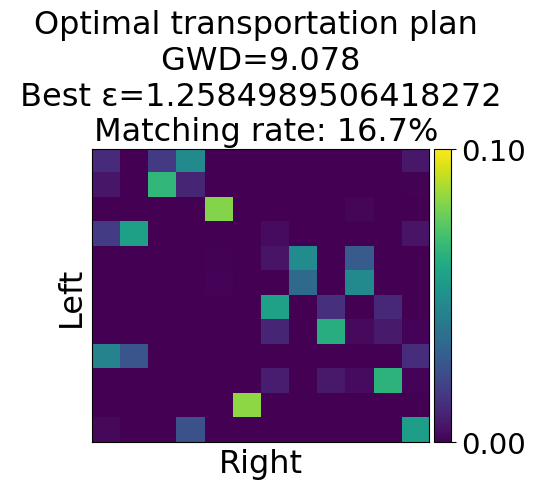

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 10.620


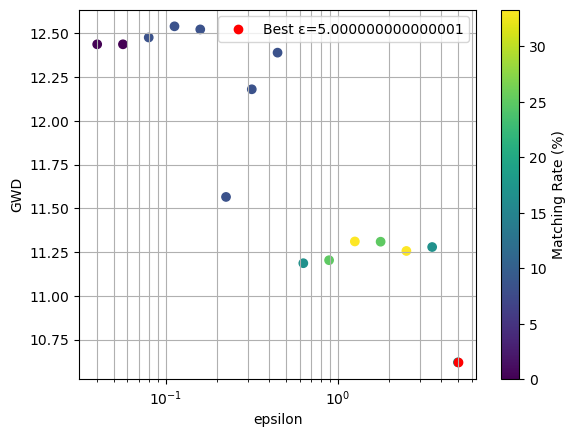

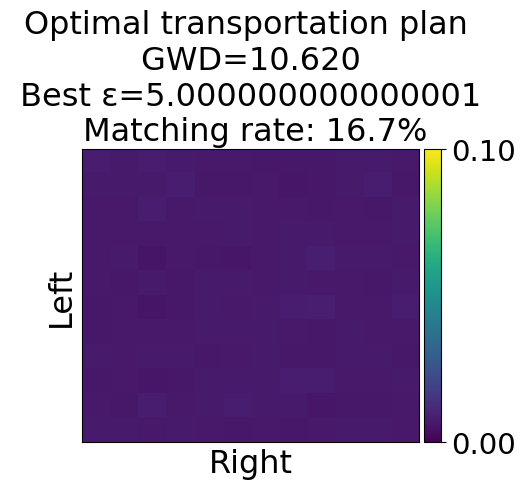

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 7.670


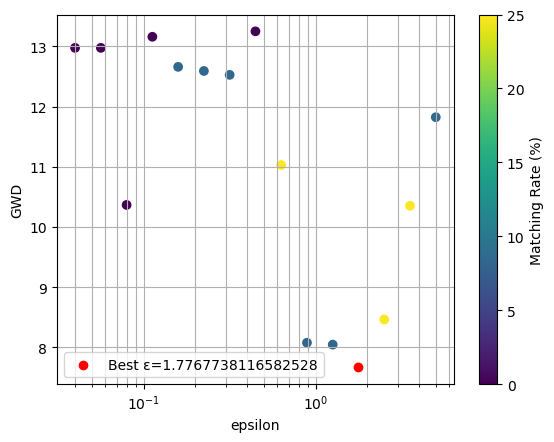

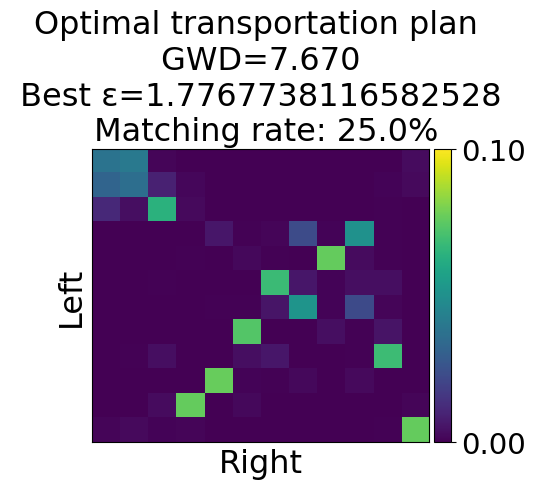

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 8.950


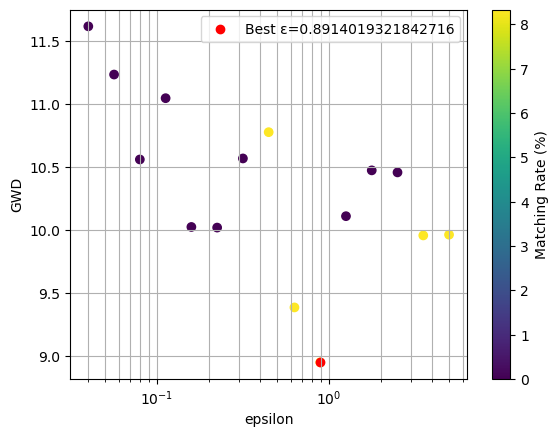

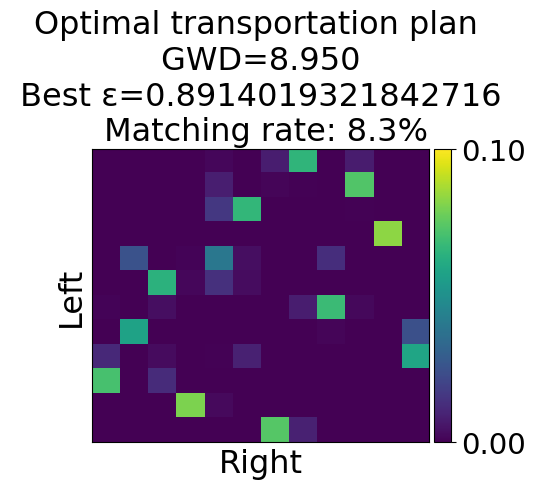

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.1125635681298911, Minimum GWD: 5.915


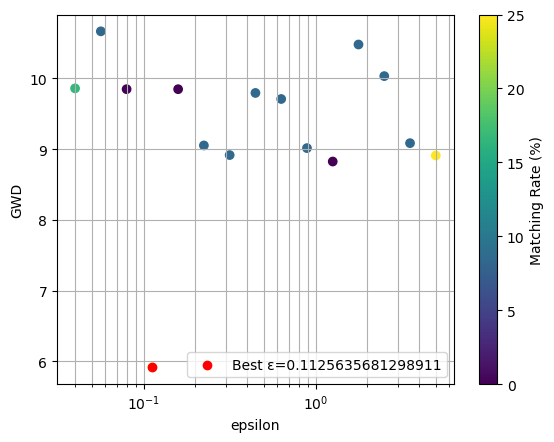

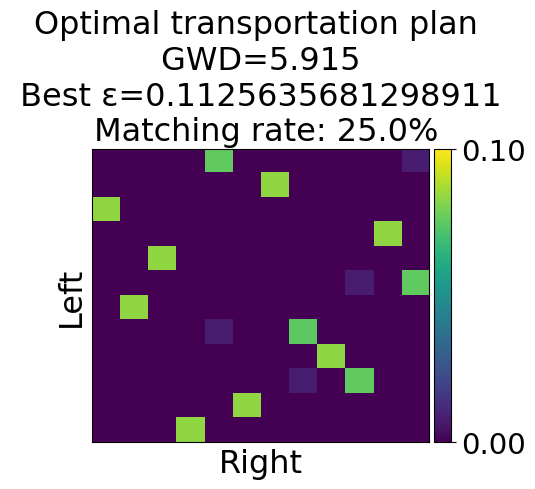

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.654


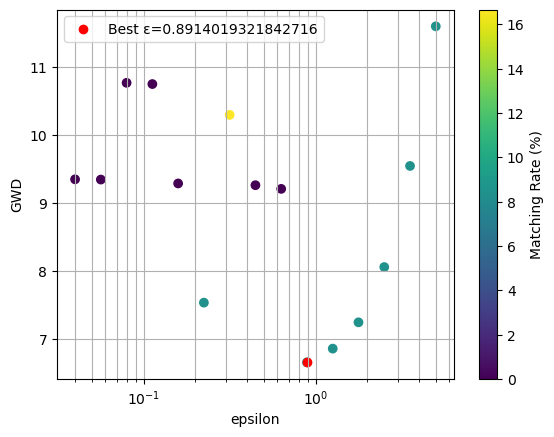

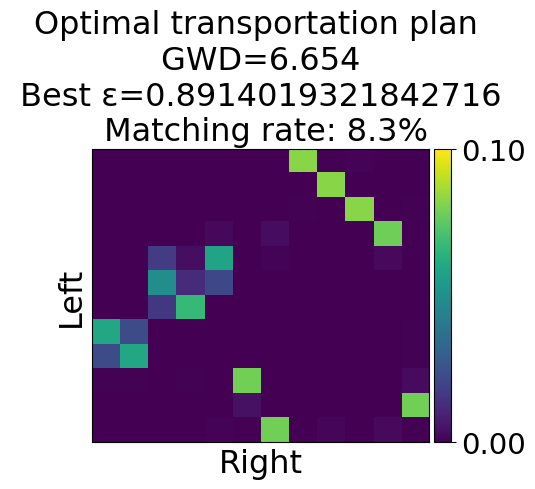

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 4.715


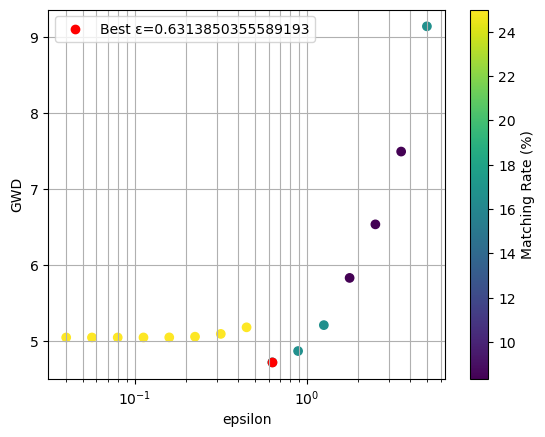

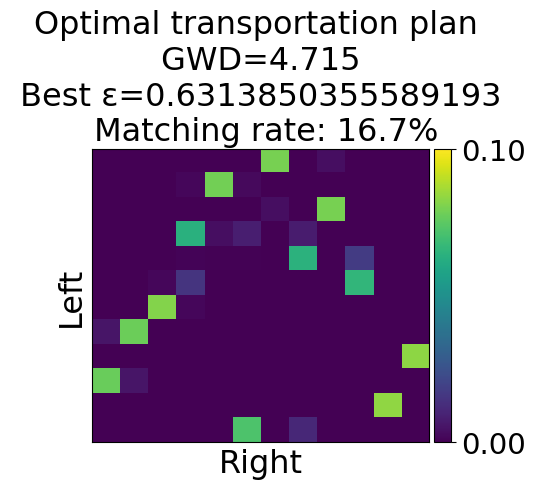

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 6.470


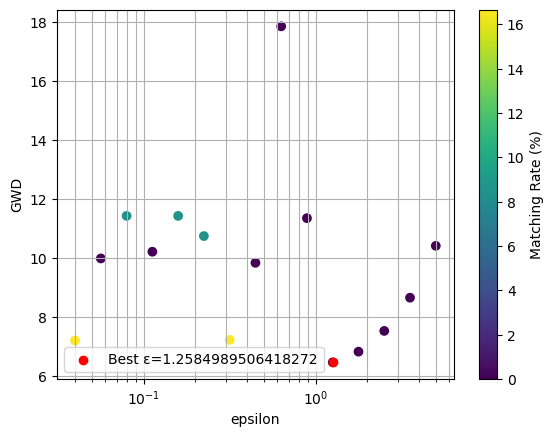

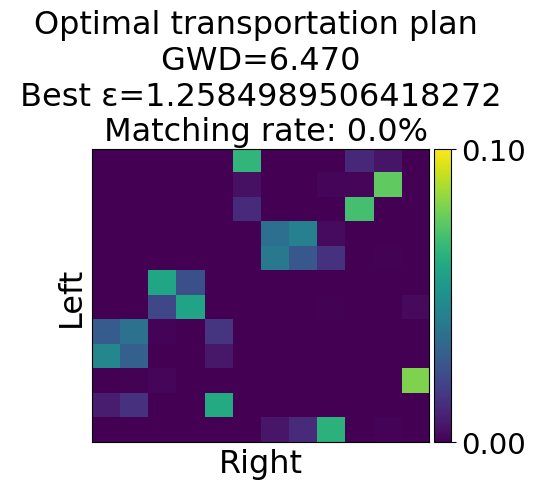

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 8.643


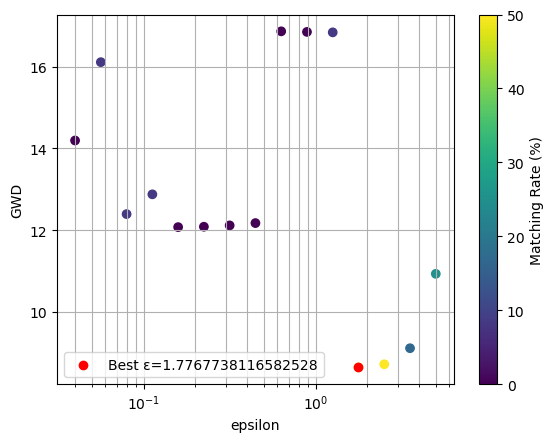

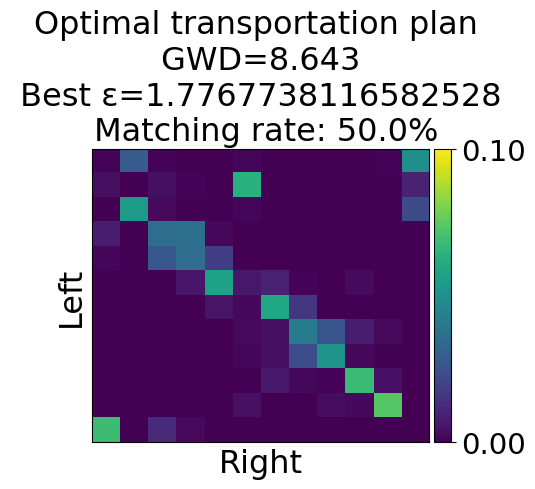

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 8.586


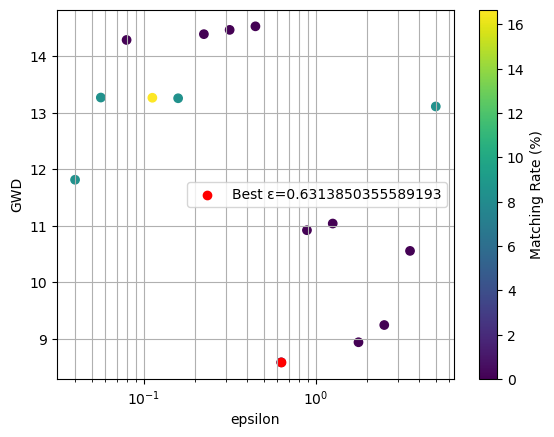

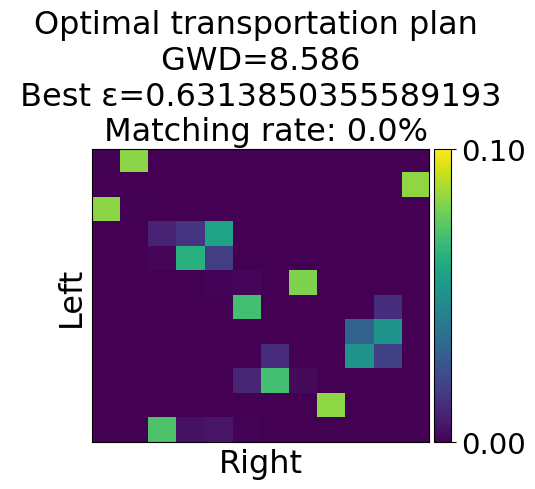

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 4.371


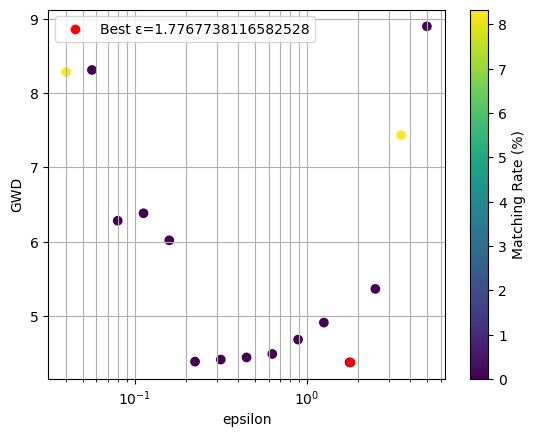

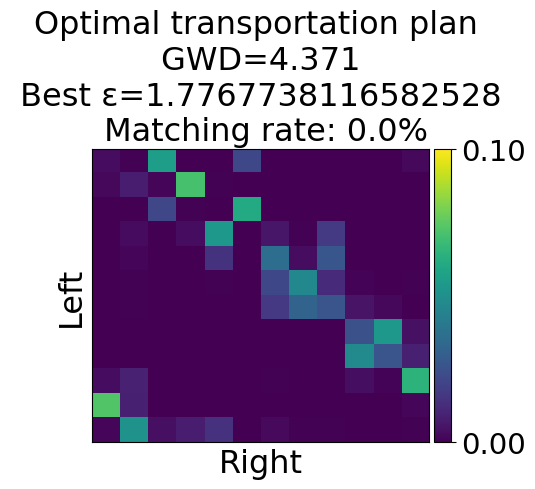

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 5.336


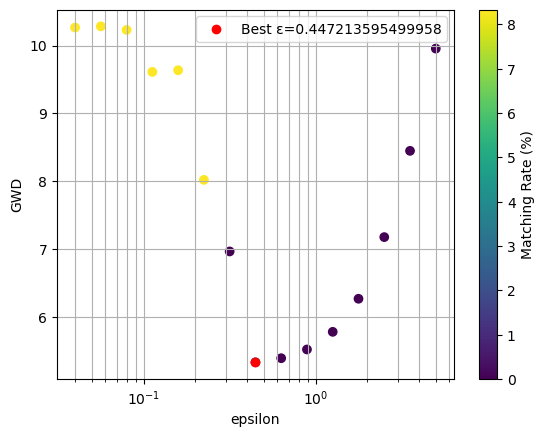

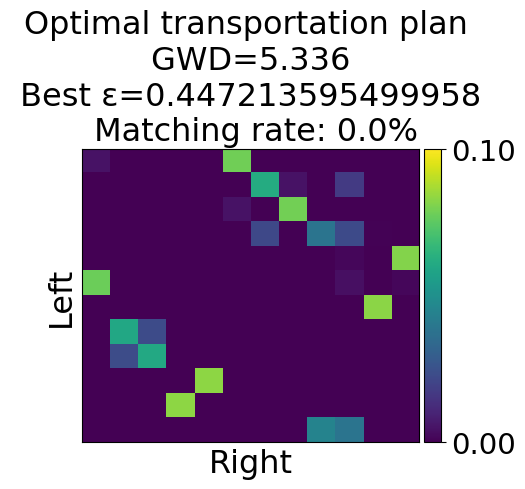

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 7.078


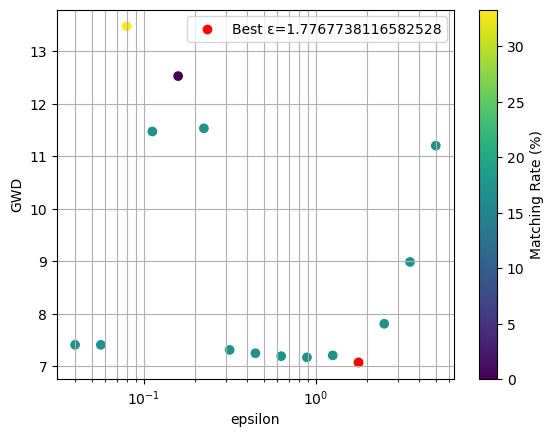

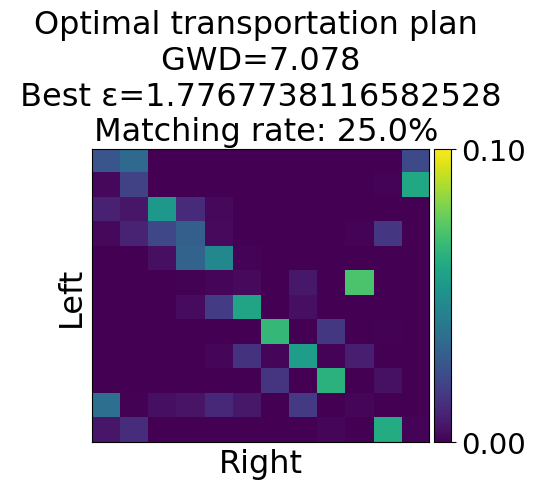

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 10.571


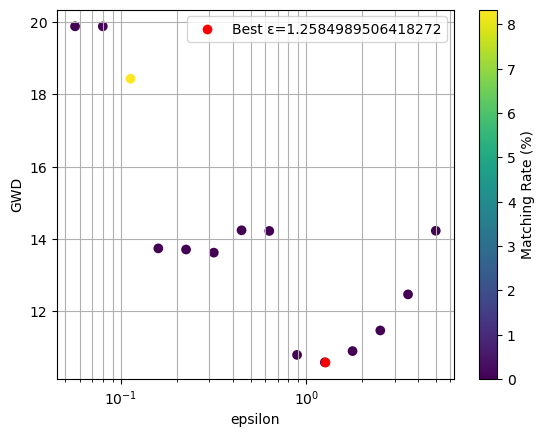

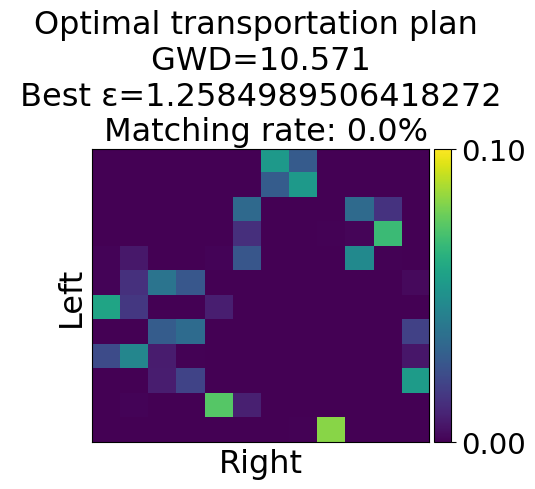

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 7.664


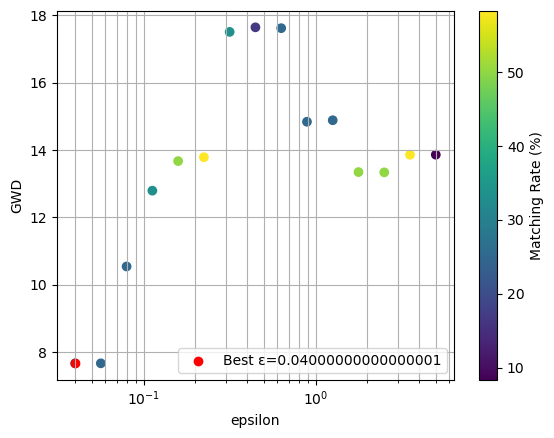

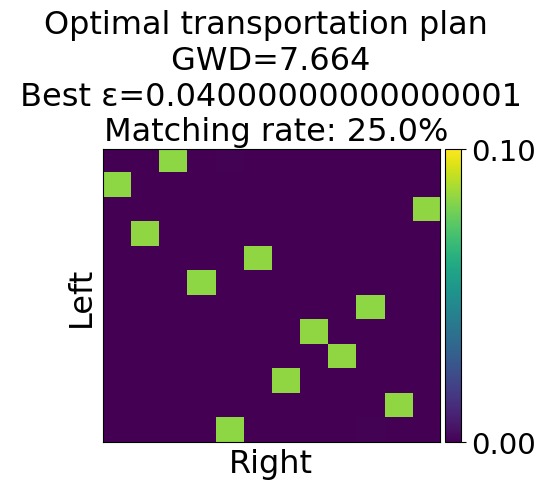

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 6.260


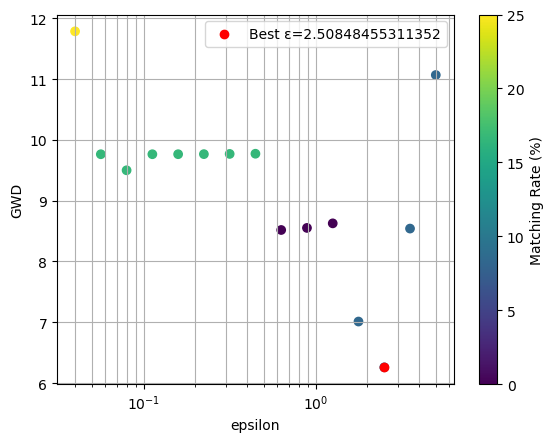

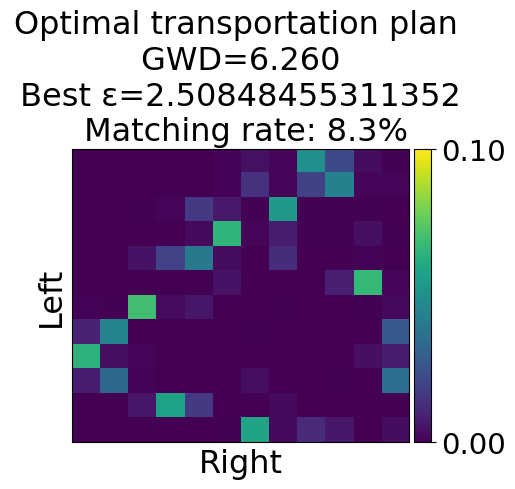

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 7.095


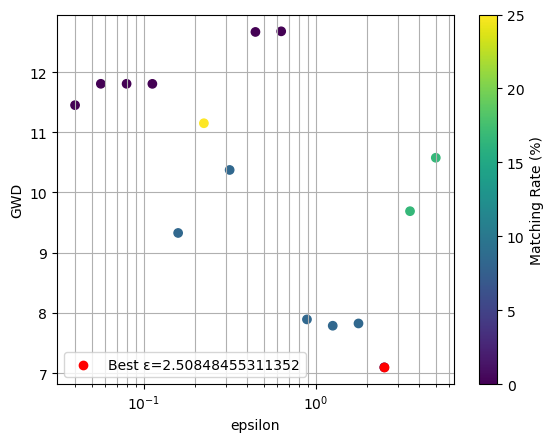

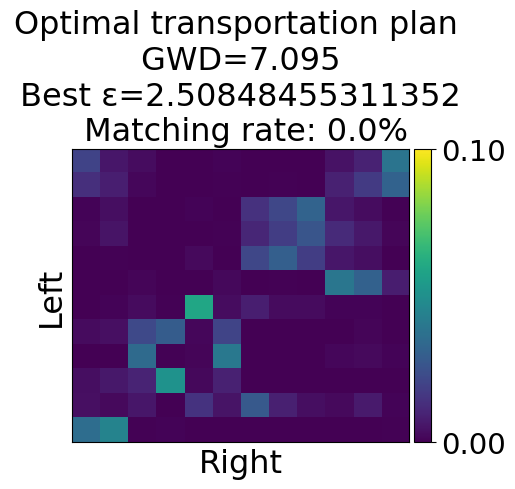

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.15891948094037048, Minimum GWD: 7.105


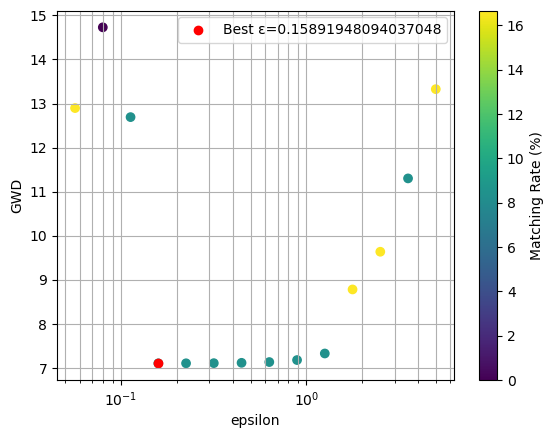

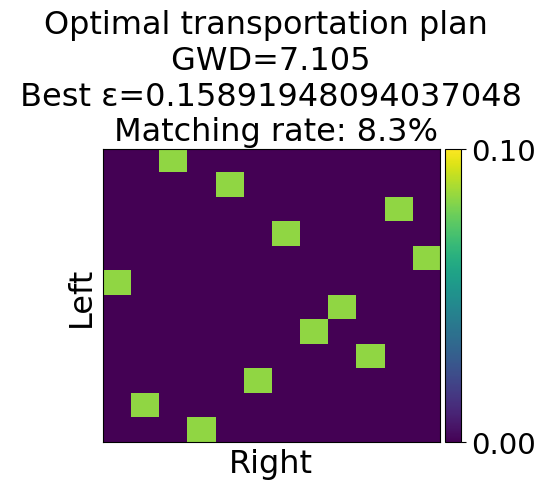

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 12.215


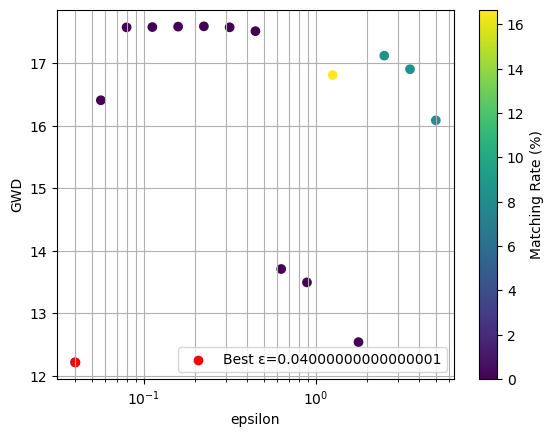

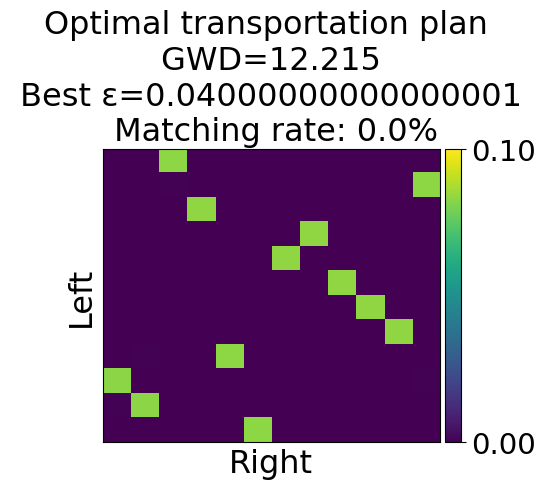

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 6.917


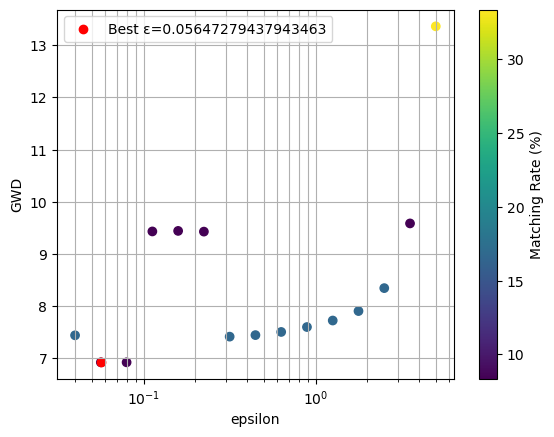

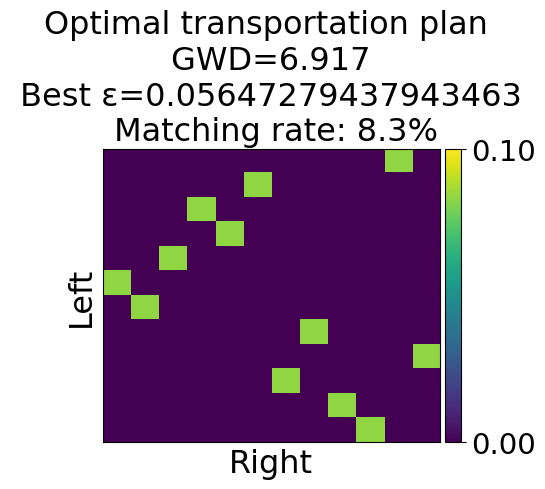

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 8.745


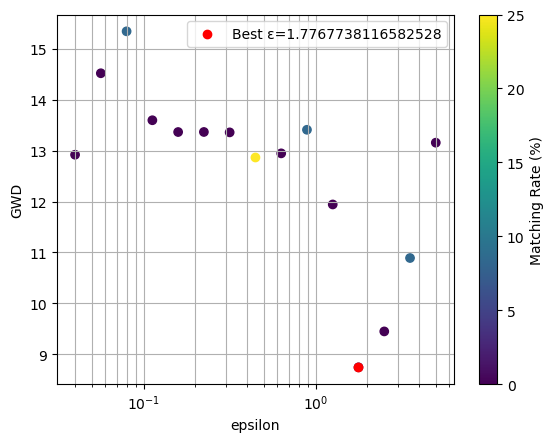

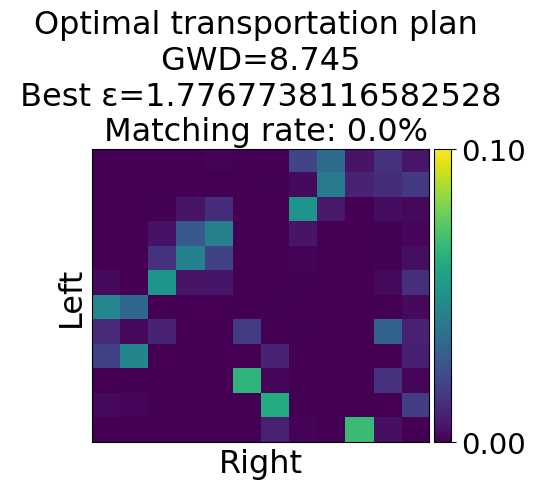

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07972941262554757, Minimum GWD: 8.007


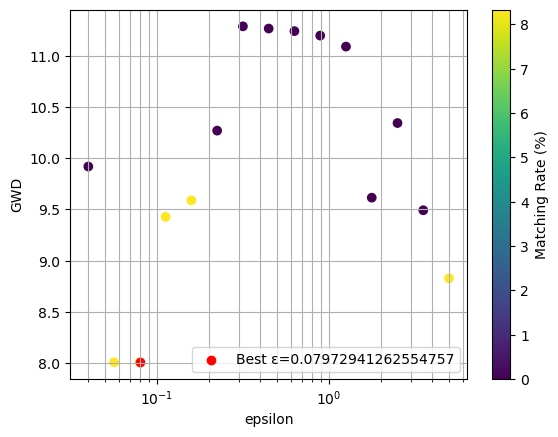

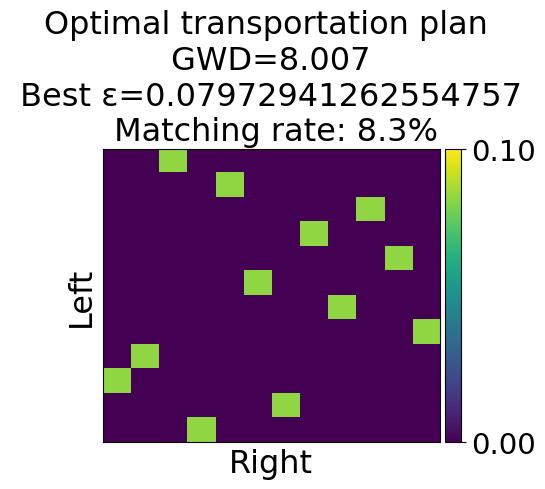

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 10.222


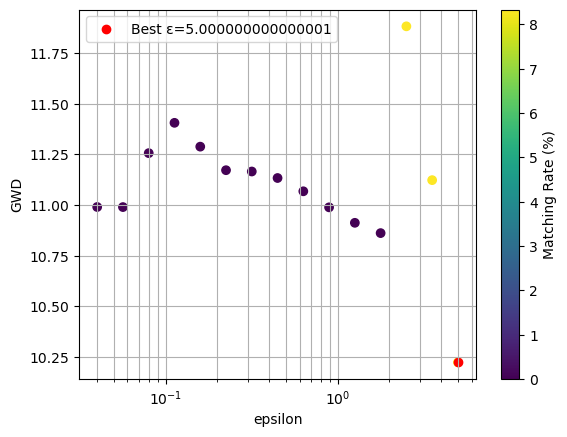

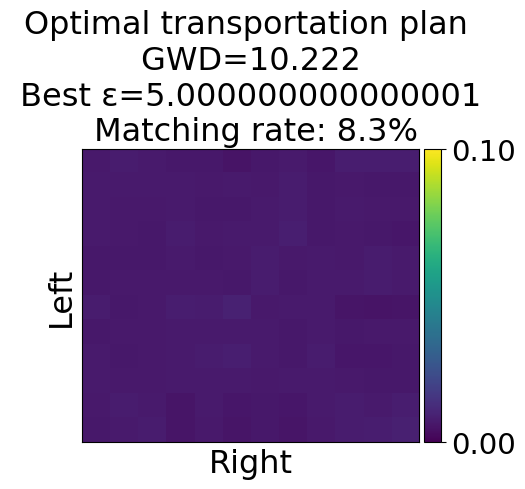

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.22436567925080053, Minimum GWD: 9.630


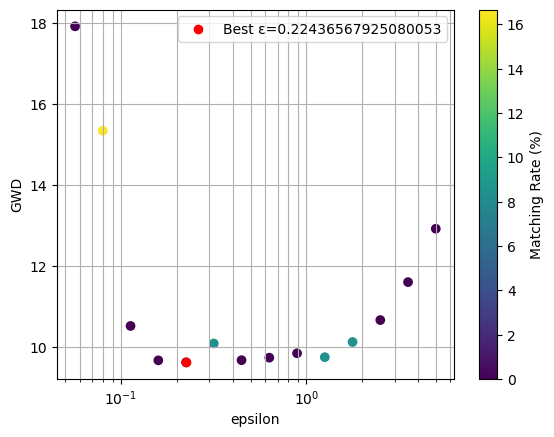

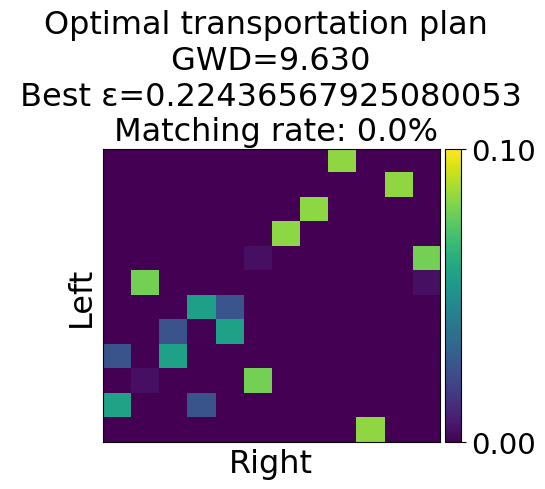

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 12.631


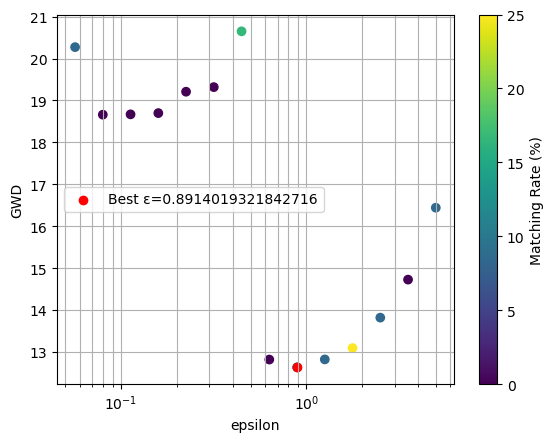

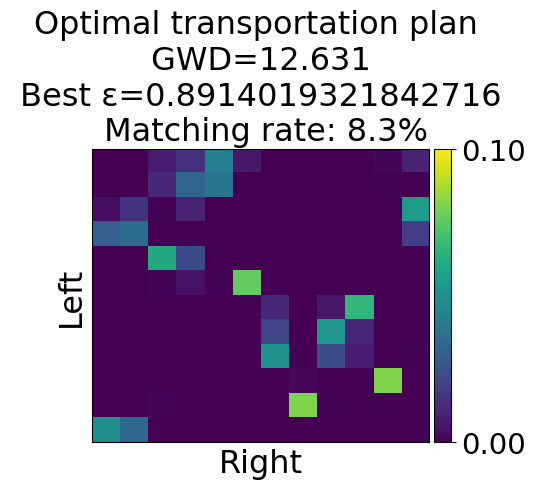

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 7.039


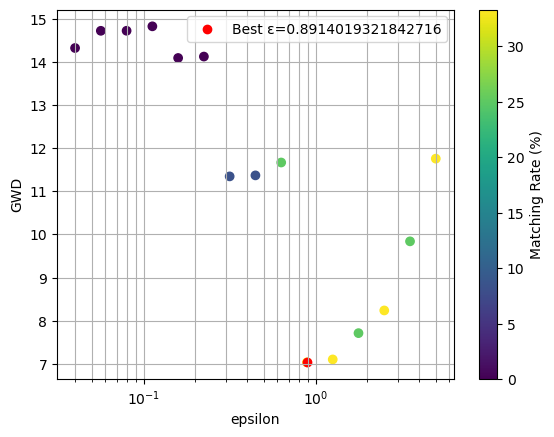

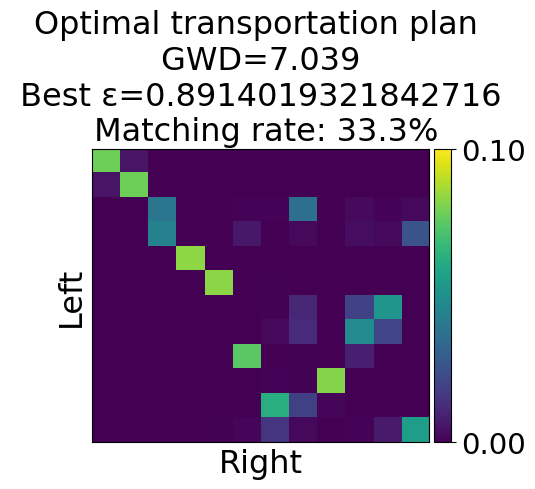

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.945


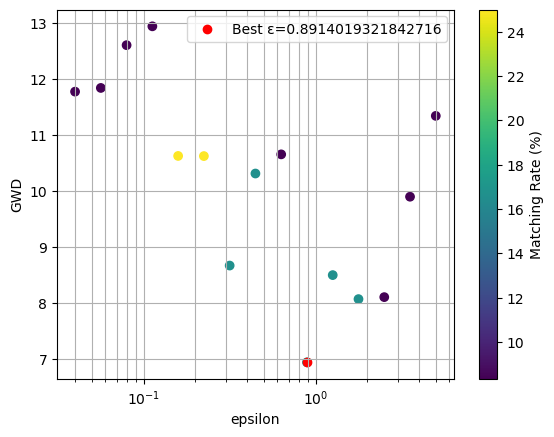

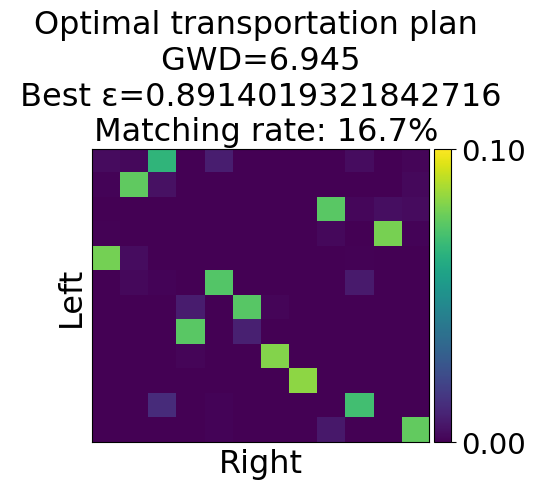

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 5.543


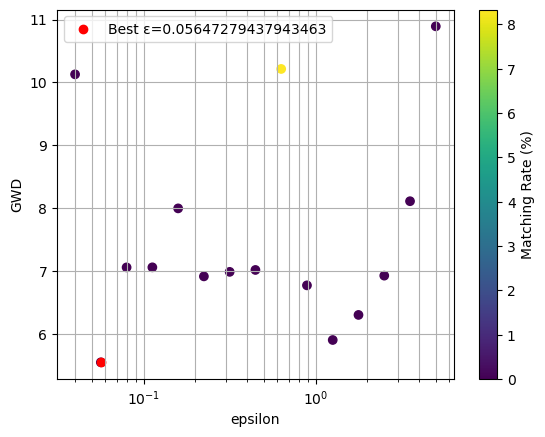

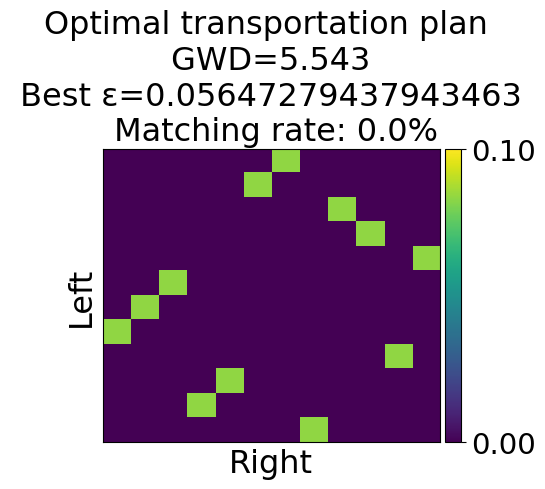

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.367


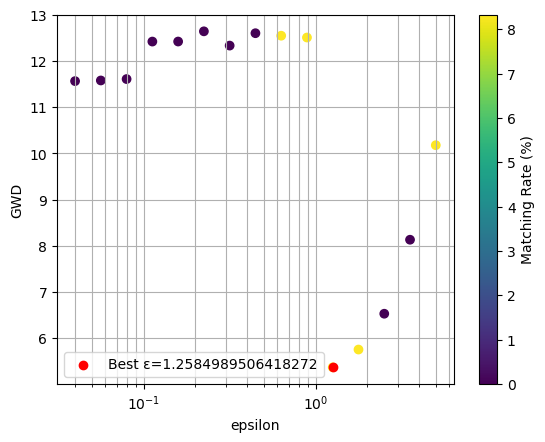

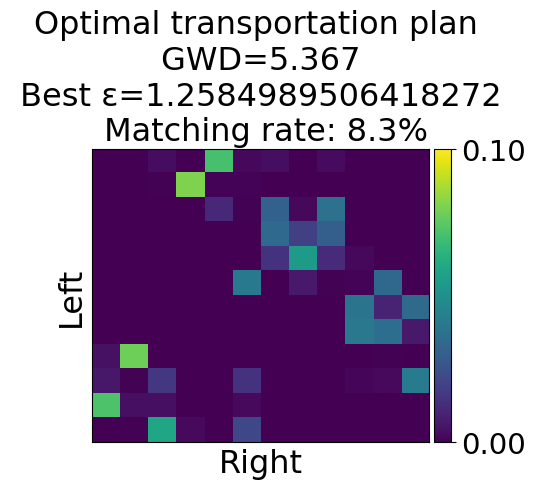

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 6.662


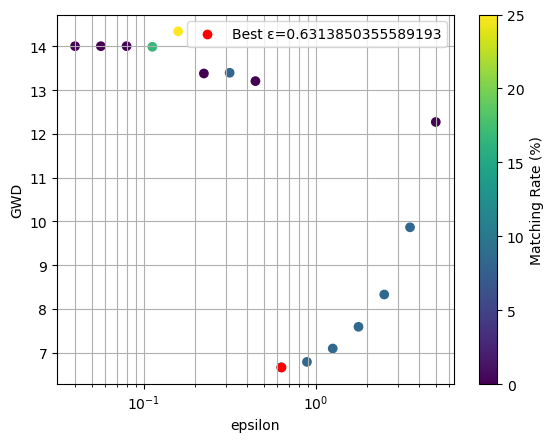

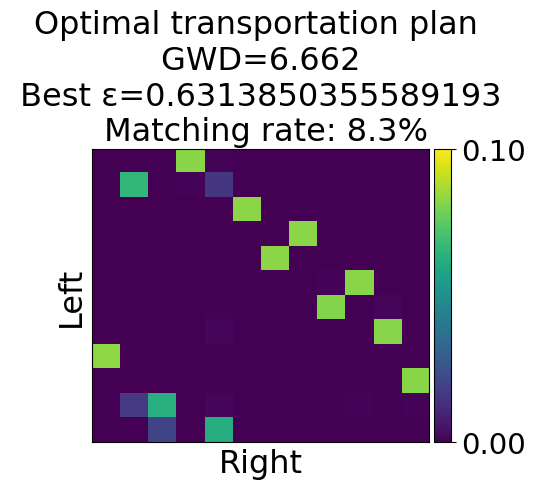

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.625


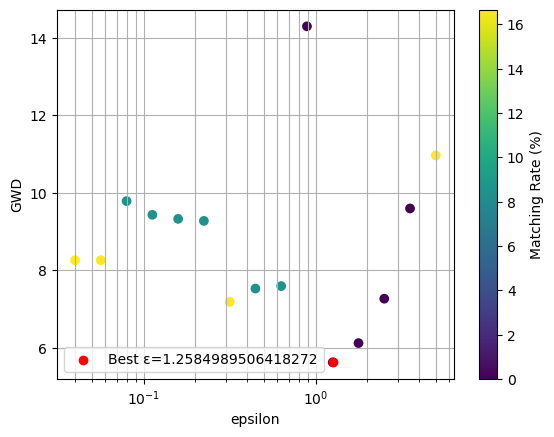

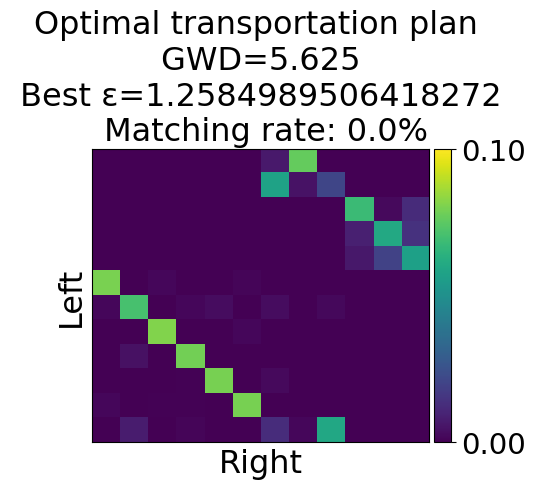

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 10.744


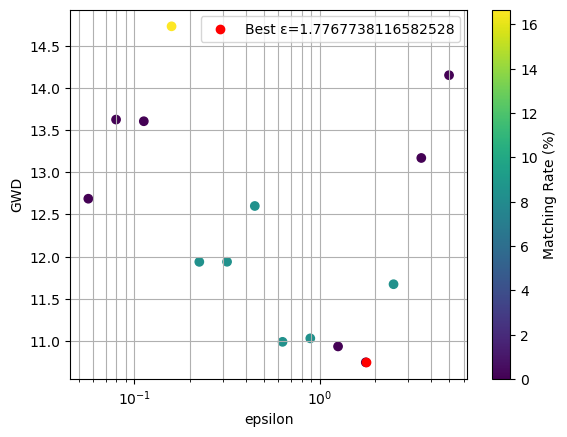

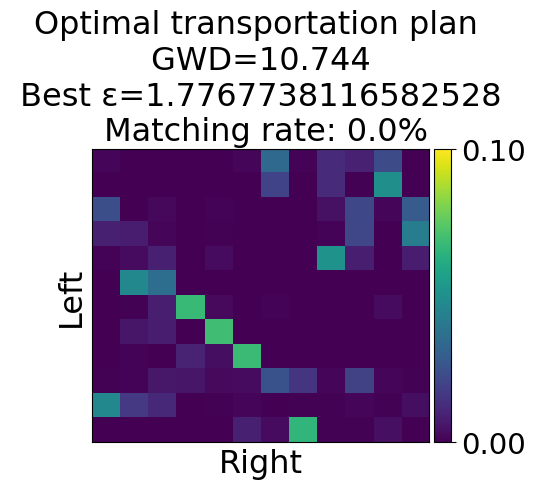

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 4.958


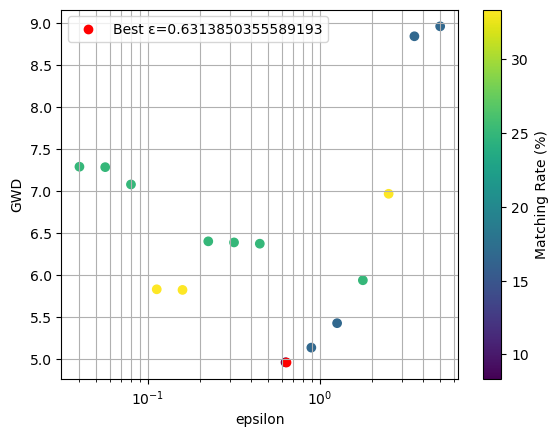

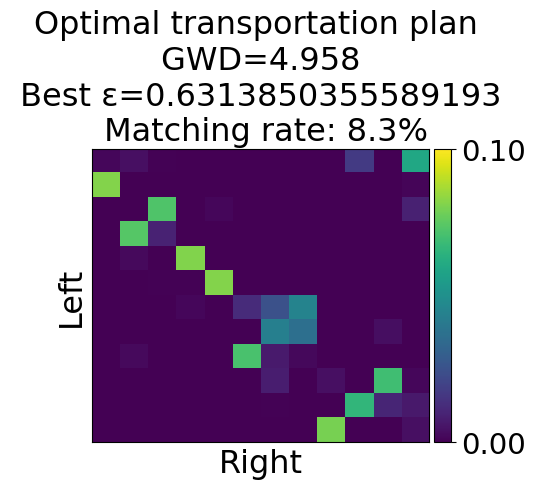

In [35]:
# --- 1. Compute GWOT within each cluster ---
within_cluster_distances = []

# Cluster 1 within-pairs
for matrix_1, matrix_2 in itertools.combinations(cluster_1_matrices_similarity_distance_reordered, 2):
    _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
    within_cluster_distances.append(min_gwd)

# Cluster 2 within-pairs
for matrix_1, matrix_2 in itertools.combinations(cluster_2_matrices_similarity_distance_reordered, 2):
    _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
    within_cluster_distances.append(min_gwd)

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 7.237


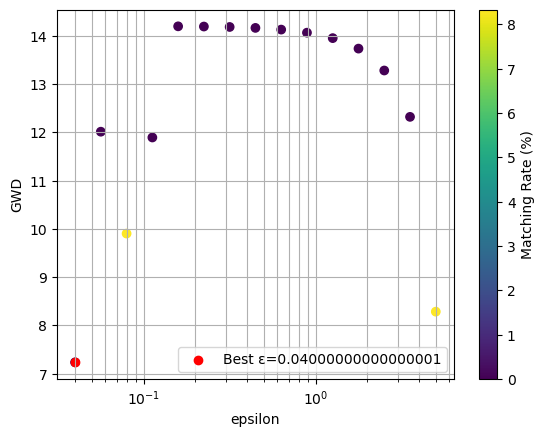

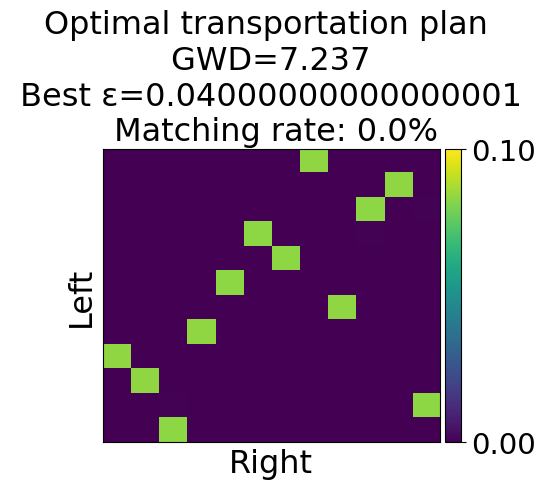

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 10.091


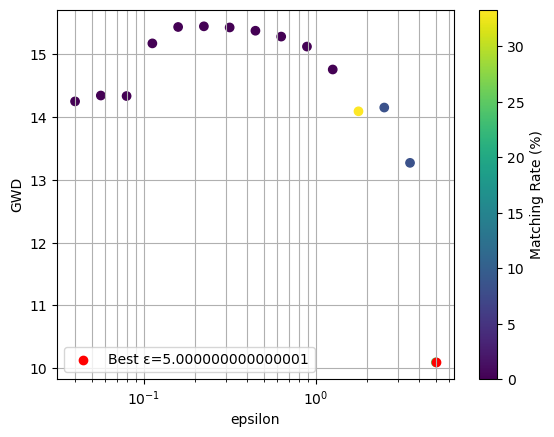

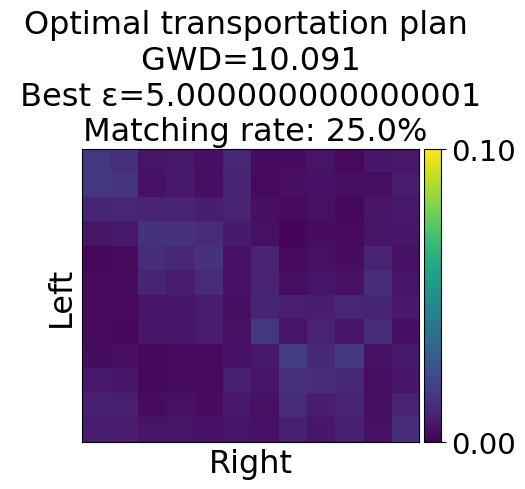

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 5.376


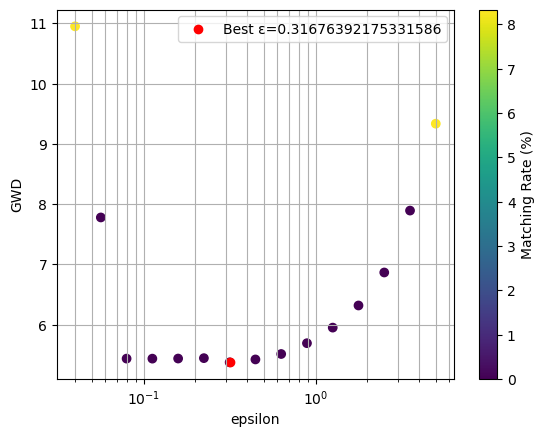

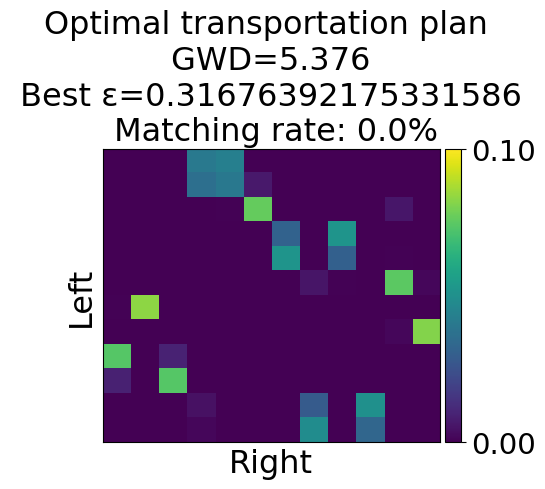

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07972941262554757, Minimum GWD: 6.953


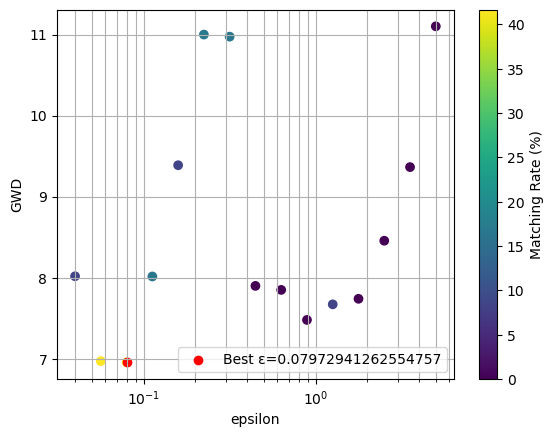

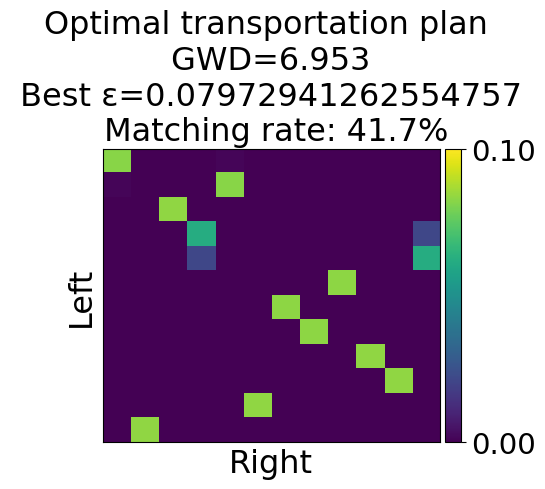

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.136


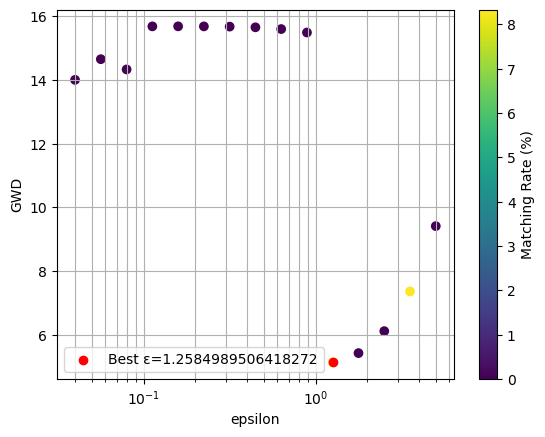

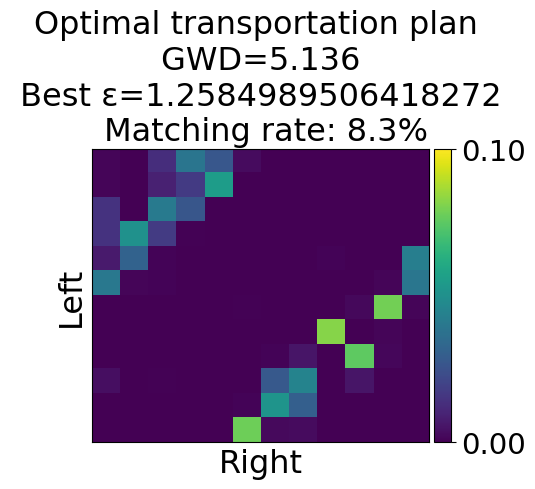

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 6.140


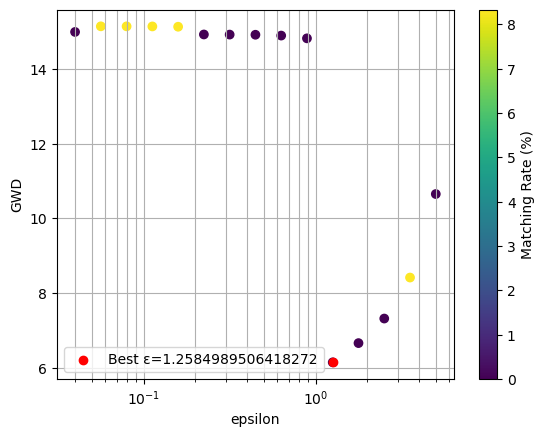

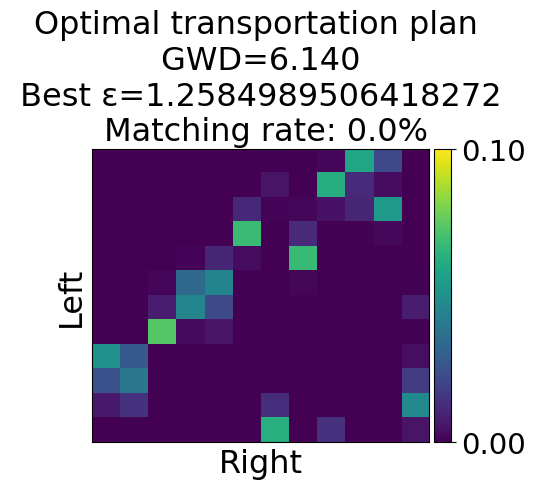

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 2.646


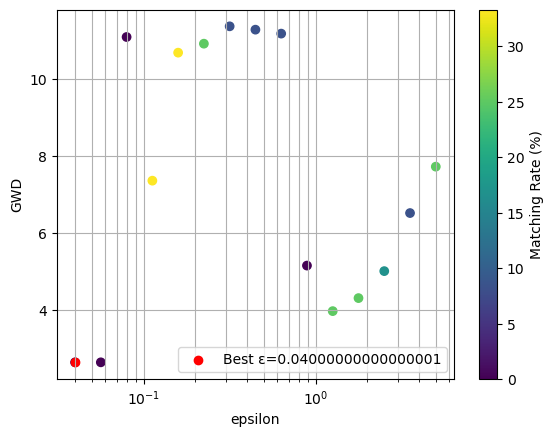

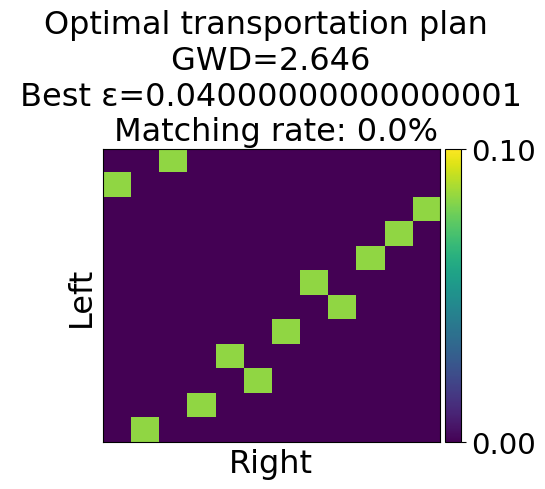

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 5.376


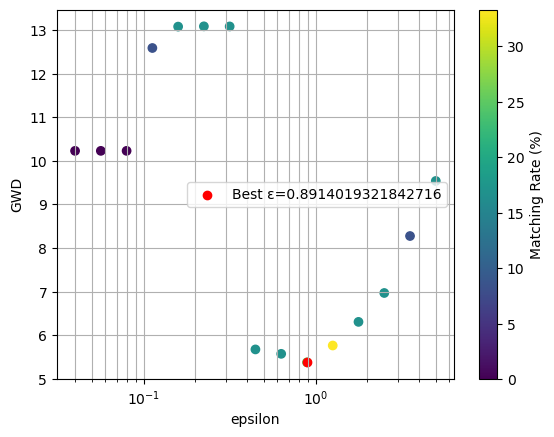

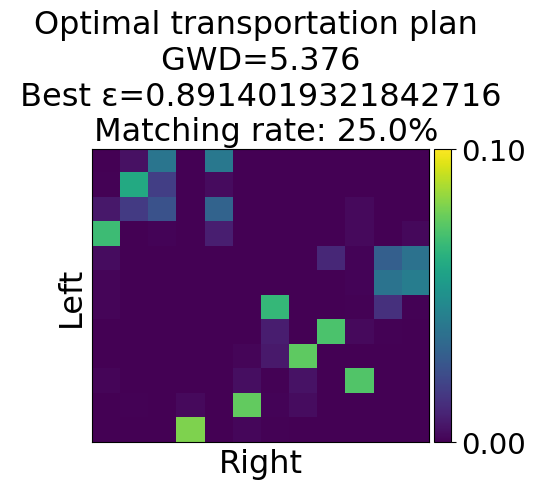

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 9.264


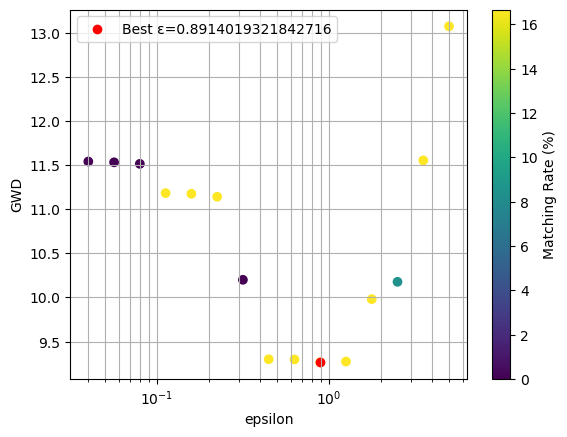

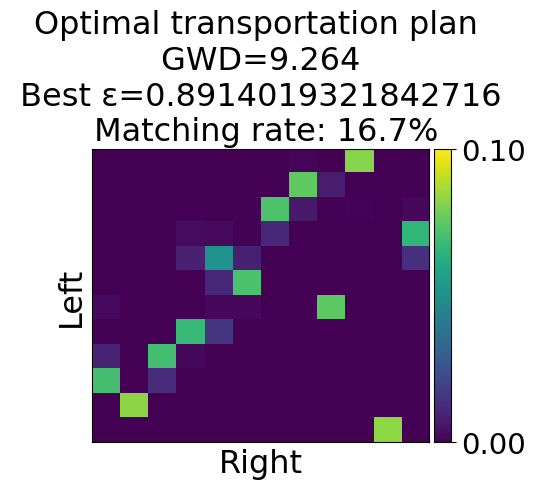

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 5.077


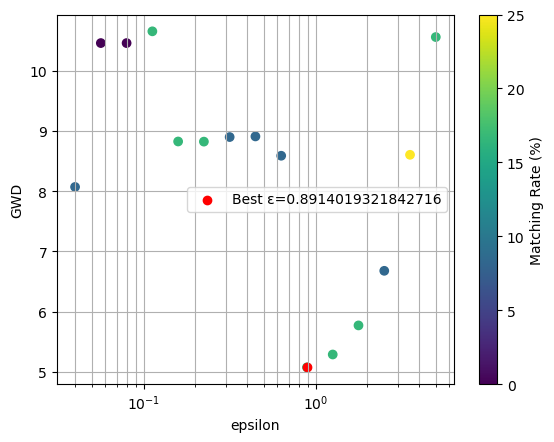

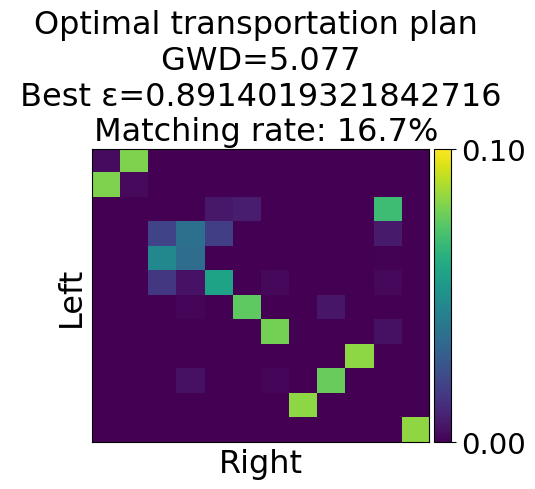

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 9.959


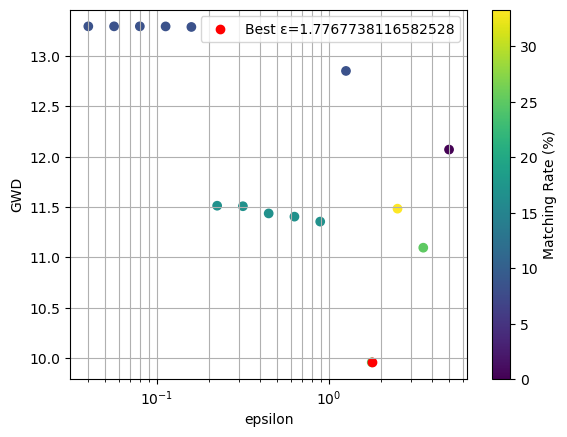

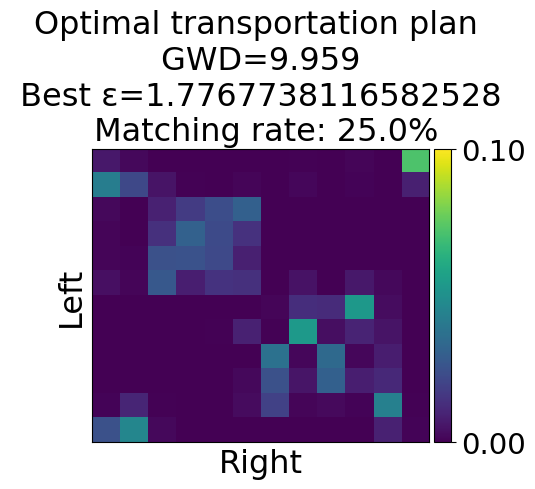

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.447213595499958, Minimum GWD: 16.185


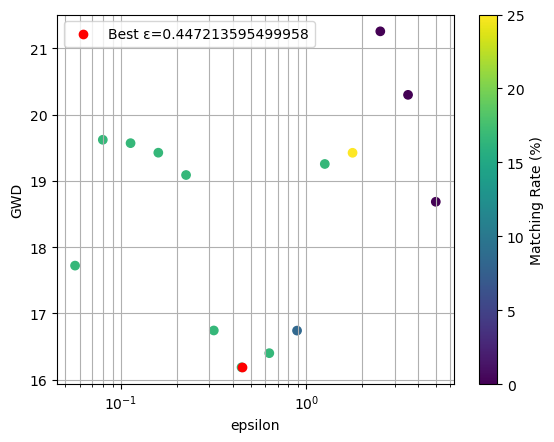

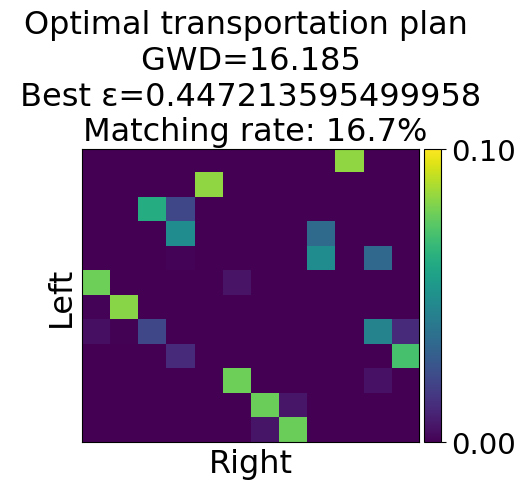

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 11.041


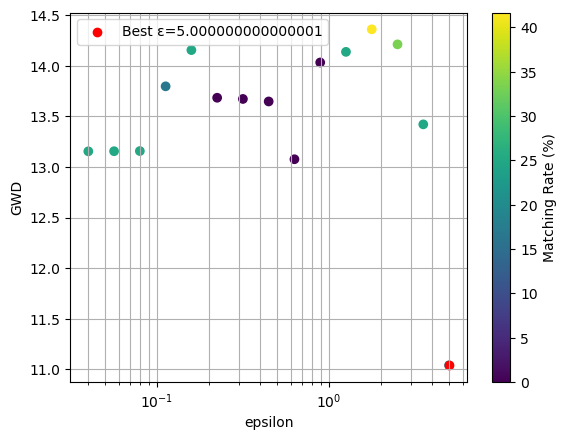

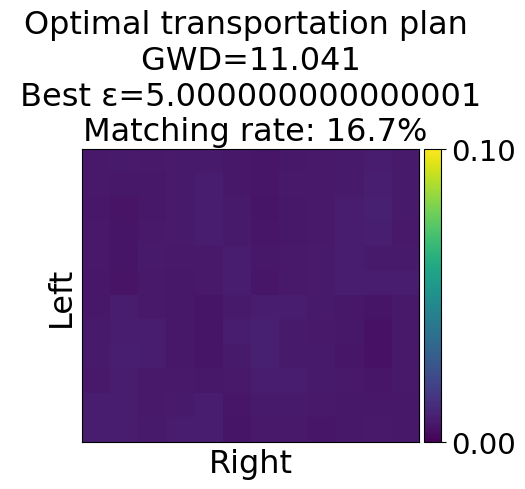

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 4.818


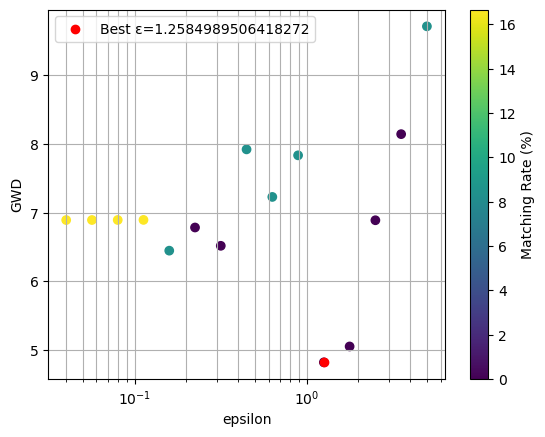

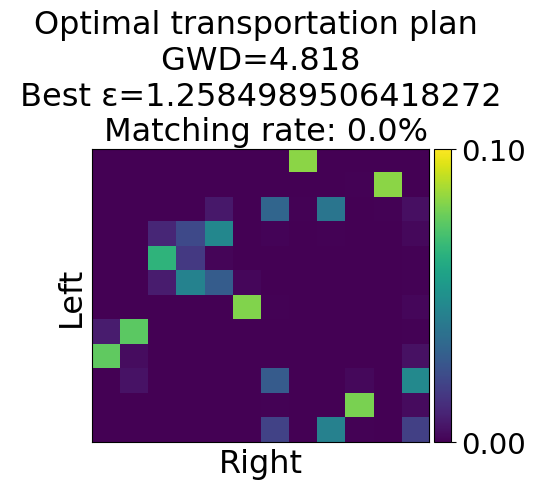

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 6.509


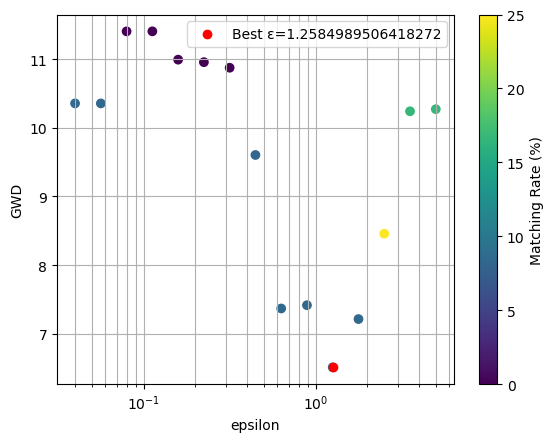

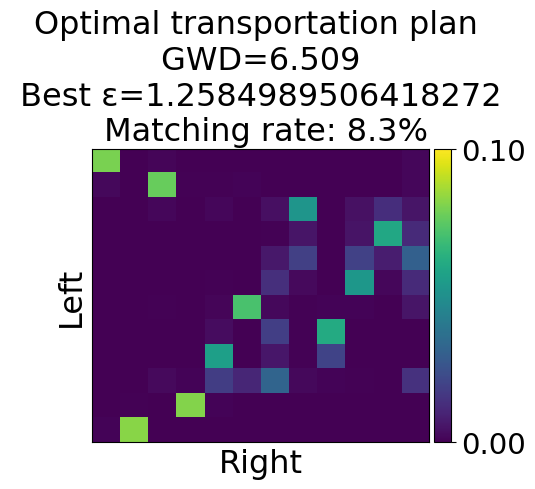

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.7767738116582528, Minimum GWD: 10.897


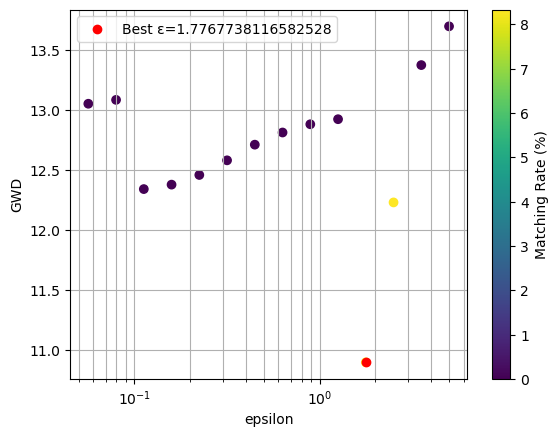

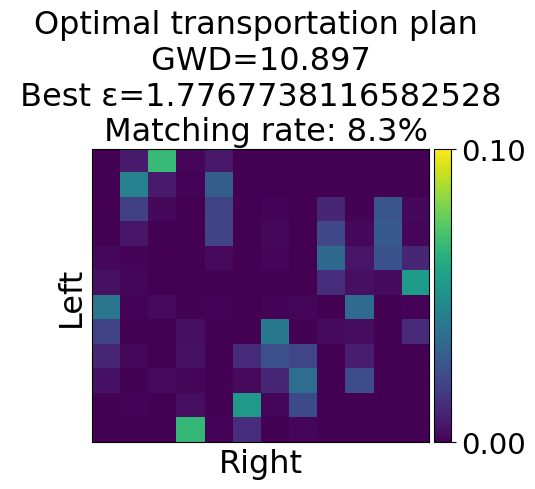

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 6.278


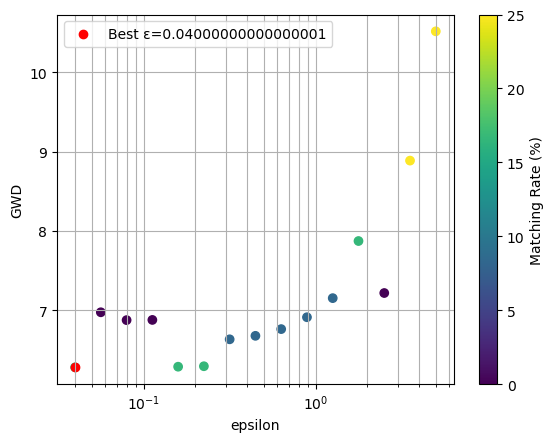

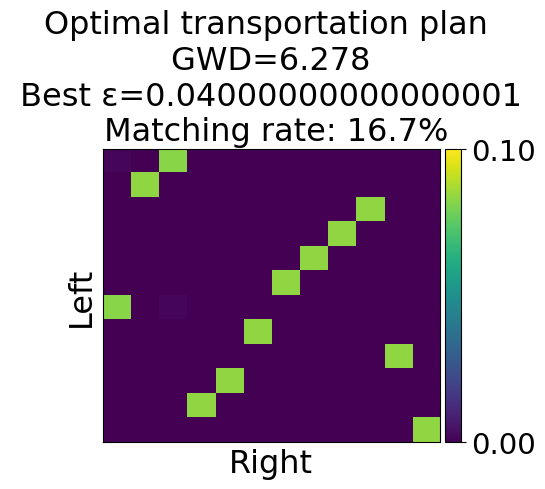

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 9
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 7.139


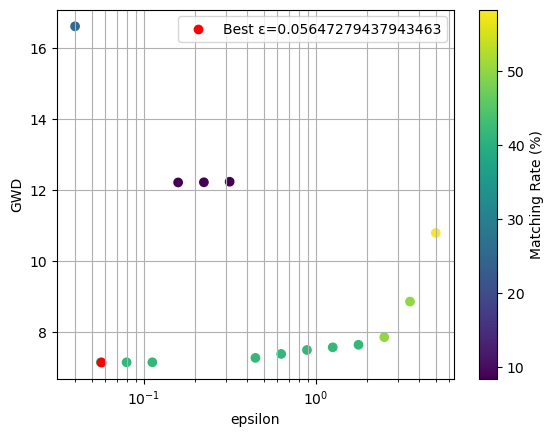

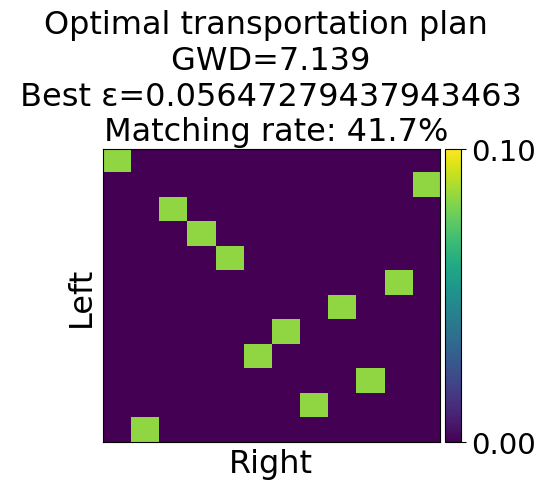

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 5.719


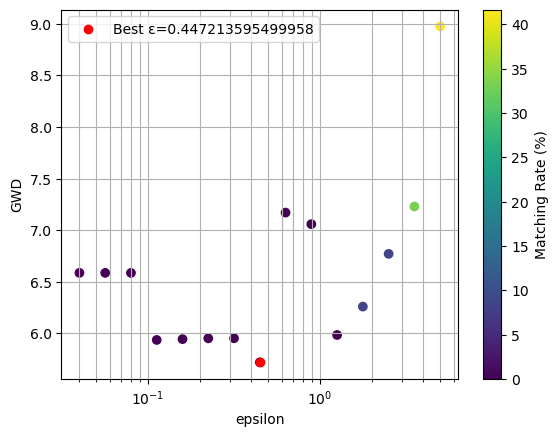

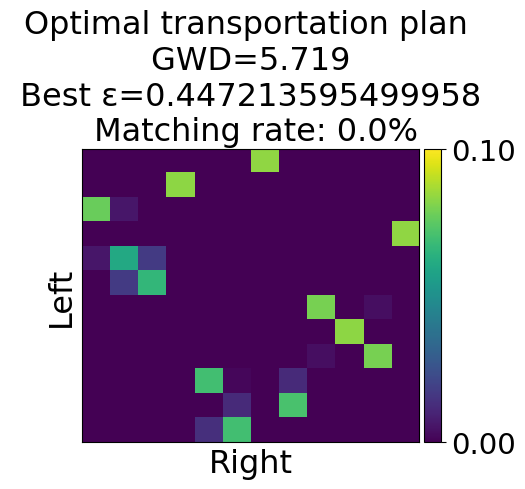

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 10.200


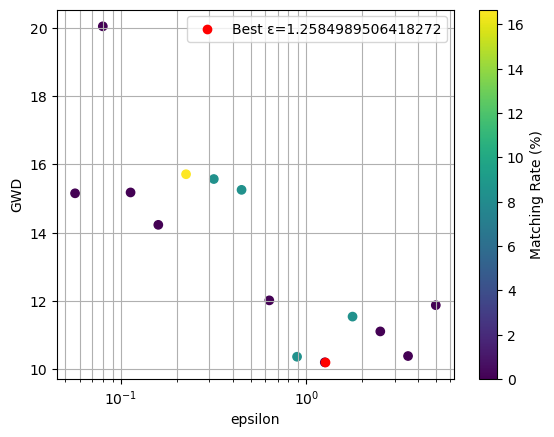

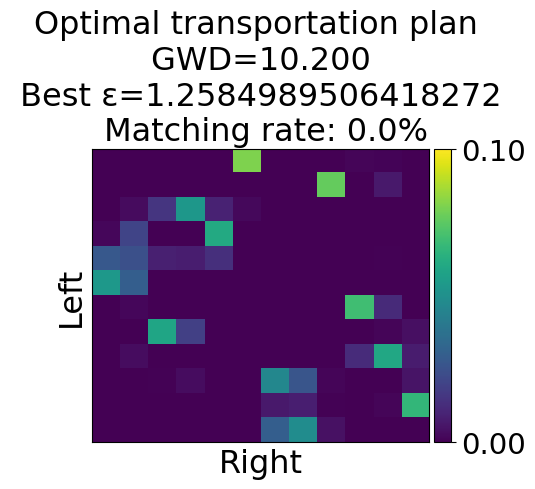

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.748


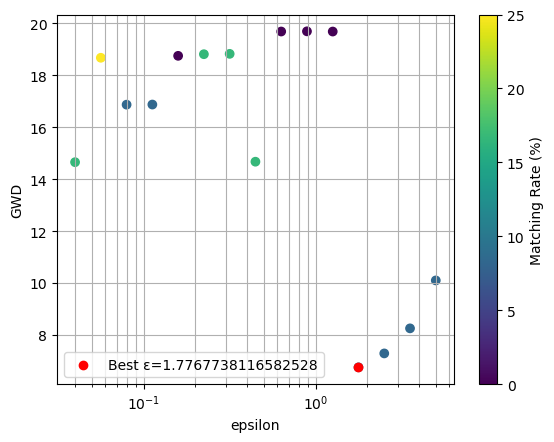

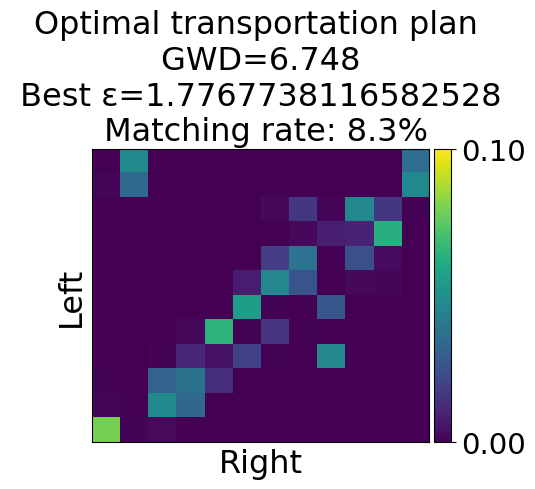

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 7.653


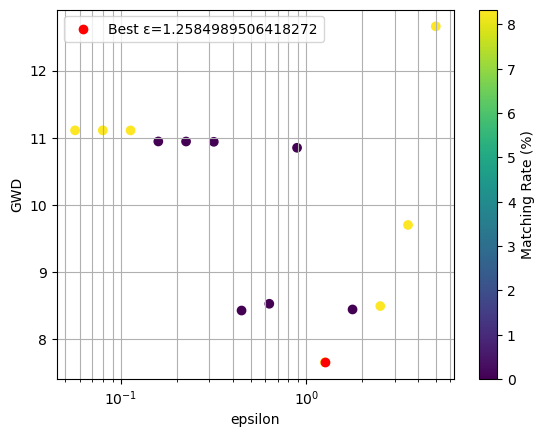

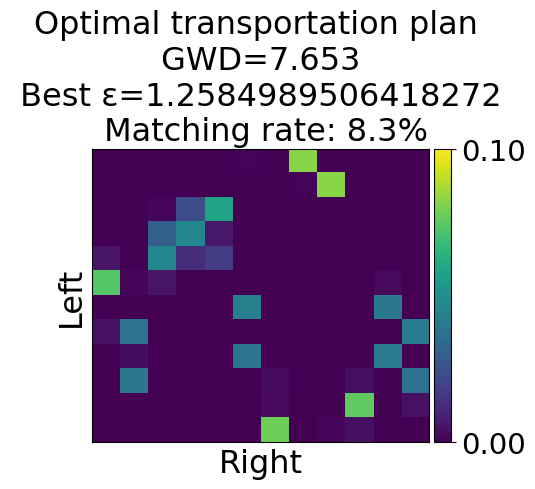

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.15891948094037048, Minimum GWD: 5.607


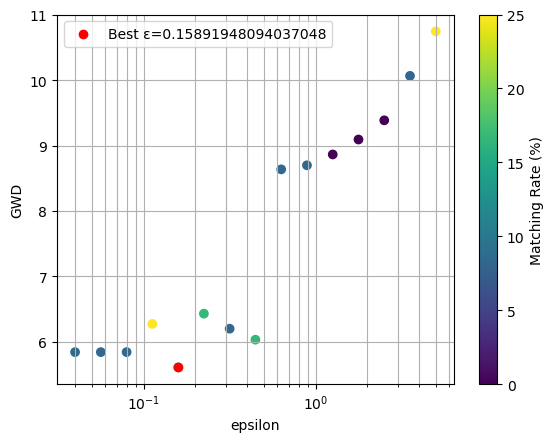

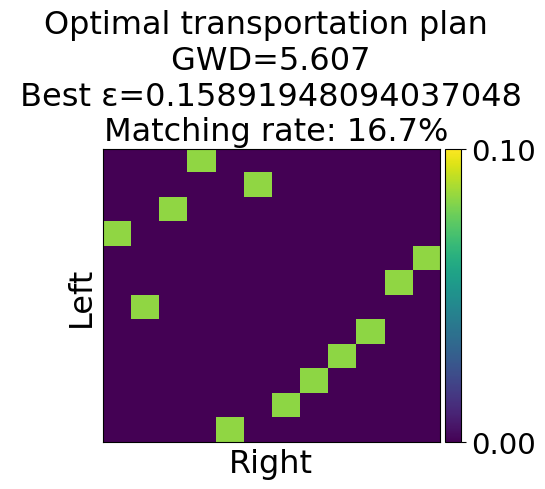

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.739


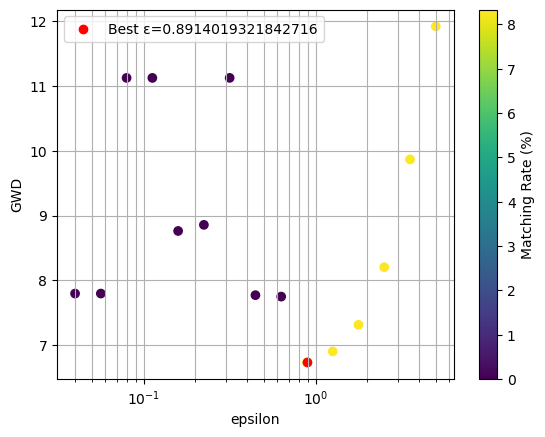

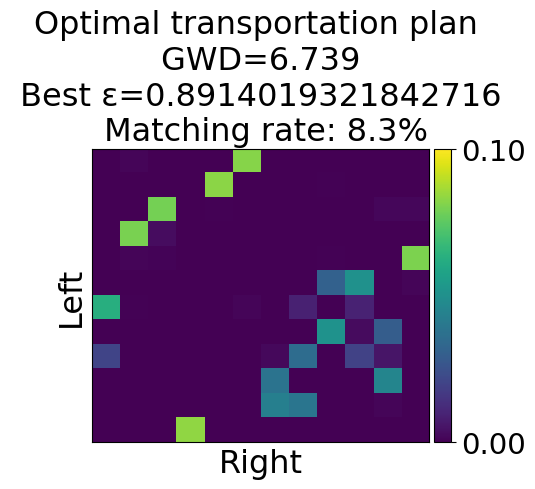

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 8.706


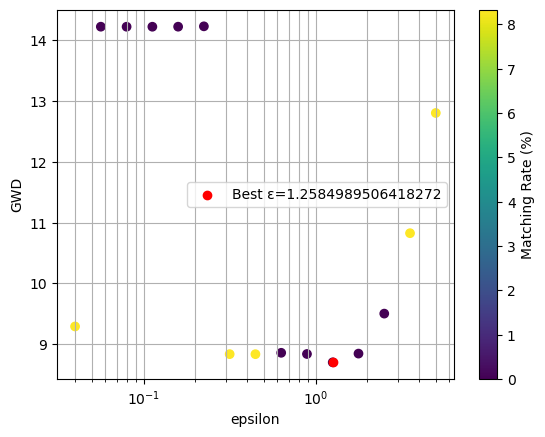

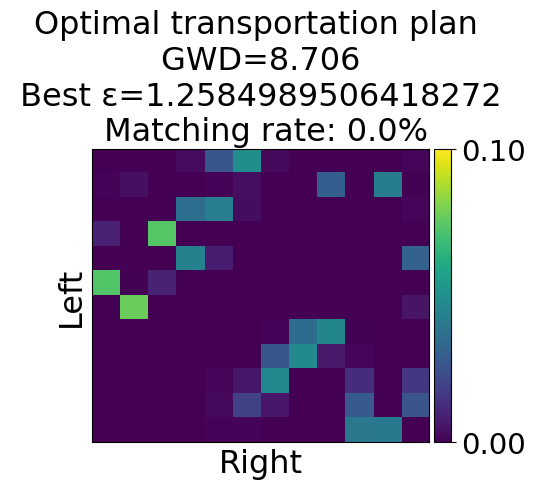

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 4.814


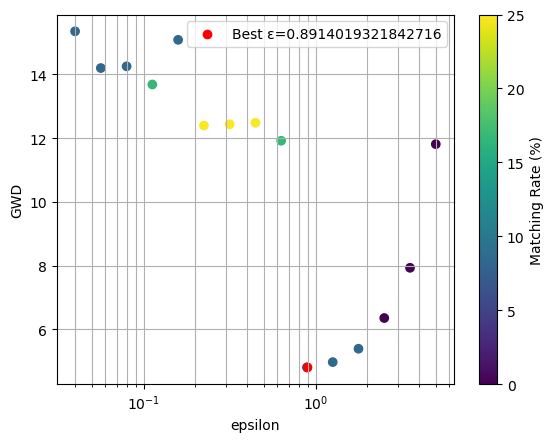

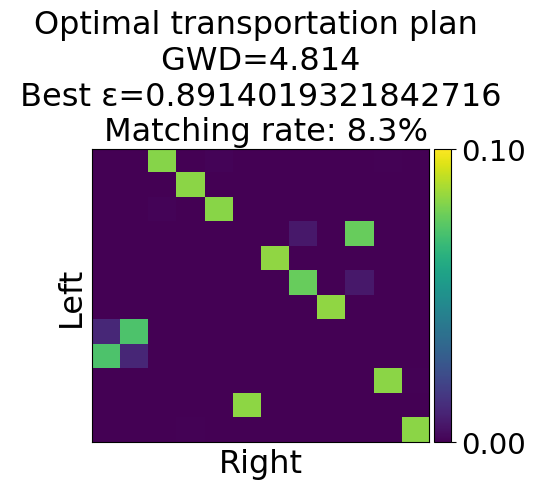

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 7.444


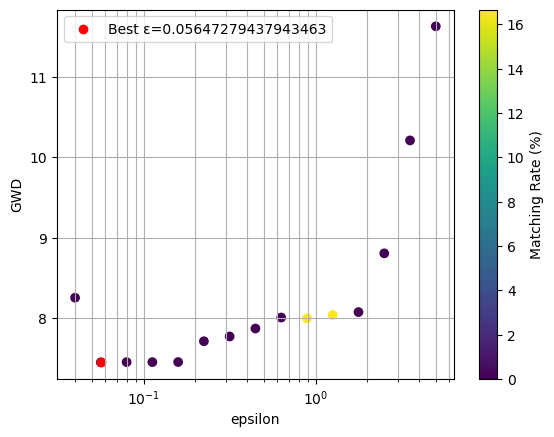

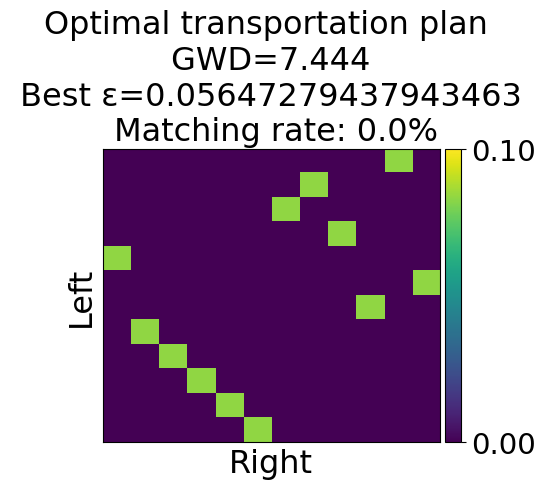

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 15.085


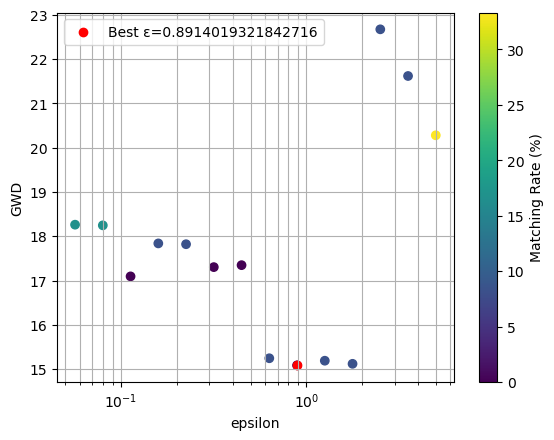

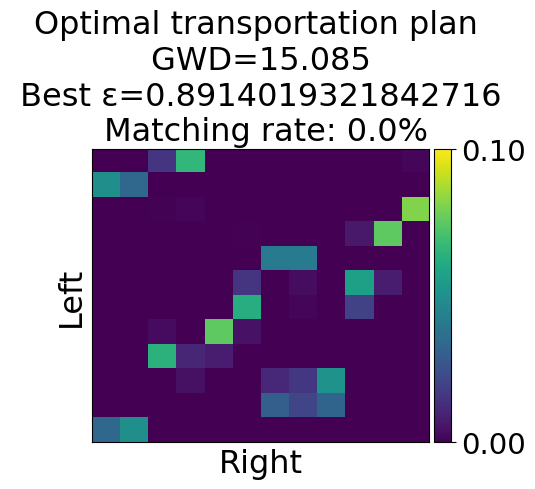

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 7.221


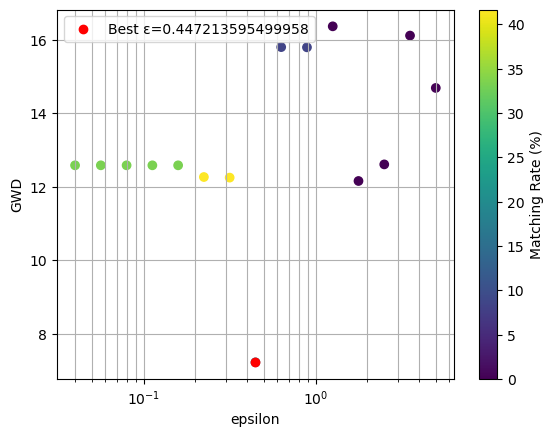

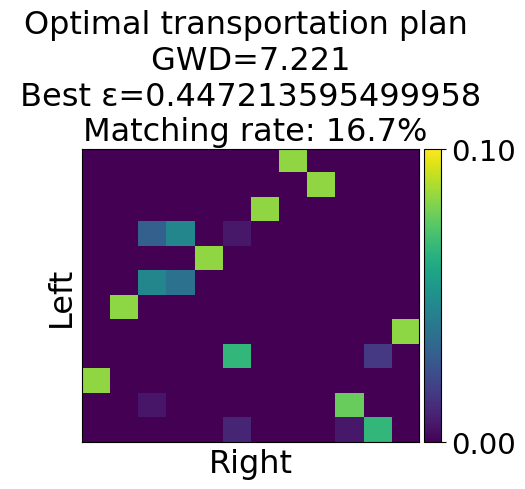

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 4.978


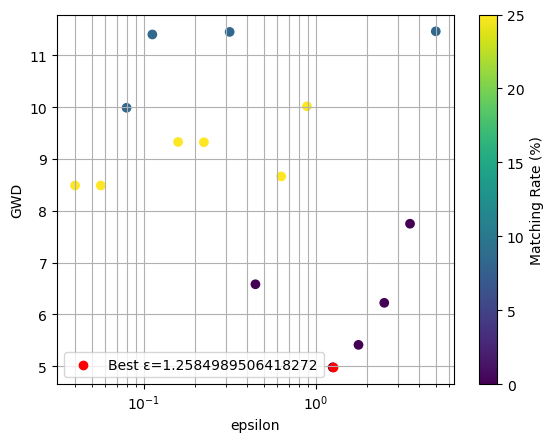

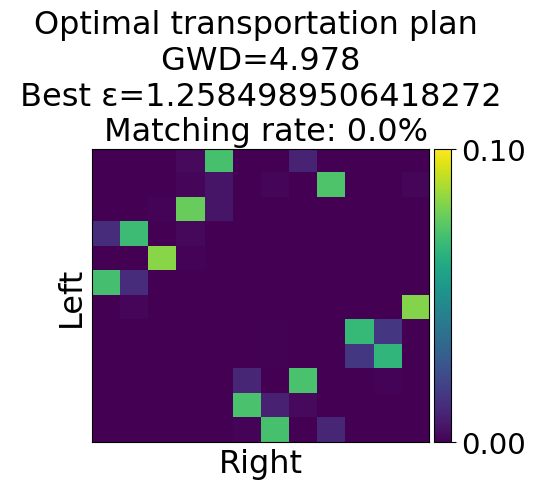

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 6.122


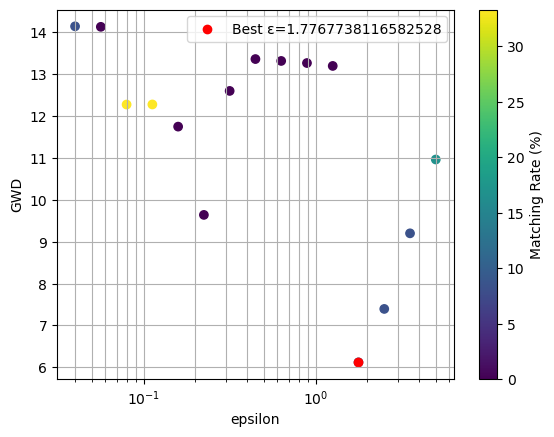

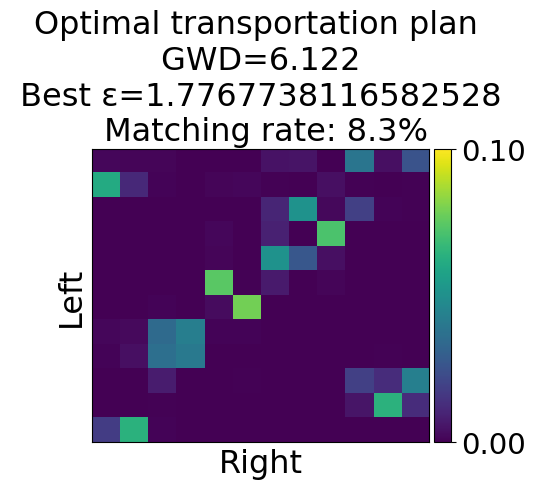

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07972941262554757, Minimum GWD: 13.358


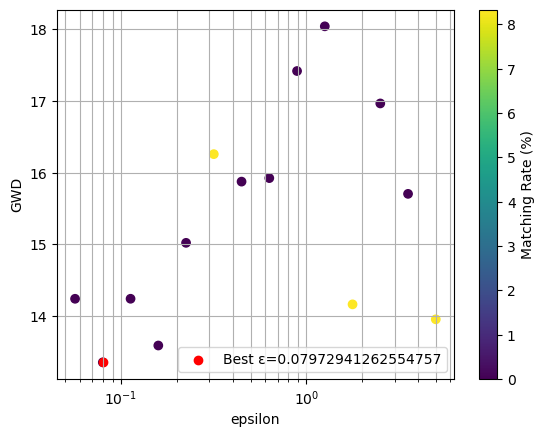

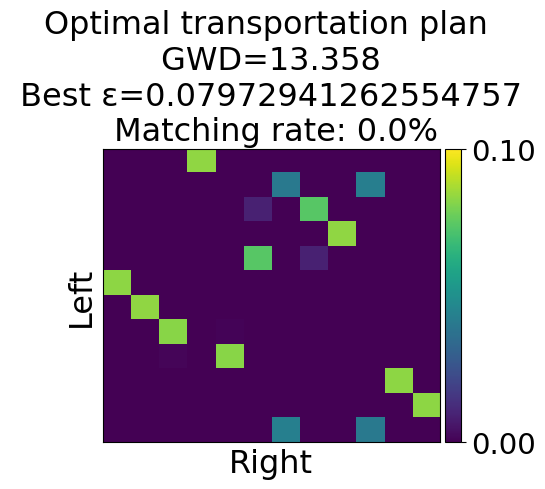

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 5.166


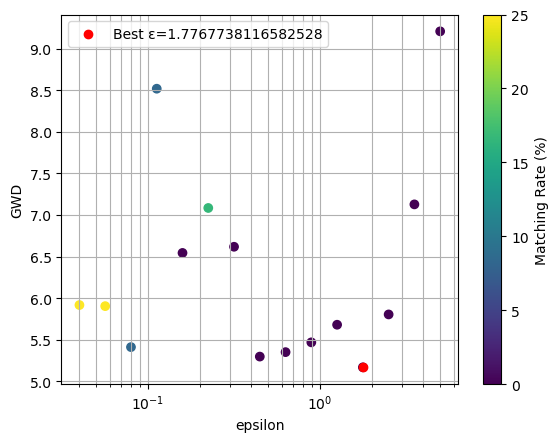

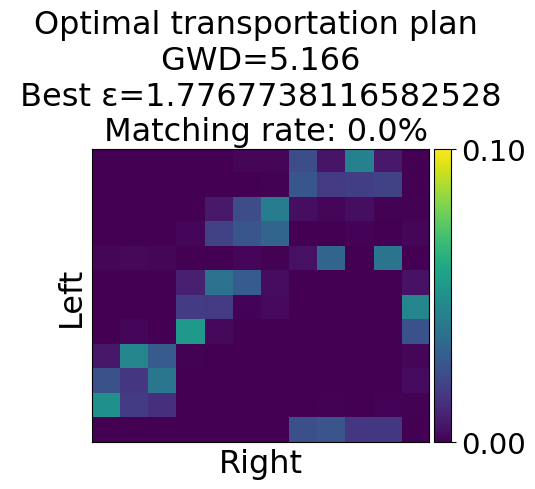

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 5.611


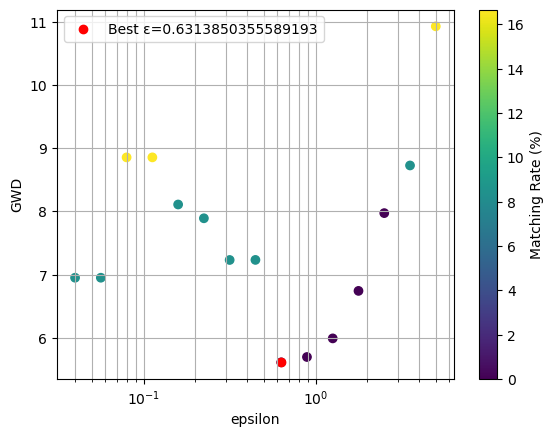

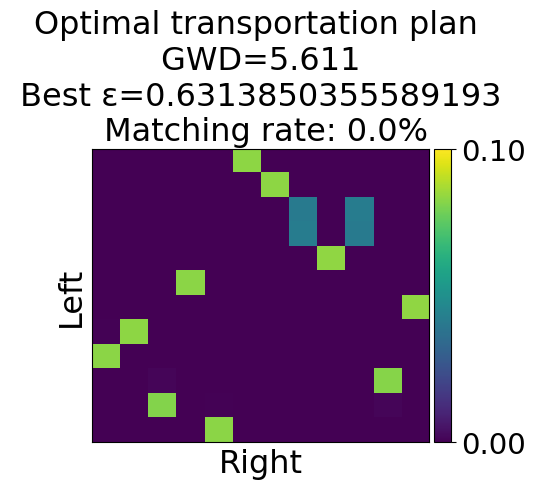

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 5.426


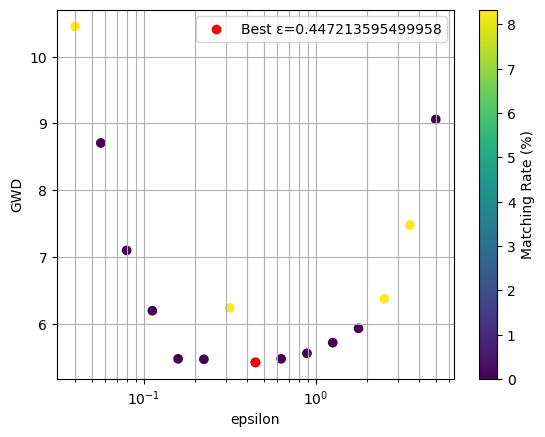

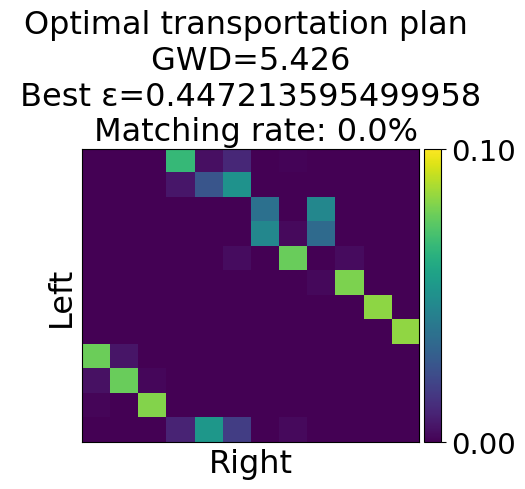

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 7.330


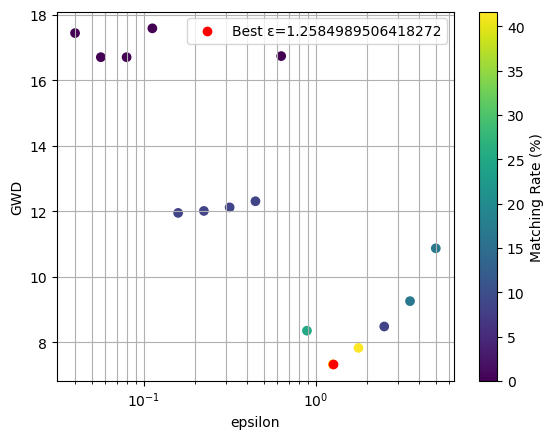

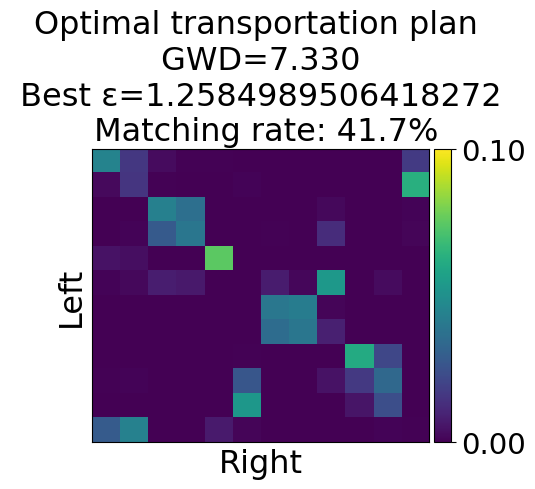

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.22436567925080053, Minimum GWD: 4.804


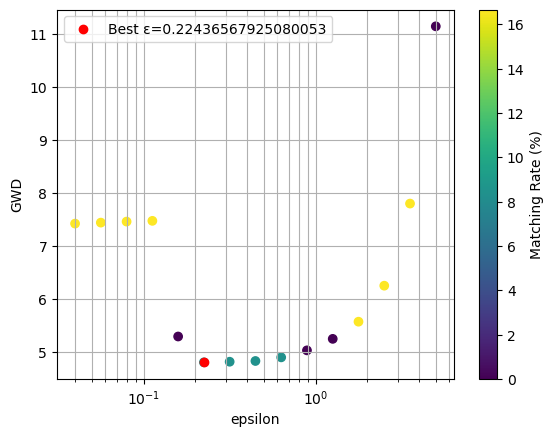

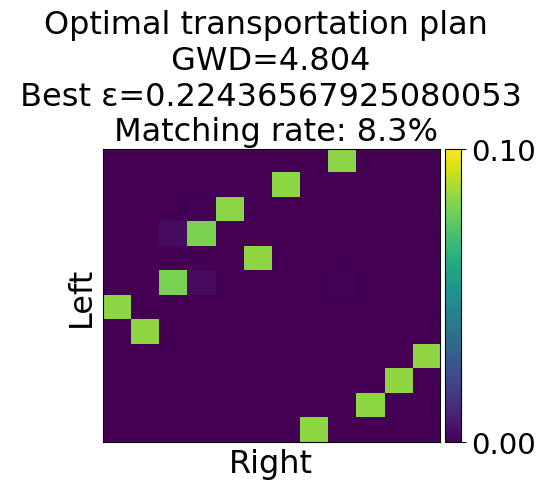

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 6.593


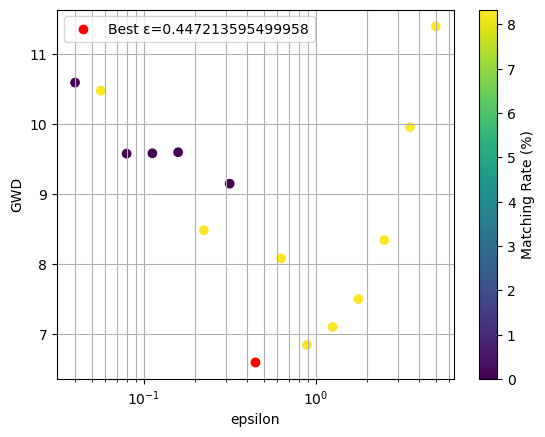

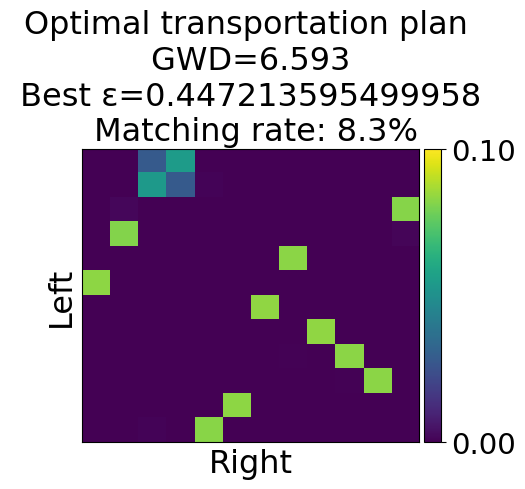

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 5.942


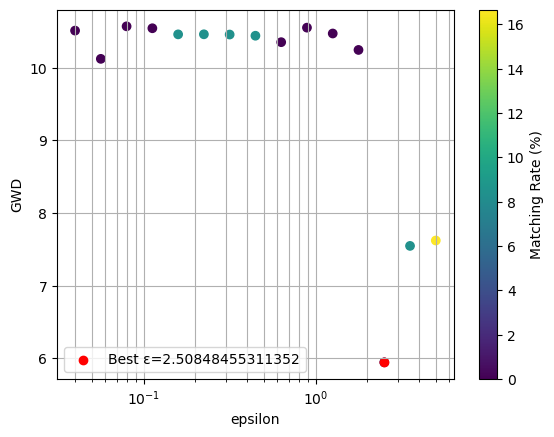

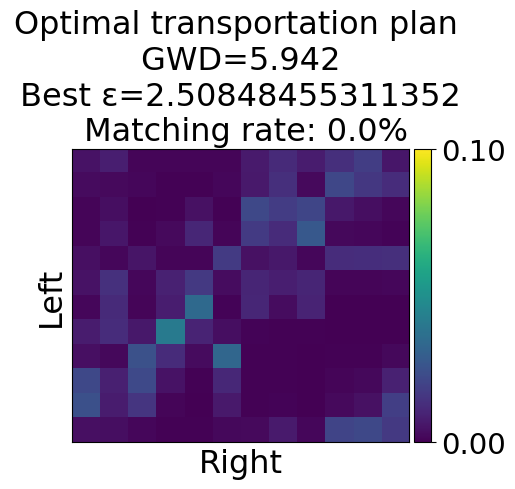

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 6.131


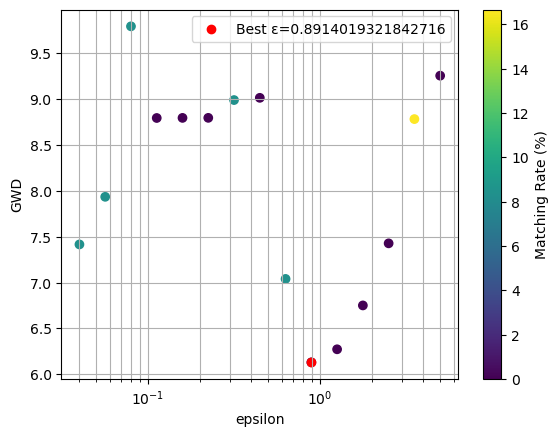

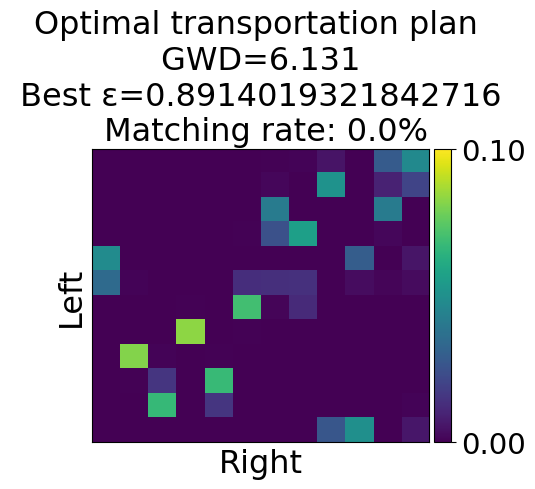

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.05647279437943463, Minimum GWD: 11.383


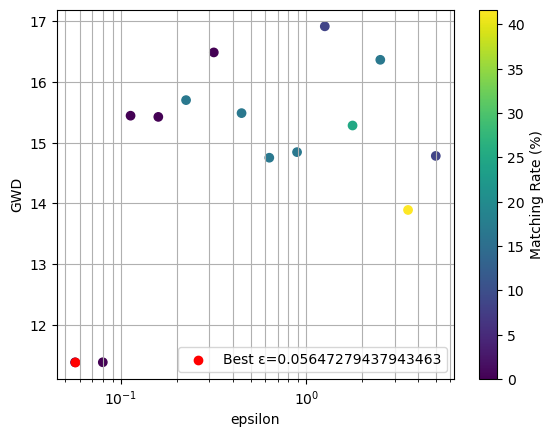

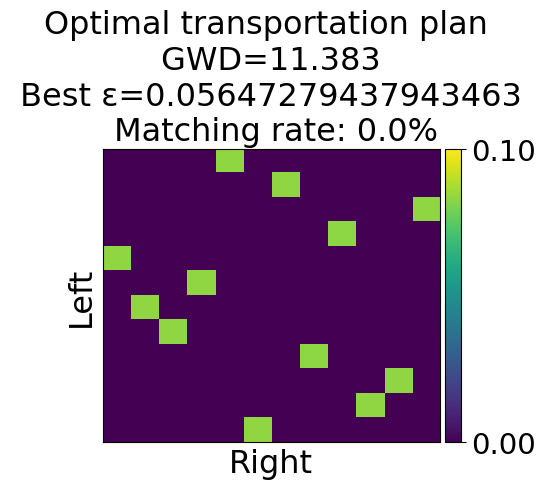

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.1125635681298911, Minimum GWD: 7.518


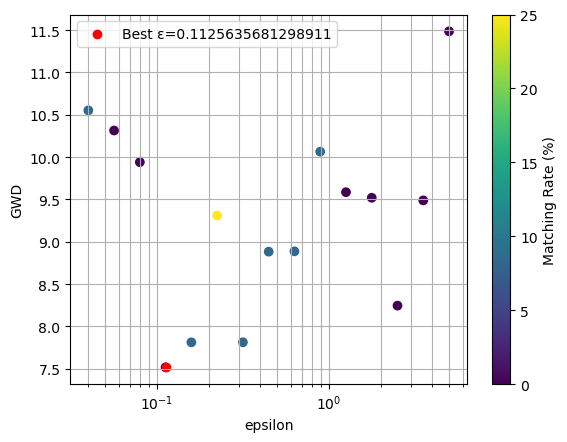

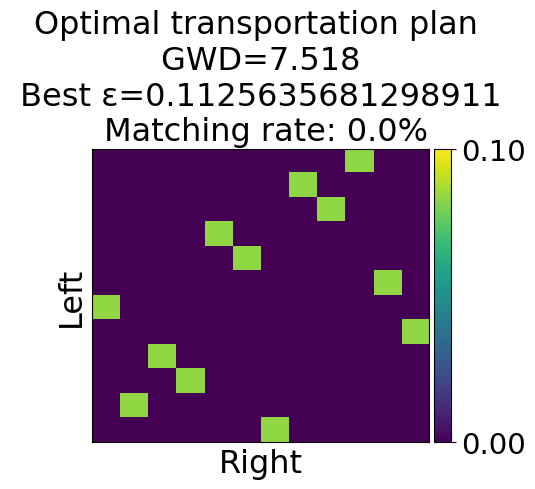

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 11.354


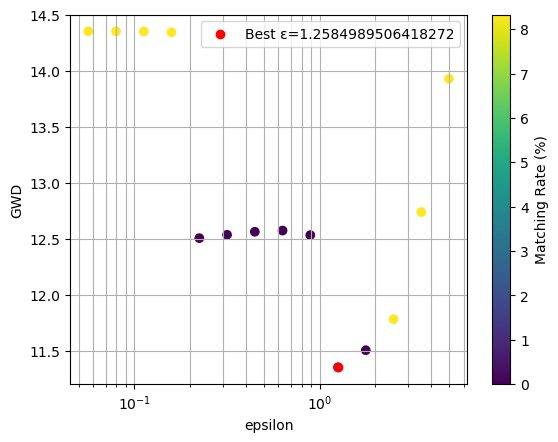

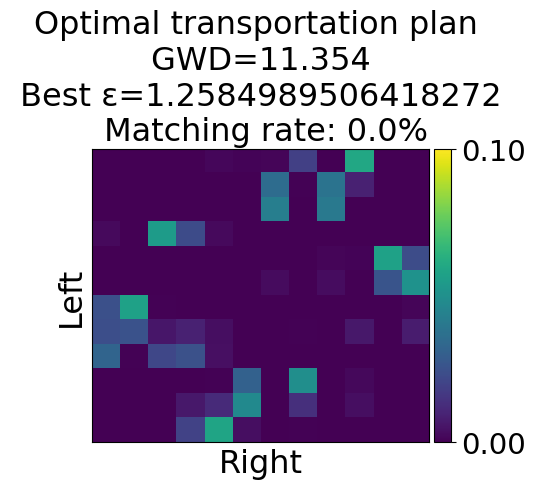

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.
Skipping epsilon=0.05647279437943463 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 15.459


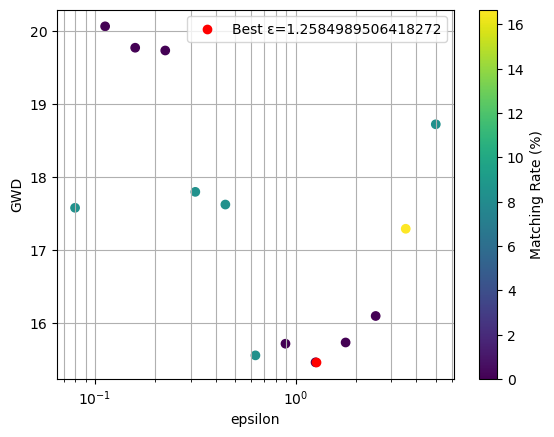

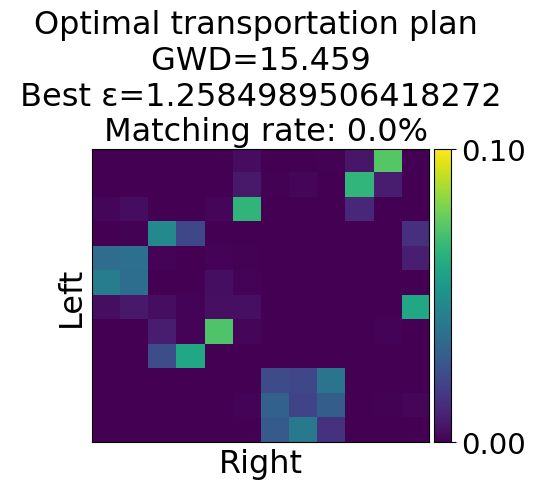

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 8.109


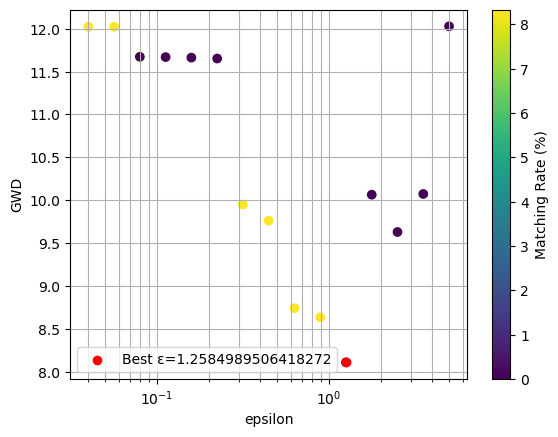

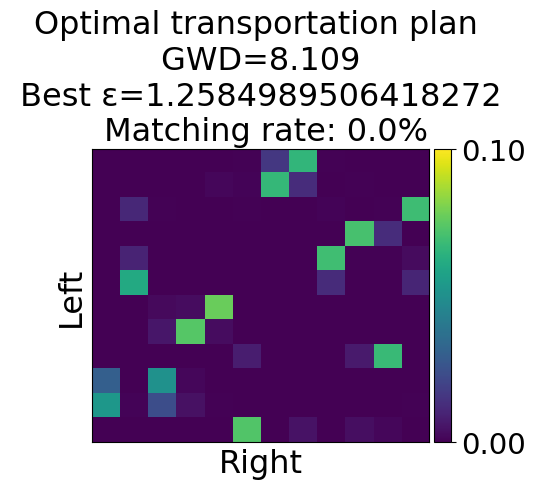

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 5.780


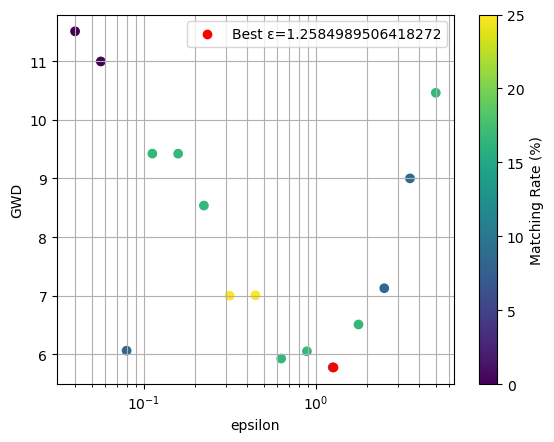

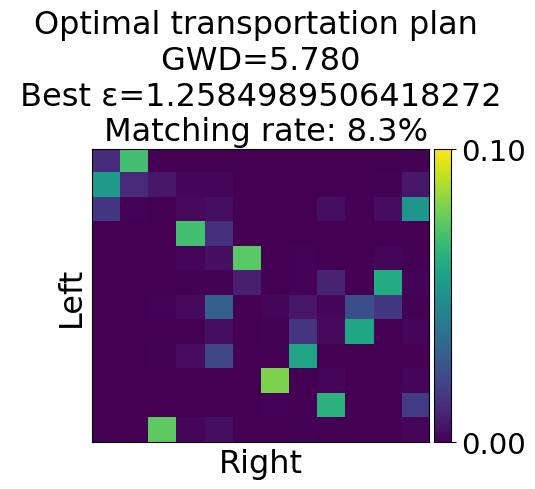

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 8.779


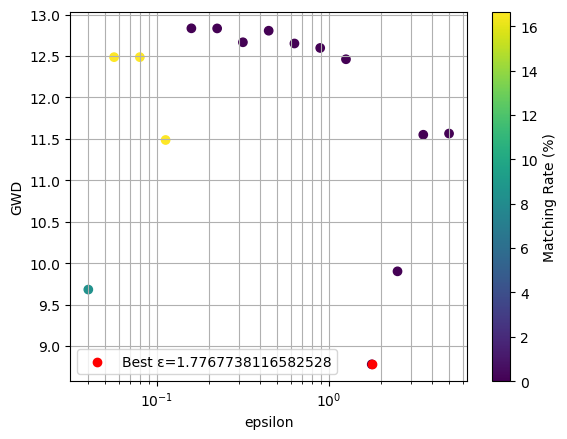

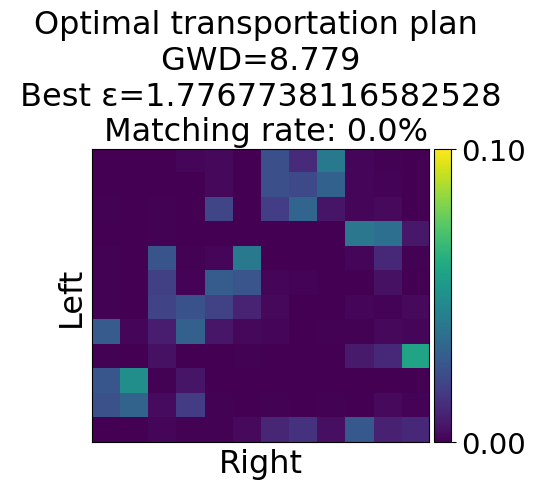

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.447213595499958, Minimum GWD: 10.303


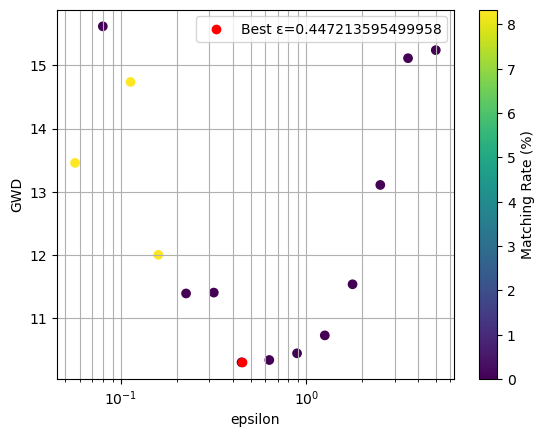

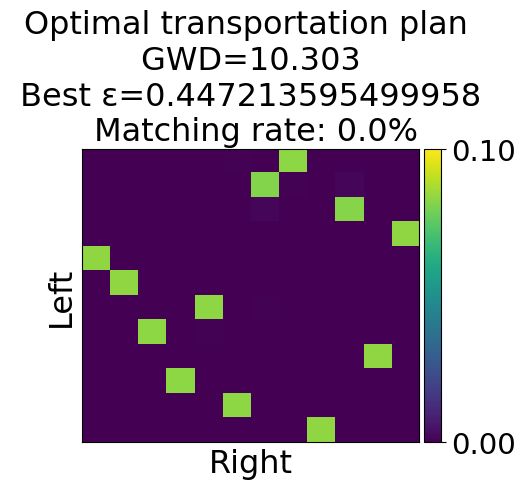

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 7.277


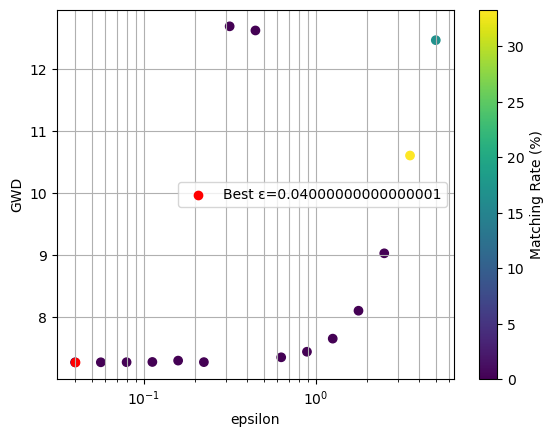

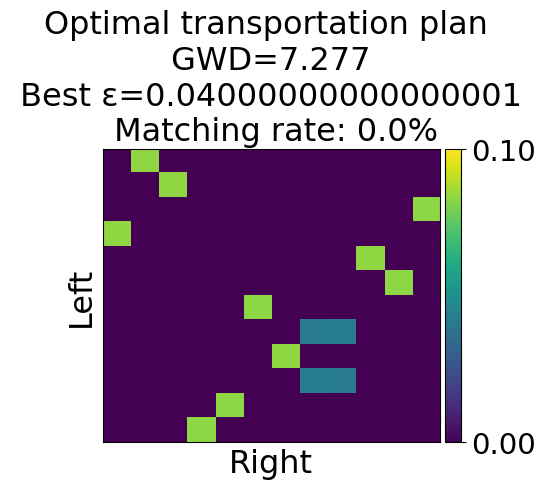

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 4.504


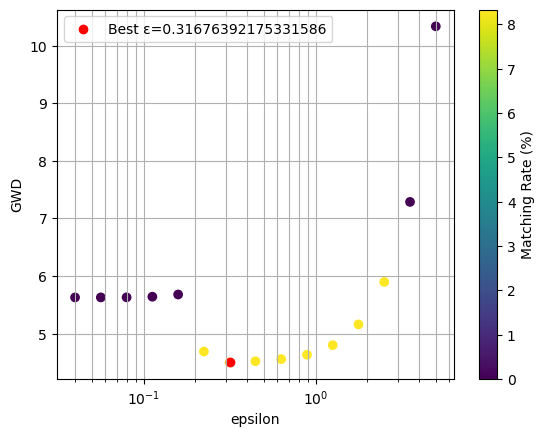

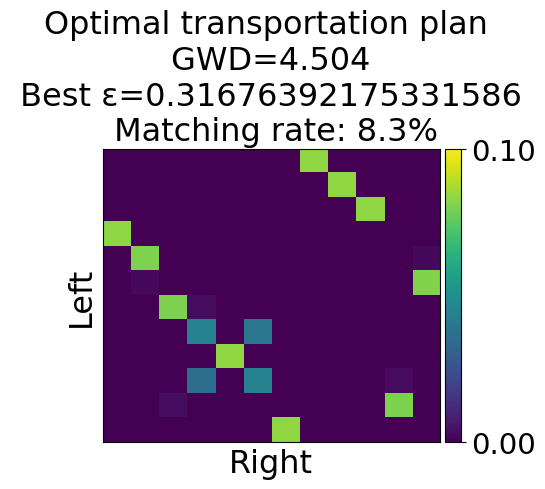

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 8.806


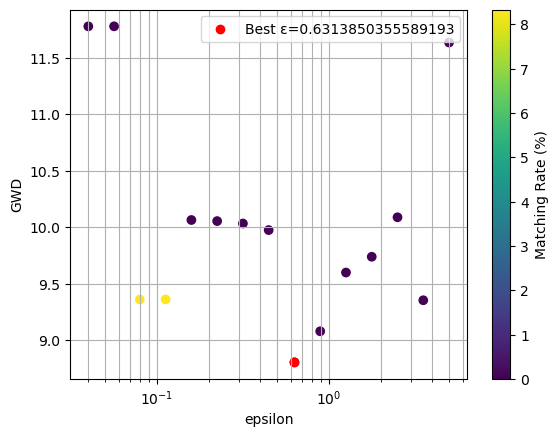

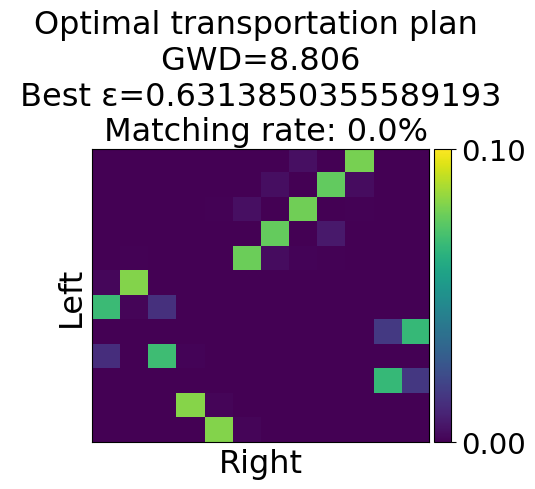

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 12.053


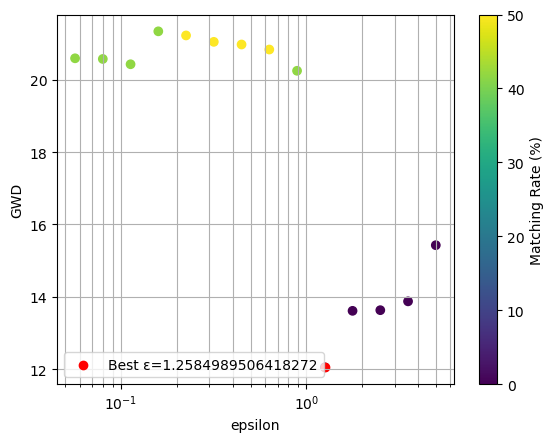

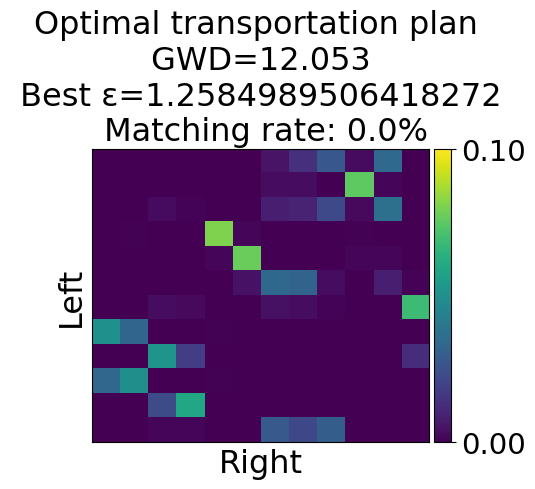

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 6.317


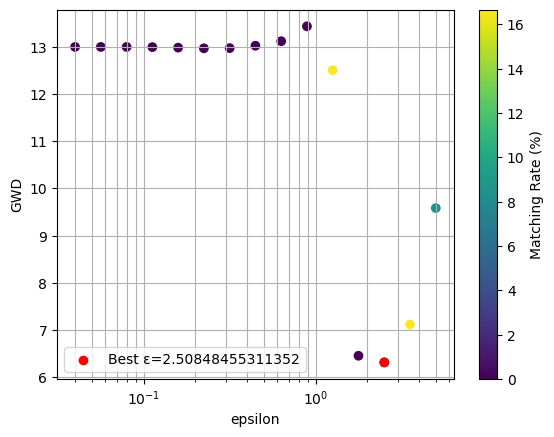

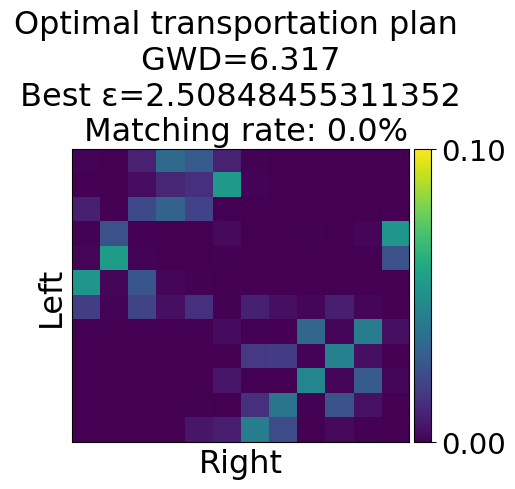

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 4.576


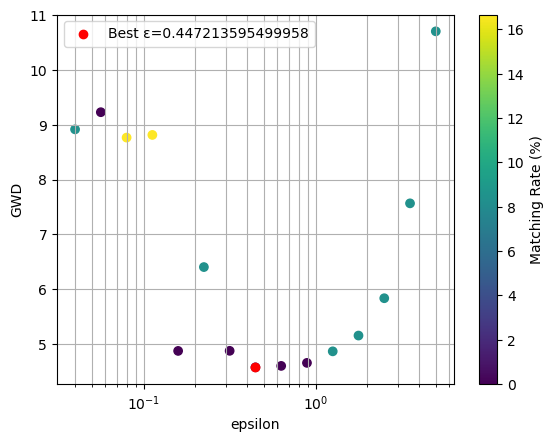

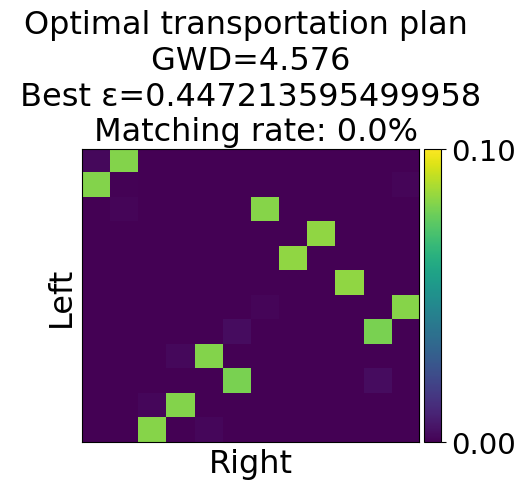

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.447213595499958, Minimum GWD: 4.828


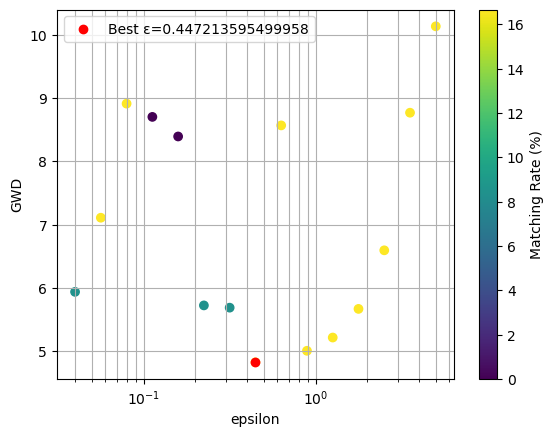

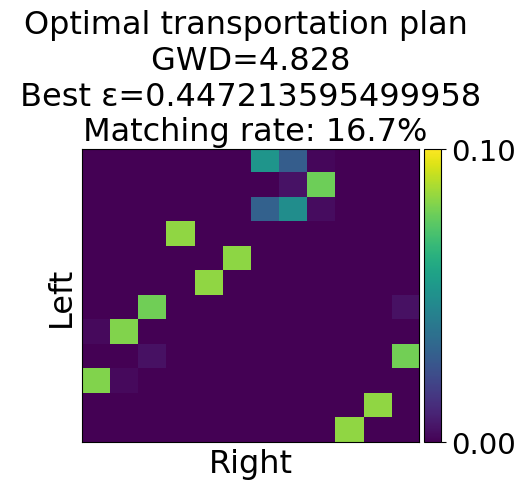

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 8.330


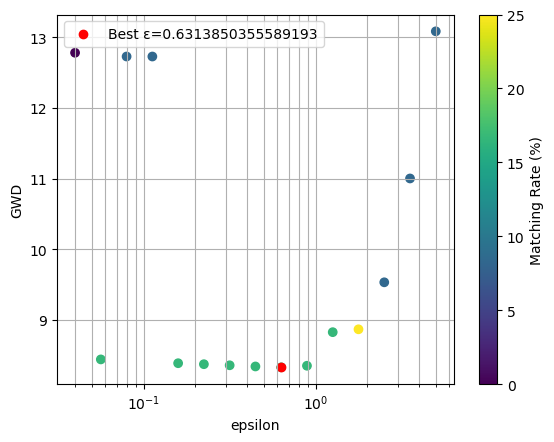

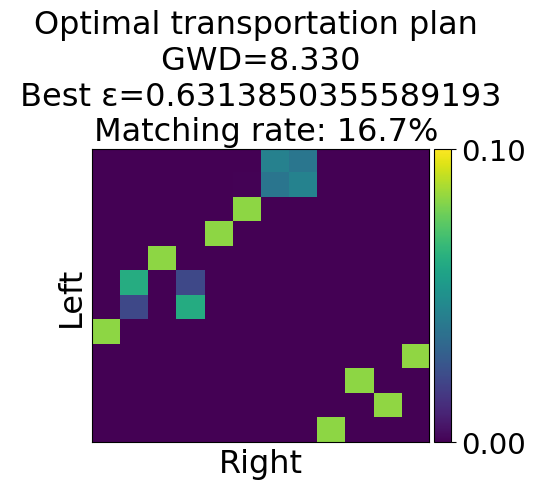

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 7.316


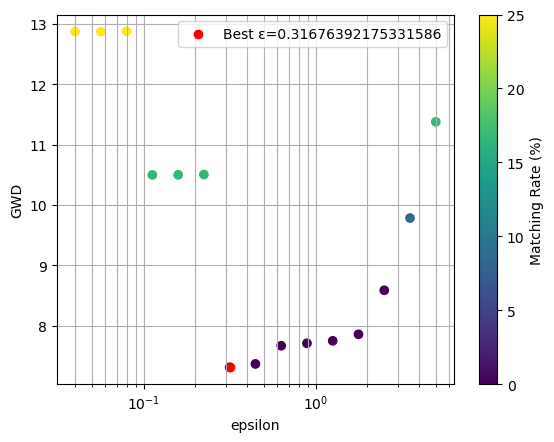

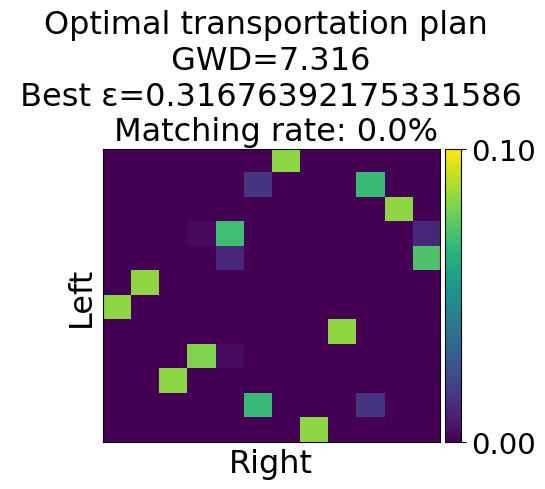

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 9.278


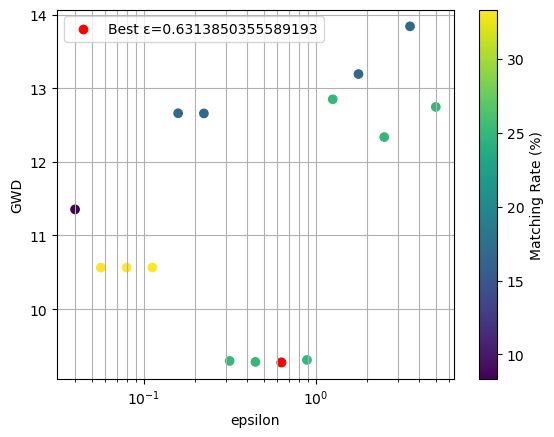

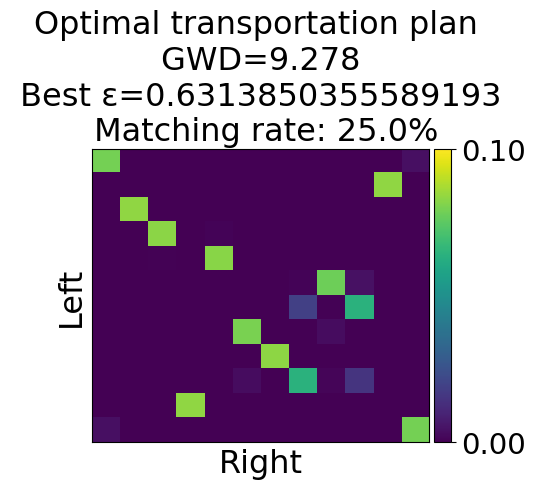

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 5.981


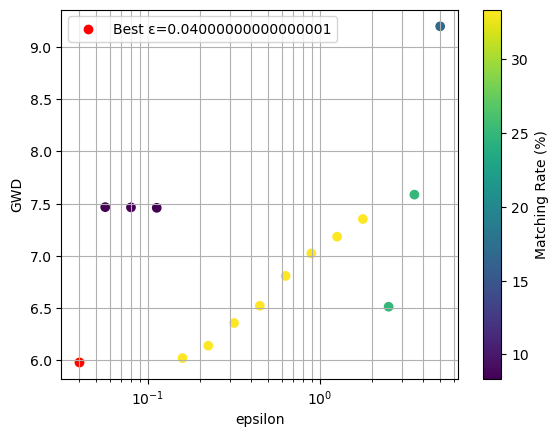

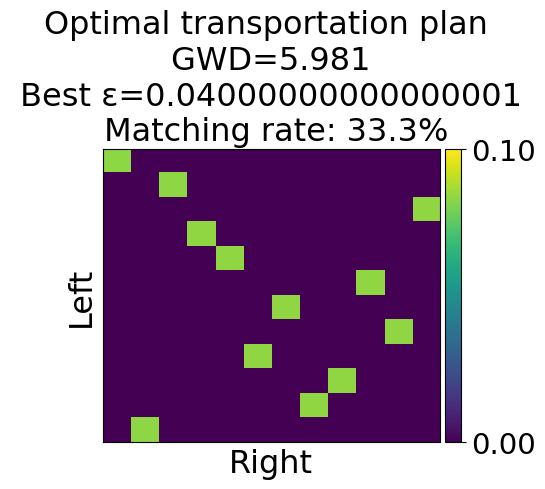

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.22436567925080053, Minimum GWD: 16.087


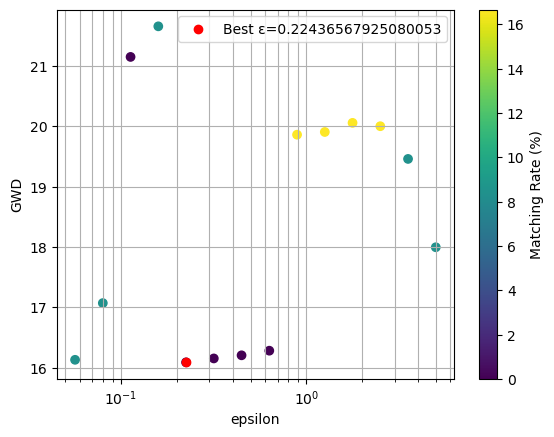

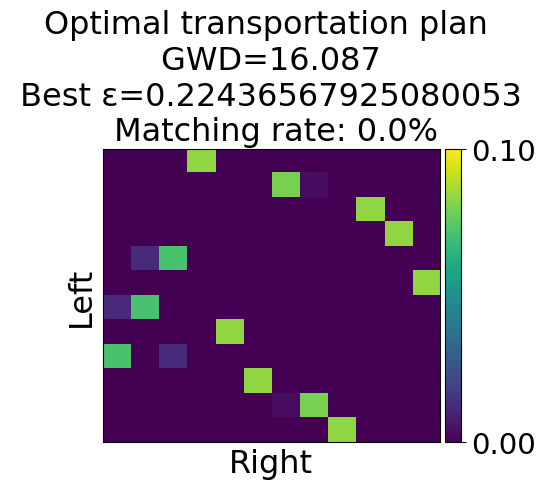

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 7.349


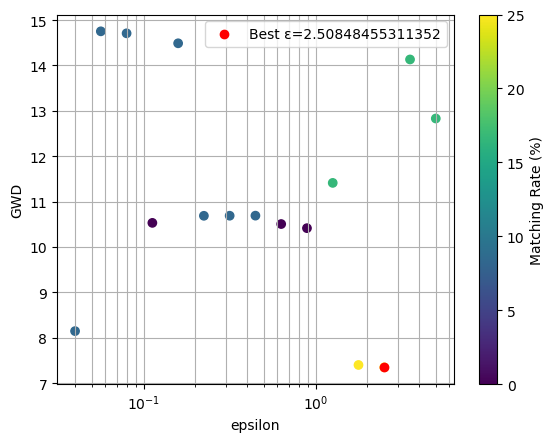

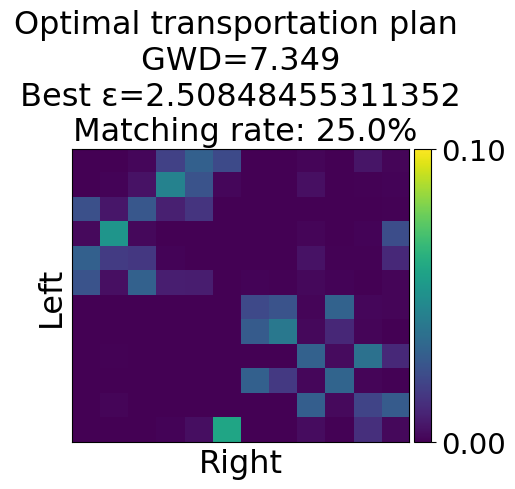

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 7.952


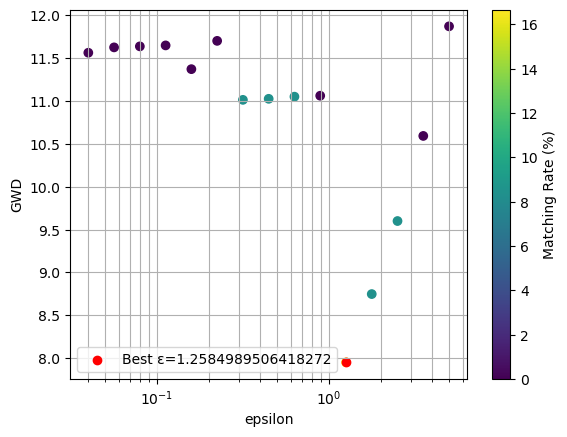

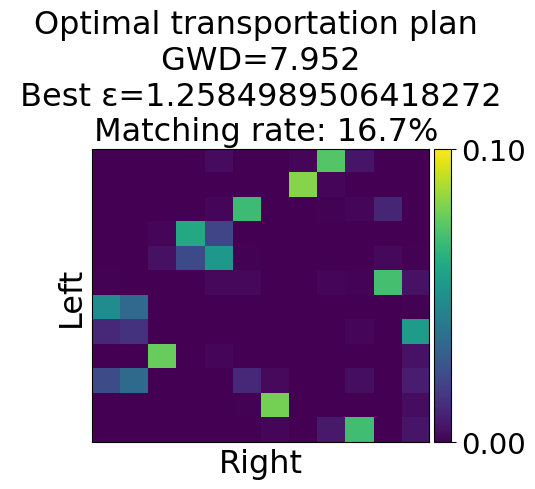

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 9.613


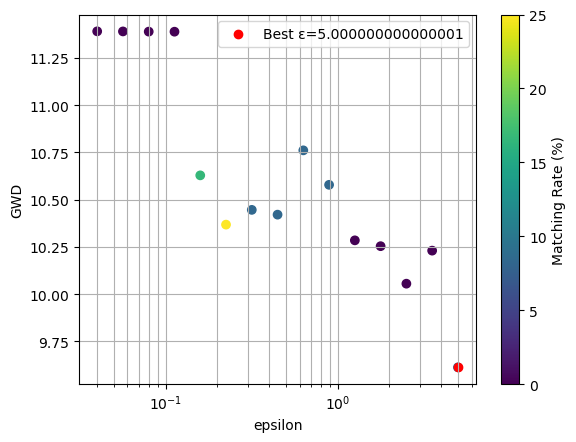

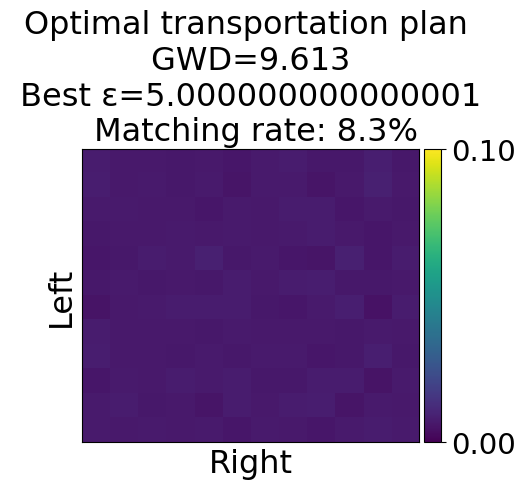

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.1125635681298911, Minimum GWD: 10.544


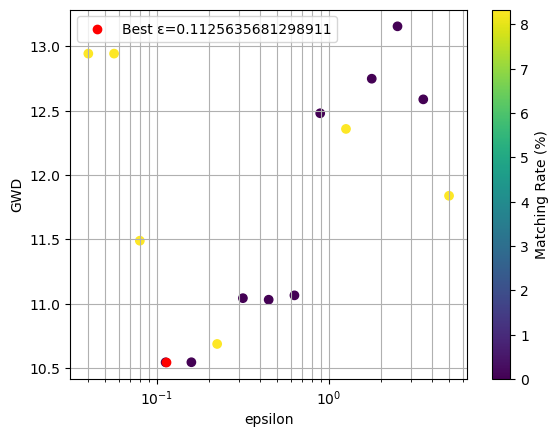

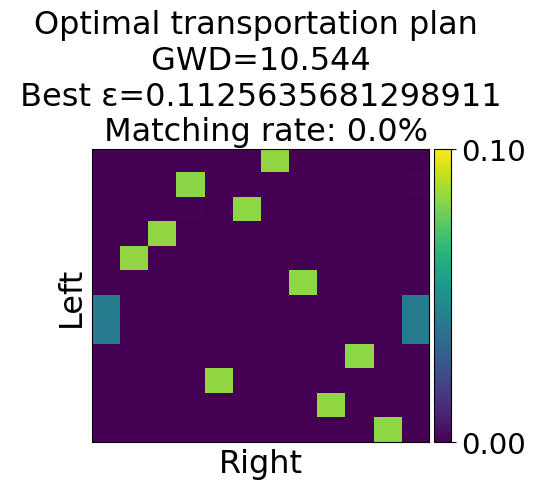

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 3.5415283092991934, Minimum GWD: 9.173


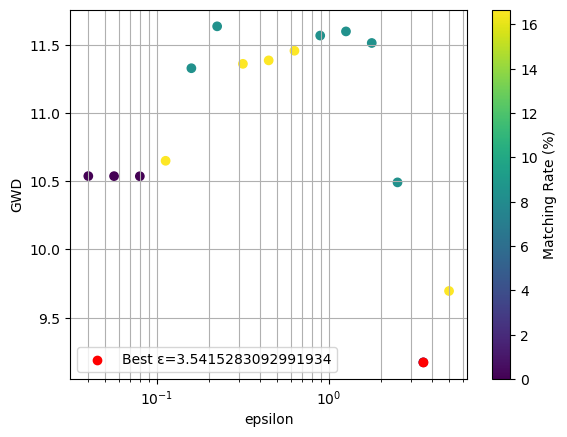

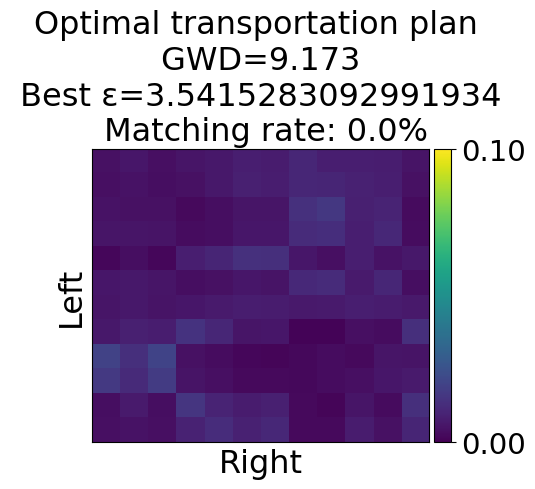

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 2.50848455311352, Minimum GWD: 7.052


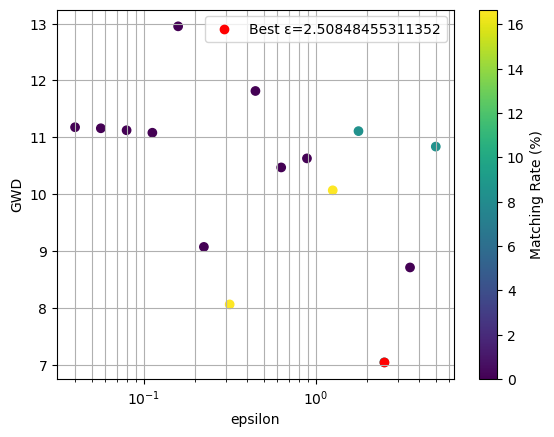

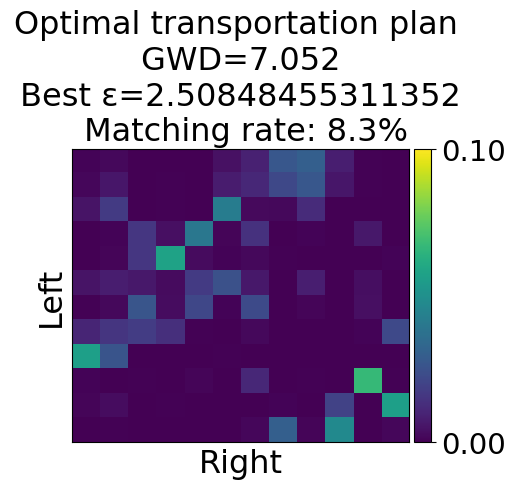

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 3.5415283092991934, Minimum GWD: 7.672


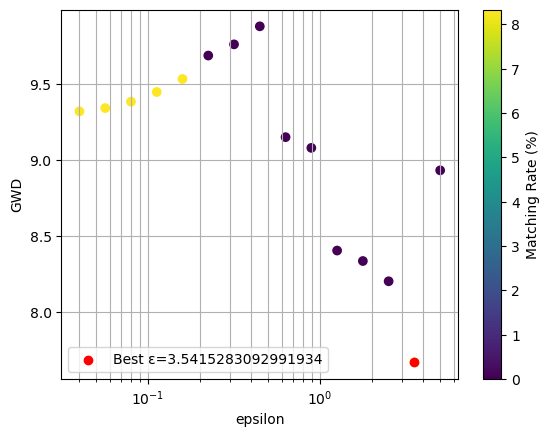

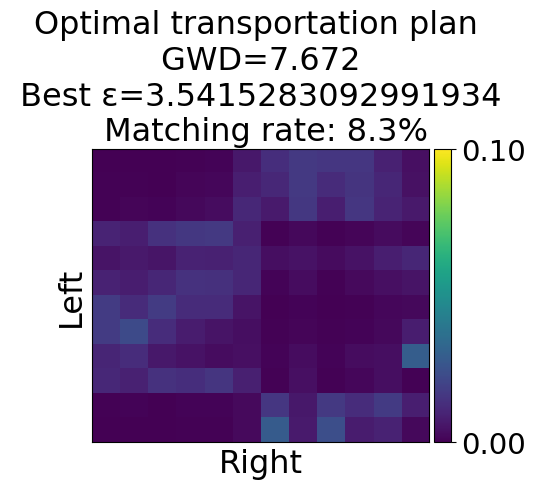

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 9.198


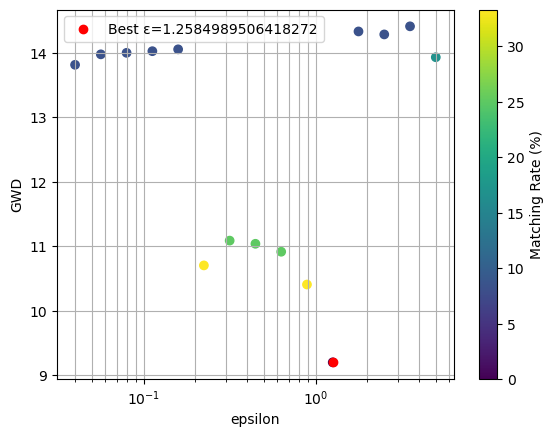

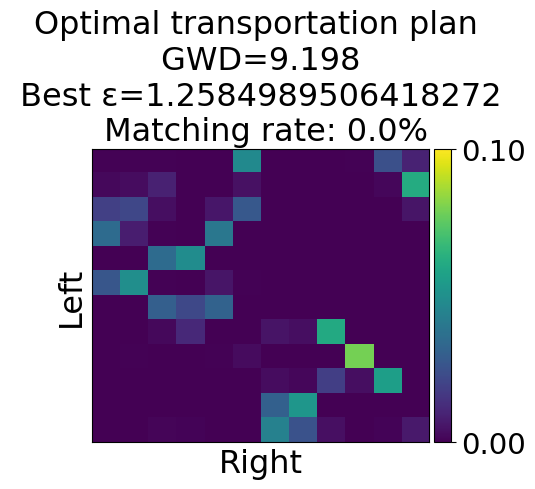

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 5.903


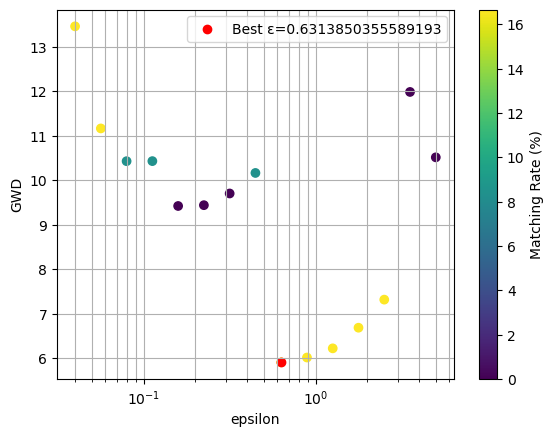

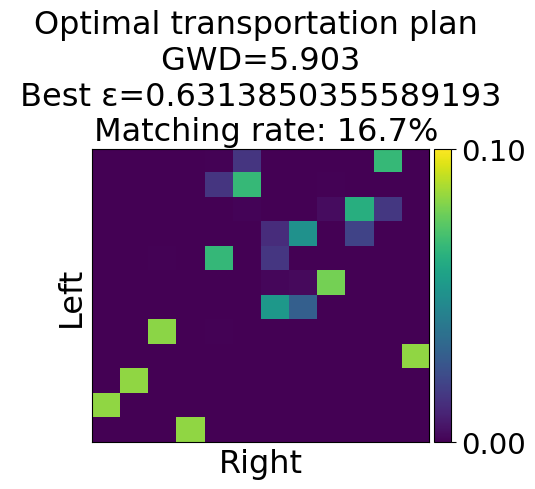

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 5.535


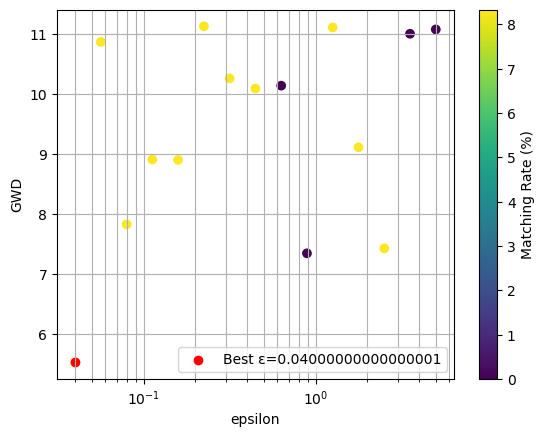

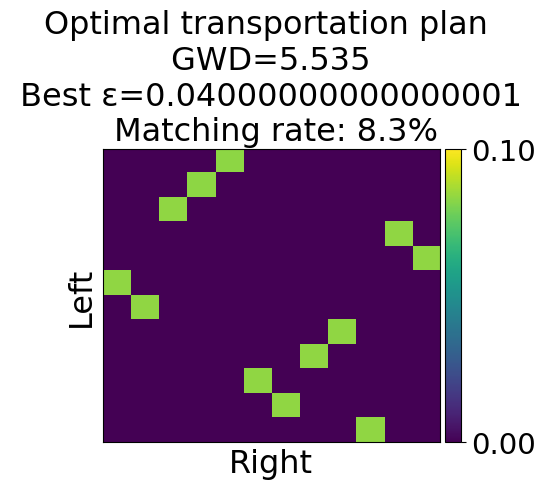

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.6313850355589193, Minimum GWD: 7.035


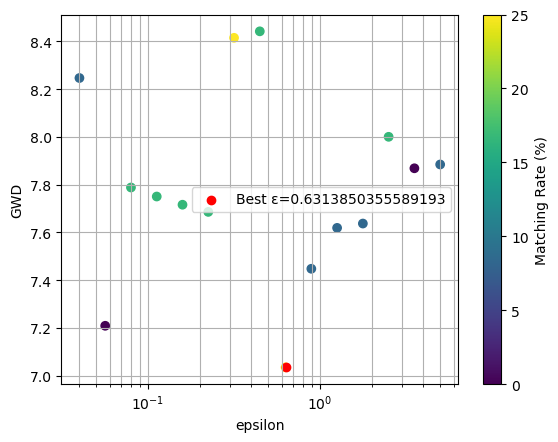

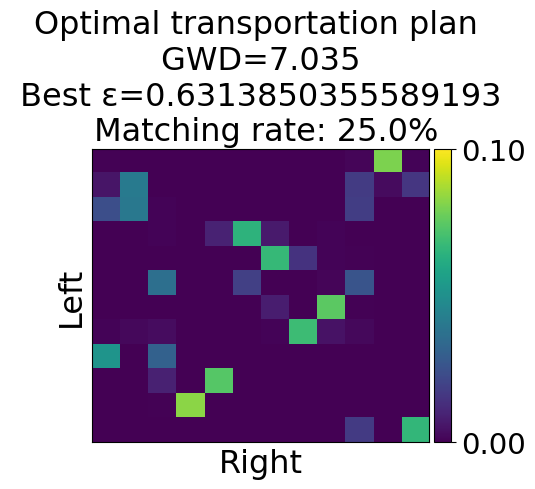

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31676392175331586, Minimum GWD: 5.924


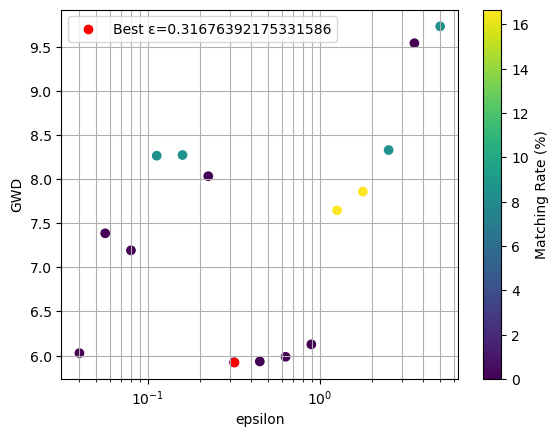

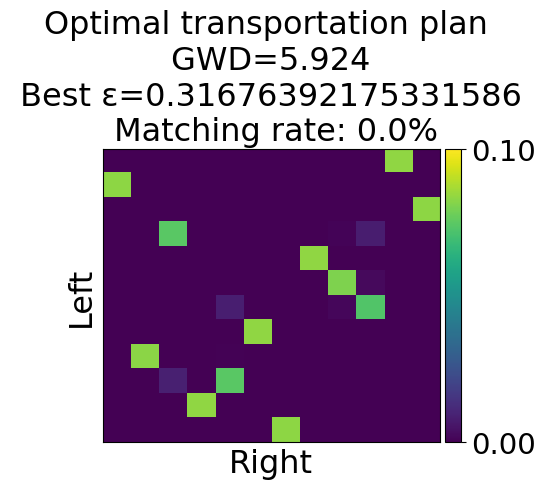

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.7767738116582528, Minimum GWD: 10.998


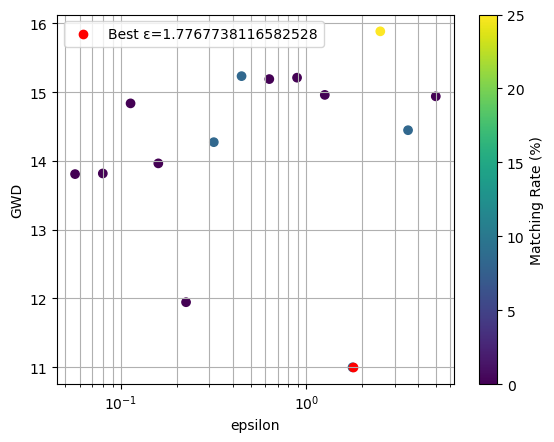

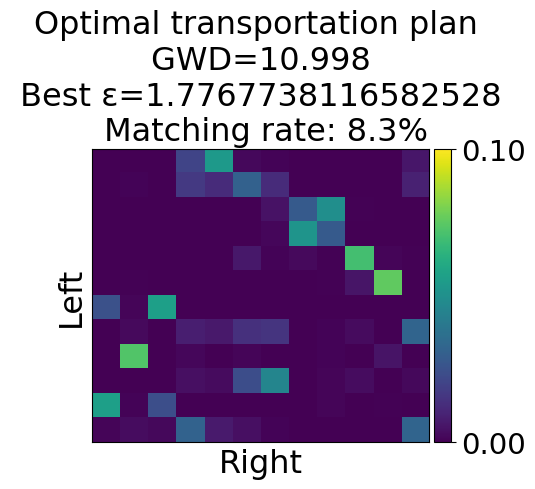

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.2584989506418272, Minimum GWD: 7.994


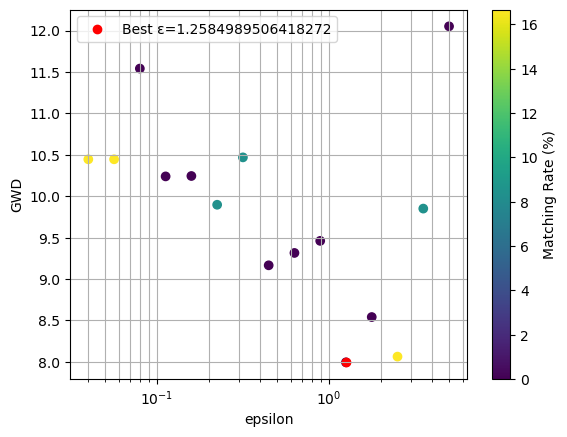

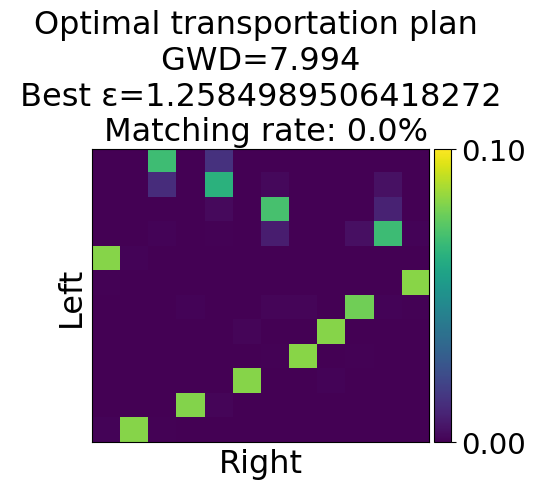

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.7767738116582528, Minimum GWD: 9.791


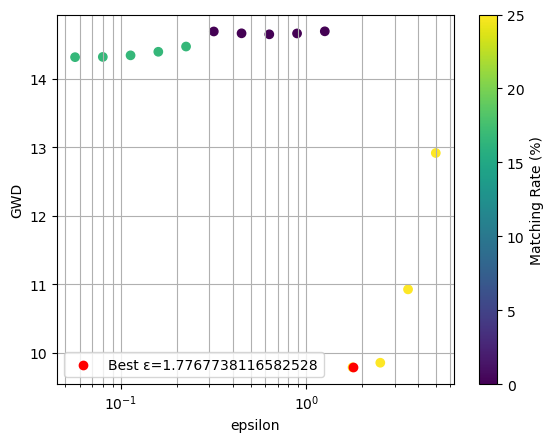

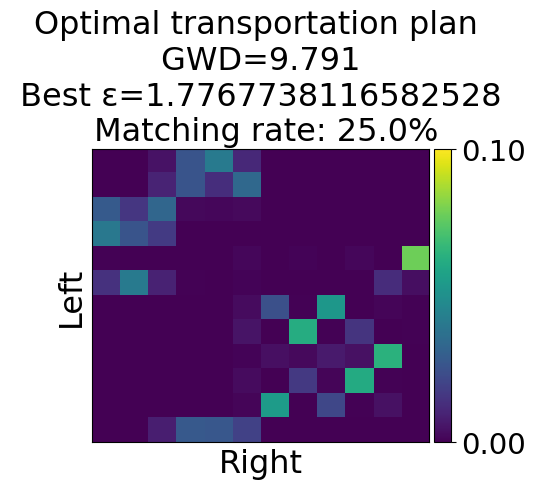

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.
Skipping epsilon=0.05647279437943463 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.7767738116582528, Minimum GWD: 18.506


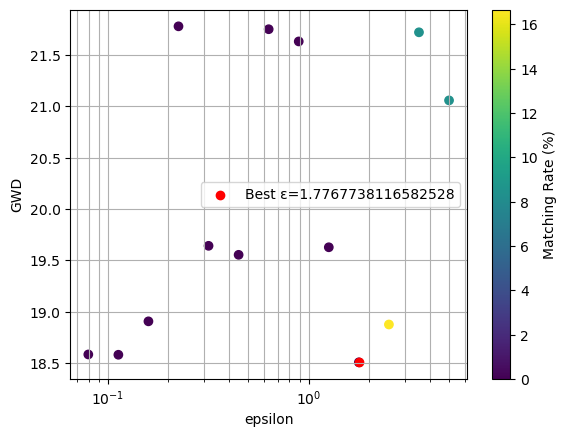

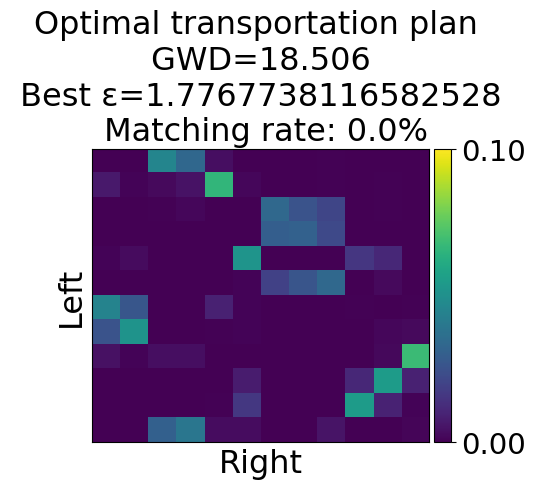

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 12.880


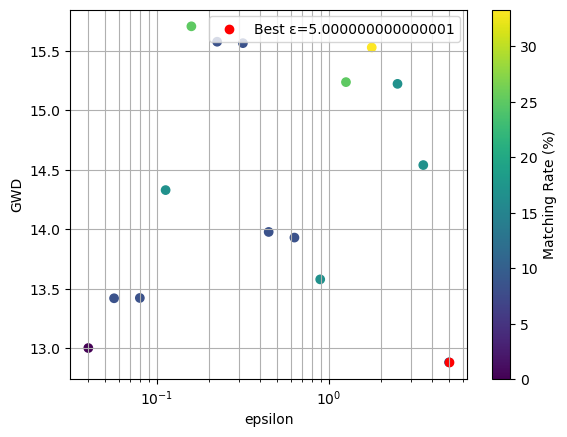

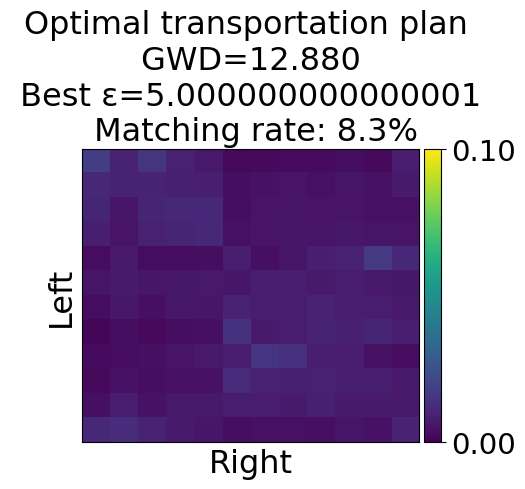

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.1125635681298911, Minimum GWD: 5.505


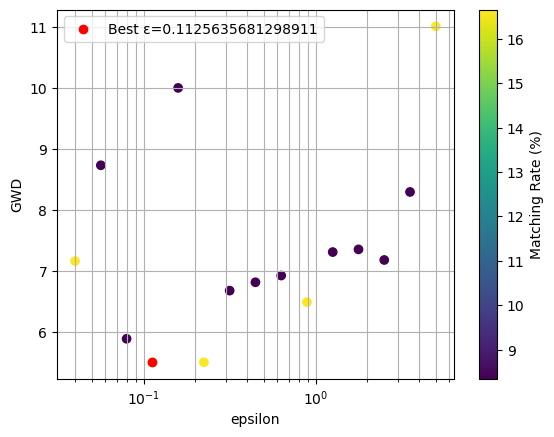

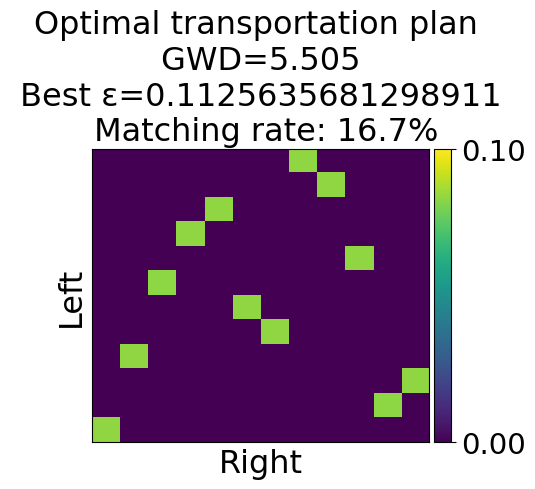

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 9.701


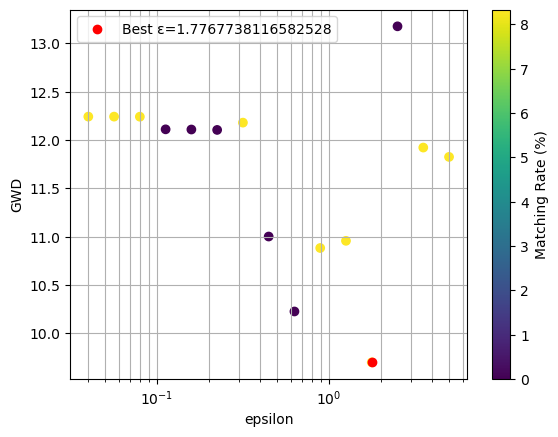

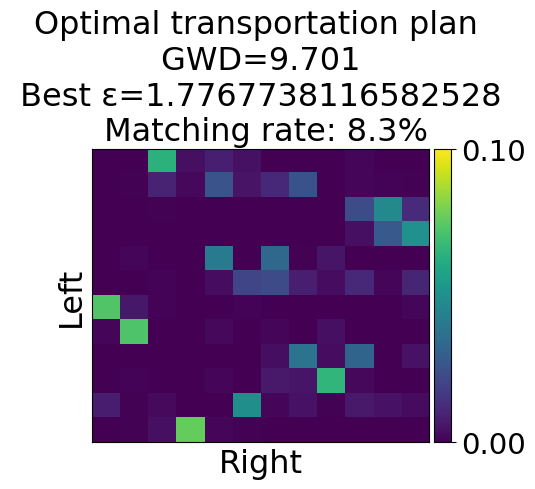

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.15891948094037048, Minimum GWD: 14.316


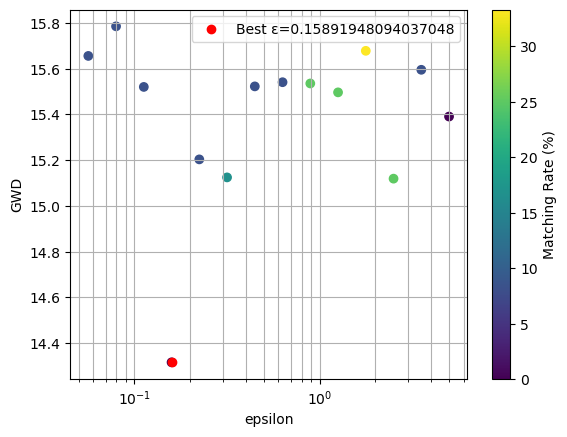

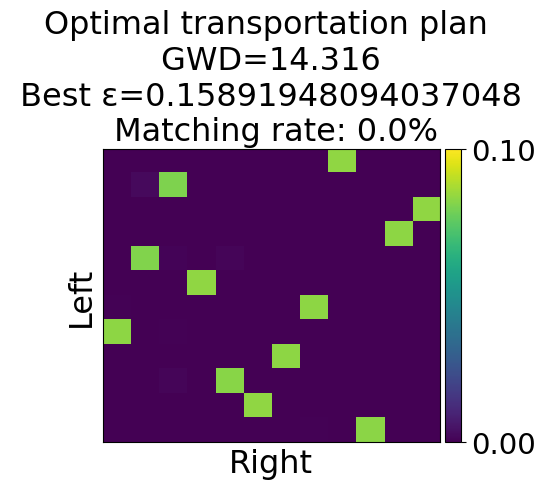

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.05647279437943463, Minimum GWD: 11.965


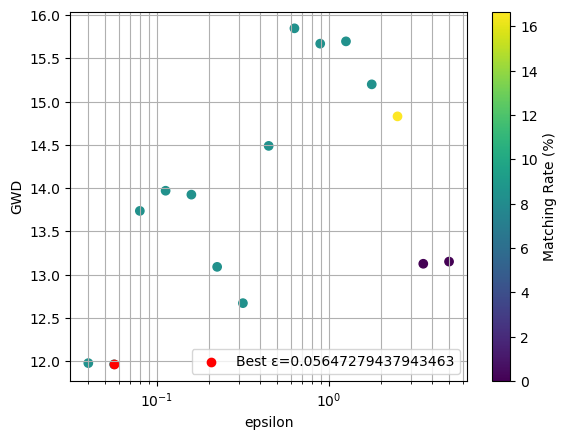

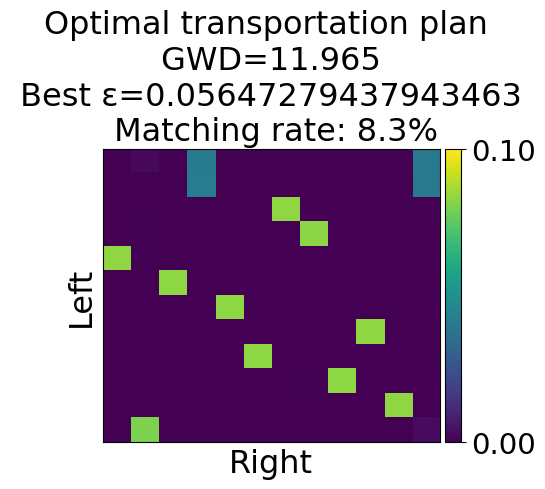

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.04000000000000001, Minimum GWD: 5.515


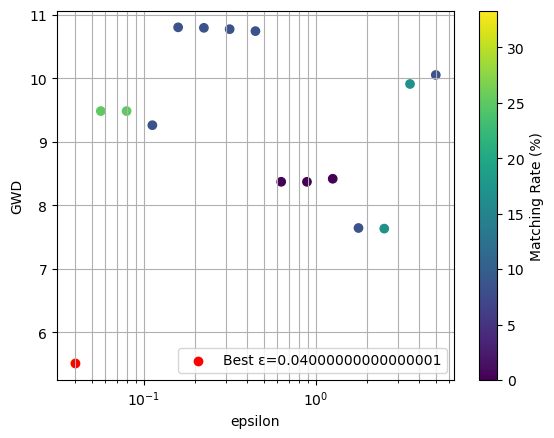

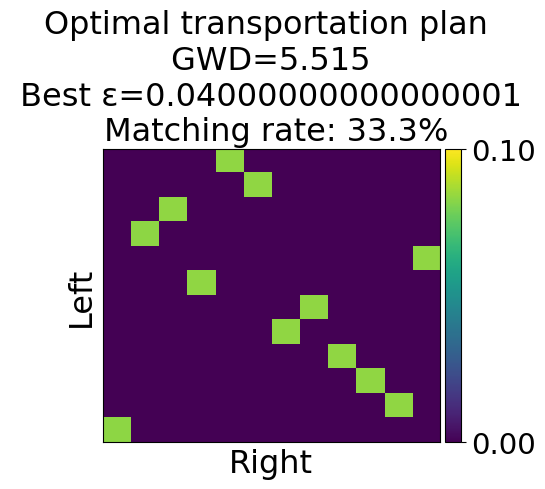

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 5.000000000000001, Minimum GWD: 12.375


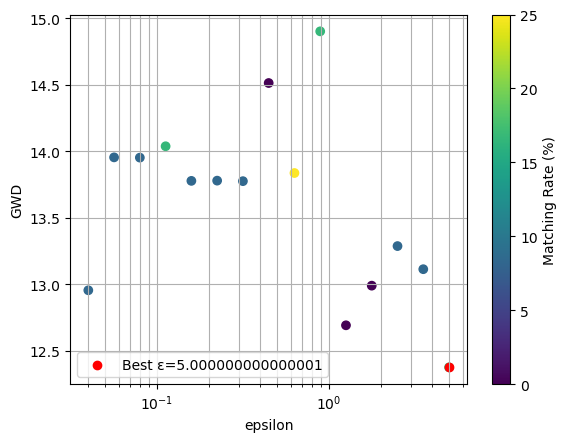

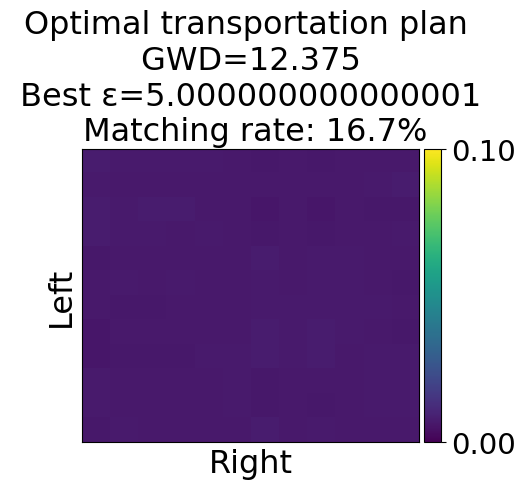

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.2584989506418272, Minimum GWD: 13.461


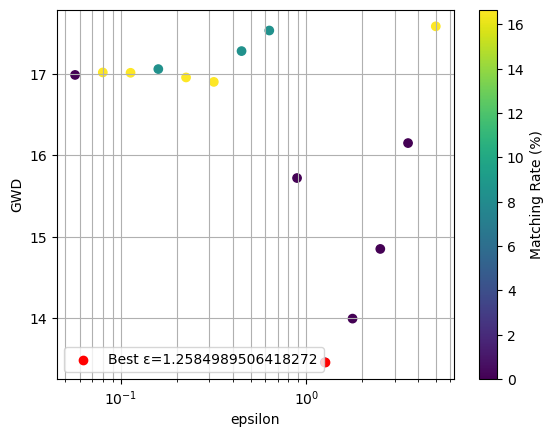

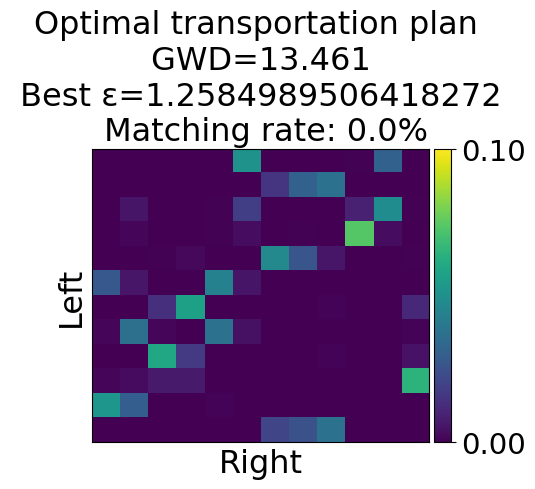

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07972941262554757, Minimum GWD: 5.681


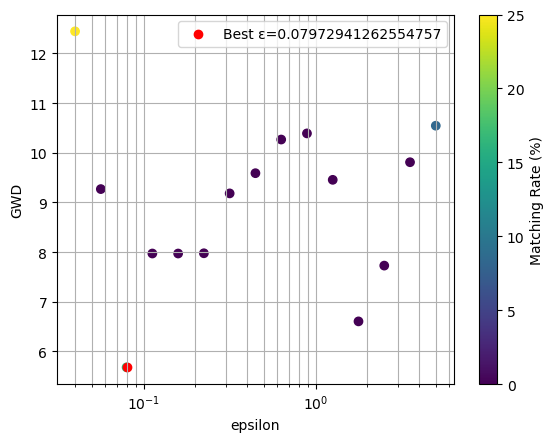

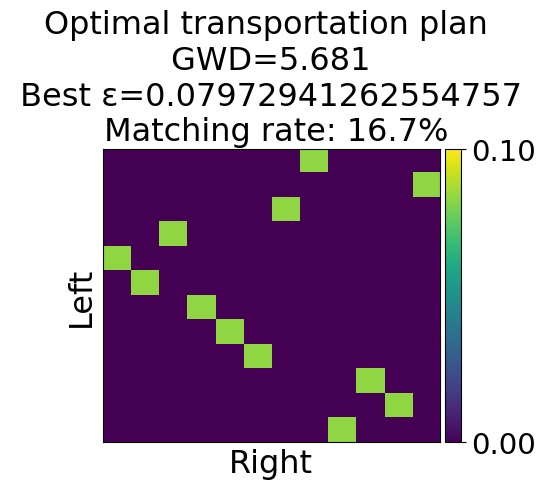

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.7767738116582528, Minimum GWD: 5.698


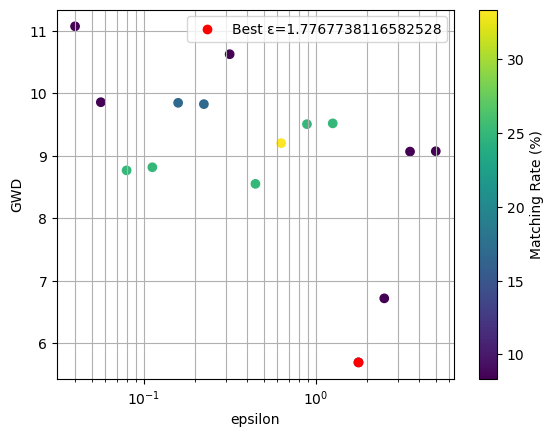

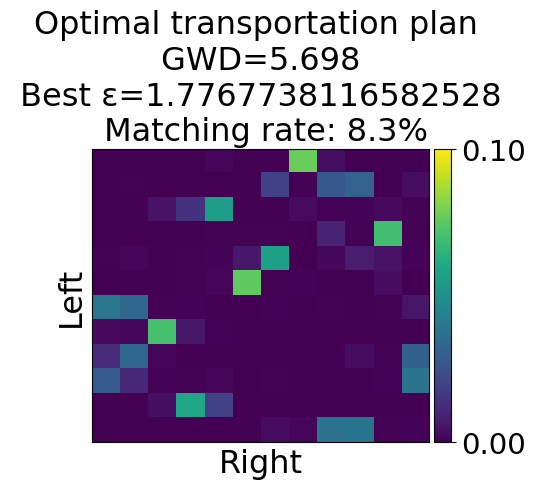

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8914019321842716, Minimum GWD: 9.110


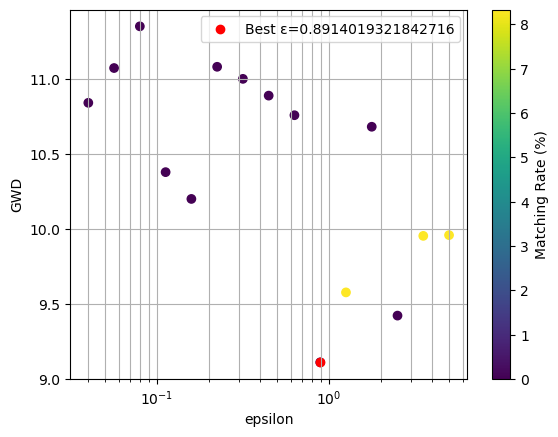

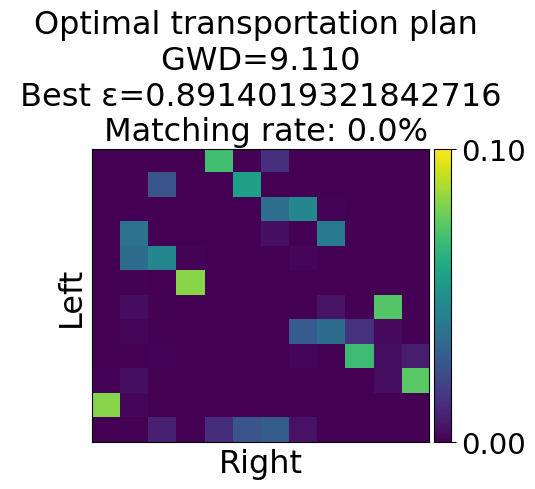

Skipping epsilon=0.04000000000000001 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 7
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsil

Best epsilon: 0.8914019321842716, Minimum GWD: 10.349


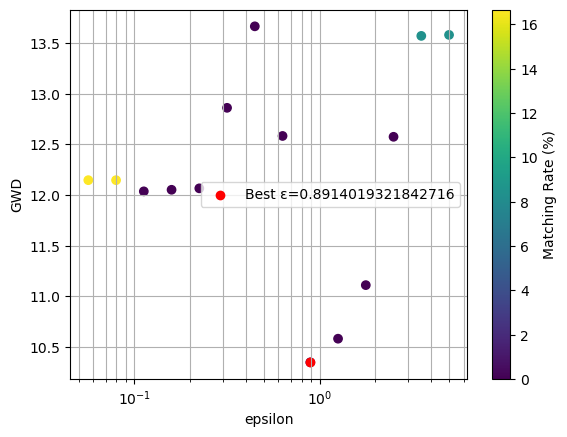

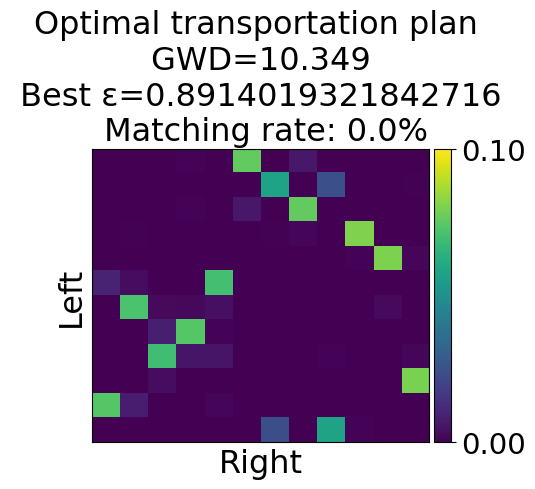

In [36]:
# --- 2. Compute GWOT between clusters ---
between_cluster_distances = []

for matrix_1 in cluster_1_matrices_similarity_distance_reordered:
    for matrix_2 in cluster_2_matrices_similarity_distance_reordered:
        _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
        between_cluster_distances.append(min_gwd)

In [37]:
# --- 3. Statistical Comparison ---

stat, p_value = mannwhitneyu(within_cluster_distances, between_cluster_distances, alternative='two-sided')

print("Mann-Whitney U test result:")
print(f"Statistic = {stat:.4f}, p-value = {p_value:.4e}")

# t-test
t_stat, t_p_value = ttest_ind(within_cluster_distances, between_cluster_distances)
print(f"t-test result: t = {t_stat:.4f}, p = {t_p_value:.4e}")

Mann-Whitney U test result:
Statistic = 2976.0000, p-value = 3.6823e-02
t-test result: t = -2.8028, p = 5.6579e-03


In [39]:
np.save(file="within_cluster_distance_2.npy", arr=within_cluster_distances)
np.save(file="between_cluster_distances_2.npy", arr=between_cluster_distances)


--- Normality Test for Within-Cluster Distances ---
Shapiro-Wilk: W = 0.9684, p = 3.8590e-02
D’Agostino & Pearson: stat = 4.3065, p = 1.1610e-01
=> Likely not normally distributed (p < 0.05)


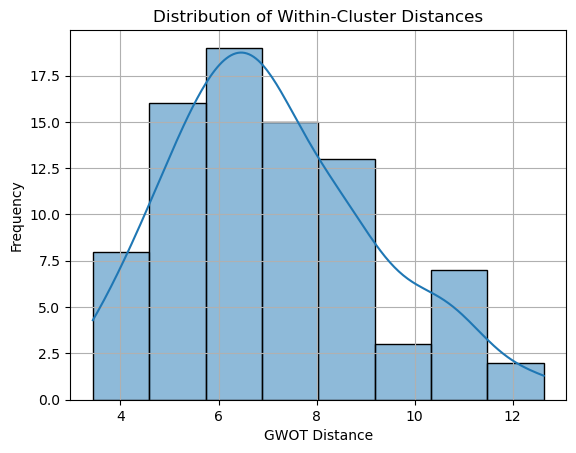


--- Normality Test for Between-Cluster Distances ---
Shapiro-Wilk: W = 0.9136, p = 2.1222e-05
D’Agostino & Pearson: stat = 16.0397, p = 3.2887e-04
=> Likely not normally distributed (p < 0.05)


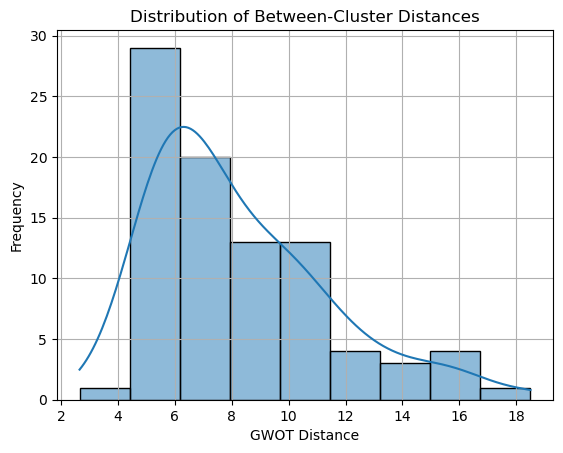

In [38]:
from scipy.stats import shapiro, normaltest
import matplotlib.pyplot as plt
import seaborn as sns

# --- Normality Tests ---
def test_normality(data, label):
    print(f"\n--- Normality Test for {label} ---")

    # Shapiro-Wilk Test
    shapiro_stat, shapiro_p = shapiro(data)
    print(f"Shapiro-Wilk: W = {shapiro_stat:.4f}, p = {shapiro_p:.4e}")

    # D'Agostino and Pearson Test
    dag_stat, dag_p = normaltest(data)
    print(f"D’Agostino & Pearson: stat = {dag_stat:.4f}, p = {dag_p:.4e}")

    # Interpretation
    if shapiro_p < 0.05 or dag_p < 0.05:
        print("=> Likely not normally distributed (p < 0.05)")
    else:
        print("=> Likely normally distributed (p ≥ 0.05)")

    # Optional: Plot
    sns.histplot(data, kde=True)
    plt.title(f"Distribution of {label}")
    plt.xlabel("GWOT Distance")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

# Run tests
test_normality(within_cluster_distances, "Within-Cluster Distances")
test_normality(between_cluster_distances, "Between-Cluster Distances")
